<a href="https://colab.research.google.com/github/FatmaRaafat/Identifying-Anomalous-County-Health-Profiles/blob/main/Identifying_Anomalous_County_Health_Profiles_An_Ensemble_Unsupervised_Learning_Approach.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Identifying Anomalous County Health Profiles: An Ensemble Unsupervised Learning Approach***

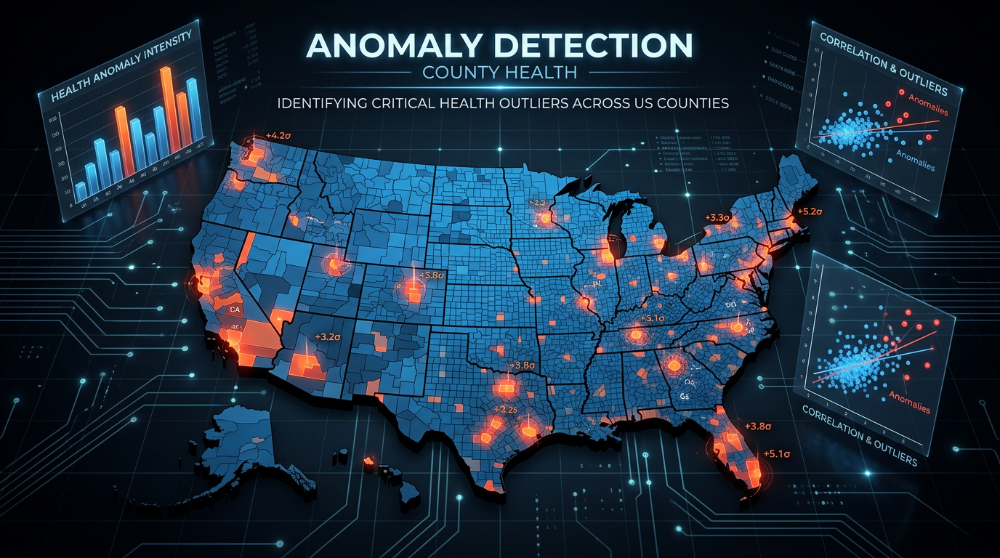

## ***Project Introduction***

This project focuses on identifying **anomalous county health profiles** across the United States using an **ensemble of unsupervised machine learning techniques**. Our goal is to pinpoint counties that significantly deviate from national health norms, understand the driving factors behind these anomalies, and provide actionable insights for public health interventions.

**Key Steps Involved:**
1.  **Data Preprocessing and Imputation:** Rigorous cleaning and handling of missing values, utilizing KNN imputation to preserve data distributions.
2.  **Anomaly Detection Models:** Implementation of three robust models: **Isolation Forest (IF)**, **Local Outlier Factor (LOF)**, and **One-Class Support Vector Machine (OCSVM)**.
3.  **Consensus Analysis:** Identifying a core group of counties consistently flagged as anomalous by all three models.
4.  **Feature Analysis:** Detailed investigation into the extreme features driving these anomalies.

**Key Findings:**
*   Identification of **267 unique anomalous counties**, with **58 highly robust anomalies** detected by all models.
*   Discovery of two distinct anomaly types: **'Distressed Rural' counties** (e.g., high mortality, poor food access, high poverty) and **'Affluent Urban Paradoxes'** (e.g., low obesity but high crime/drinking).
*   Significant **geographic clustering** of anomalies, particularly in rural Western and Southern states.
*   Specific counties like **Kusilvak, Alaska**, and **Oglala Lakota, South Dakota**, were identified as highly anomalous, driven by extreme multi-dimensional distress.

This analysis provides a critical foundation for targeted interventions to improve health equity across the nation.

# **1- Calling the dataset**

In [42]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


After running the cell above and following the instructions to authorize Google Drive, your Drive will be mounted at `/content/drive`. You can then navigate to find your '2018 county health ranking' dataset.

In [43]:
import pandas as pd

dataset_path = '/content/drive/MyDrive/2018 County Health Rankings Data.xls'

# The sheet names or indices ro be load
sheets_to_load = [1, 2, 3, 5] # Corresponds to 2nd, 3rd, 4th, and 6th sheets

# Loading each sheet into a dictionary of DataFrames
# Specifying header=1 to use the second row as column names, as 'FIPS' appears there.
dfs = pd.read_excel(dataset_path, sheet_name=sheets_to_load, header=1)

print('Datasets loaded successfully! Here are the first 5 rows of each specified sheet:')
for sheet_name, df_sheet in dfs.items():
    print(f"\n--- Sheet: {sheet_name} ---")
    display(df_sheet.head())

Datasets loaded successfully! Here are the first 5 rows of each specified sheet:

--- Sheet: 1 ---


,FIPS,State,County,# of Ranked Counties,Rank,Quartile,Rank.1,Quartile.1
0,1001,Alabama,Autauga,67,11,1,8,1
1,1003,Alabama,Baldwin,67,3,1,3,1
2,1005,Alabama,Barbour,67,34,2,56,4
3,1007,Alabama,Bibb,67,41,3,37,3
4,1009,Alabama,Blount,67,14,1,19,2



--- Sheet: 2 ---


,FIPS,State,County,# of Ranked Counties,Rank,Quartile,Rank.1,Quartile.1,Rank.2,Quartile.2,Rank.3,Quartile.3,Rank.4,Quartile.4,Rank.5,Quartile.5
0,1001,Alabama,Autauga,67,18,2,5,1,12,1,15,1,3,1,51,4
1,1003,Alabama,Baldwin,67,4,1,4,1,3,1,7,1,8,1,14,1
2,1005,Alabama,Barbour,67,14,1,49,3,57,4,20,2,58,4,16,1
3,1007,Alabama,Bibb,67,53,4,25,2,39,3,42,3,42,3,29,2
4,1009,Alabama,Blount,67,17,1,12,1,11,1,41,3,13,1,54,4



--- Sheet: 3 ---


,FIPS,State,County,Years of Potential Life Lost Rate,95% CI - Low,95% CI - High,Quartile,Years of Potential Life Lost Rate (Black),Years of Potential Life Lost Rate (Hispanic),Years of Potential Life Lost Rate (White),...,95% CI - High.20,Quartile.33,% Drive Alone (Black),% Drive Alone (Hispanic),% Drive Alone (White),# Workers who Drive Alone,% Long Commute - Drives Alone,95% CI - Low.21,95% CI - High.21,Quartile.34
0,1001.0,Alabama,Autauga,9409.294766,8492.111635,10326.477898,2,11806.223285,NaN,9148.381743,...,88.431482,4,82.494851,NaN,82.539683,21082.0,40.8,36.698437,44.901563,3
1,1003.0,Alabama,Baldwin,7467.596664,7025.900408,7909.292920,1,10335.702691,2827.348216,7484.117065,...,86.017804,2,85.567010,68.864800,84.646255,73058.0,40.1,37.614952,42.585048,3
2,1005.0,Alabama,Barbour,8929.474982,7633.929691,10225.020273,1,9141.333085,NaN,8896.000532,...,85.796041,1,80.341227,NaN,85.656228,7271.0,35.1,29.740946,40.459054,2
3,1007.0,Alabama,Bibb,11741.938889,10057.801626,13426.076153,4,11297.166352,NaN,11923.067966,...,89.905820,2,NaN,NaN,NaN,7044.0,48.8,40.894758,56.705242,4
4,1009.0,Alabama,Blount,9359.122343,8463.490290,10254.754396,1,NaN,5133.144570,9600.725685,...,87.622499,3,NaN,79.539642,81.580997,18384.0,60.2,55.818947,64.581053,4



--- Sheet: 5 ---


,FIPS,State,County,# Deaths,Age-Adjusted Mortality,95% CI - Low,95% CI - High,Age-Adjusted Mortality (Black),Age-Adjusted Mortality (Hispanic),Age-Adjusted Mortality (White),...,% Hispanic,# Non-Hispanic White,% Non-Hispanic White,# Not Proficient in English,% Not Proficient in English,95% CI - Low.13,95% CI - High.13,% Female,# Rural,% Rural
0,1001,Alabama,Autauga,827.0,449.6,418.5,480.7,531.7,NaN,444.9,...,2.688754,41562,75.000000,432,0.832739,0.457689,1.207789,51.288437,22921.0,42.002162
1,1003,Alabama,Baldwin,2753.0,351.3,337.5,365.1,517.8,111.1,349.3,...,4.416411,173529,83.202198,1540,0.818809,0.508623,1.128996,51.457833,77060.0,42.279099
2,1005,Alabama,Barbour,418.0,433.6,390.5,476.6,477.0,NaN,394.7,...,4.213364,12061,46.450992,382,1.519370,0.790980,2.247760,46.932409,18613.0,67.789635
3,1007,Alabama,Bibb,408.0,529.1,476.7,581.4,630.4,NaN,526.6,...,2.499669,16850,74.415934,96,0.448137,0.000000,1.041411,46.363114,15663.0,68.352607
4,1009,Alabama,Blount,996.0,480.2,449.2,511.2,NaN,NaN,NaN,...,9.068695,50472,87.467073,1018,1.878506,1.332987,2.424025,50.613476,51562.0,89.951502


# **2- Dataset preprocessing**

## a- feature selection

In [44]:
# Define the list of features to combine
raw_columns = [
    # ========== LENGTH OF LIFE (1) ==========
    'Years of Potential Life Lost Rate',

    # ========== QUALITY OF LIFE (4) ==========
    '% Fair/Poor',
    'Physically Unhealthy Days',
    'Mentally Unhealthy Days',
    '% Low Birthweight',

    # ========== HEALTH BEHAVIORS (7) ==========
    '% Smokers',
    '% Obese',
    'Food Environment Index',
    '% Physically Inactive',
    '% With Access to Exercise Opportunities',
    '% Excessive Drinking',
    '% Alcohol-Impaired Driving Deaths',

    # ========== CLINICAL CARE (5) ==========
    '% Uninsured',
    'Primary Care Physicians Rate',
    'Dentist Rate',
    'Mental Health Provider Rate',
    'Preventable Hospitalization Rate',

    # ========== SOCIAL & ECONOMIC (5) ==========
    'High School Graduation Rate',
    '% Some College',
    '% Unemployed',
    '% Children in Poverty',
    'Income Inequality Ratio',

    # ========== PHYSICAL ENVIRONMENT (4) ==========
    'Violent Crime Rate',
    'Injury Death Rate',
    'Average Daily PM2.5',
    '% Severe Housing Problems'
]

combined_df = pd.DataFrame()
first_merge = True

for sheet_id in sheets_to_load:
    df_sheet = dfs[sheet_id]

    if df_sheet.empty:
        print(f"Sheet {sheet_id} is empty, skipping.")
        continue

    # Ensure FIPS is present for merging
    if 'FIPS' not in df_sheet.columns:
        print(f"Sheet {sheet_id} does not have 'FIPS' column, skipping for merge.")
        continue

    # Columns to include from the current sheet
    current_sheet_cols = ['FIPS']
    if first_merge and 'State' in df_sheet.columns and 'County' in df_sheet.columns:
        current_sheet_cols.extend(['State', 'County'])

    # Add raw_columns that are present in the current sheet
    for col in raw_columns:
        if col in df_sheet.columns and col not in current_sheet_cols:
            current_sheet_cols.append(col)

    if len(current_sheet_cols) == 1 and 'FIPS' in current_sheet_cols:
        print(f"No new relevant columns (other than FIPS, State, County) found in Sheet {sheet_id}, skipping for merge.")
        continue

    df_to_merge = df_sheet[current_sheet_cols].copy()

    if first_merge:
        combined_df = df_to_merge
        first_merge = False
    else:
        # Merge with the combined_df, avoiding duplicate 'State' and 'County' columns
        # Use a suffix to handle potential overlapping column names (other than FIPS, State, County if they were accidentally duplicated)
        combined_df = pd.merge(combined_df, df_to_merge, on='FIPS', how='left', suffixes=('', f'_{sheet_id}'))

        # Drop any duplicated State/County columns that might arise from suffixing if not handled well
        for col_name in ['State', 'County']:
            if f'{col_name}_{sheet_id}' in combined_df.columns:
                combined_df = combined_df.drop(columns=[f'{col_name}_{sheet_id}'])

print("\nCombined Dataset:")
display(combined_df.head())
print(f"\nShape of combined dataset: {combined_df.shape}")

No new relevant columns (other than FIPS, State, County) found in Sheet 2, skipping for merge.

Combined Dataset:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,% Uninsured_5
0,1001,Alabama,Autauga,9409.294766,18.411124,4.200578,4.306739,19.124658,36.4,7.1,...,9.387712,32.48159,61.942019,5.271161,19.3,265.699747,72.584664,10.8,15.217927,12.193092
1,1003,Alabama,Baldwin,7467.596664,18.060458,4.098748,4.249649,16.795485,29.3,7.9,...,11.524397,49.38556,63.757100,5.415263,17.6,216.773078,71.492010,9.6,14.310156,14.719861
2,1005,Alabama,Barbour,8929.474982,25.773416,5.067438,4.634994,21.540878,44.2,5.5,...,13.310452,34.66205,39.723661,8.648518,39.6,328.659071,66.607792,10.1,15.254237,17.401551
3,1007,Alabama,Bibb,11741.938889,19.996912,4.363377,4.315710,19.916404,38.4,7.6,...,11.855881,22.08188,49.821371,6.637117,27.5,147.290900,95.709893,10.5,12.358757,15.070569
4,1009,Alabama,Blount,9359.122343,21.095323,4.512753,4.701599,19.652158,35.8,8.5,...,13.963659,19.06280,53.866457,5.520897,19.4,211.598836,104.572810,11.3,11.058037,17.699115



Shape of combined dataset: (3142, 22)


In [45]:
combined_df.shape

(3142, 22)

In [46]:
data_combined = combined_df.copy()
data_combined.head()


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,% Uninsured_5
0,1001,Alabama,Autauga,9409.294766,18.411124,4.200578,4.306739,19.124658,36.4,7.1,...,9.387712,32.48159,61.942019,5.271161,19.3,265.699747,72.584664,10.8,15.217927,12.193092
1,1003,Alabama,Baldwin,7467.596664,18.060458,4.098748,4.249649,16.795485,29.3,7.9,...,11.524397,49.38556,63.757100,5.415263,17.6,216.773078,71.492010,9.6,14.310156,14.719861
2,1005,Alabama,Barbour,8929.474982,25.773416,5.067438,4.634994,21.540878,44.2,5.5,...,13.310452,34.66205,39.723661,8.648518,39.6,328.659071,66.607792,10.1,15.254237,17.401551
3,1007,Alabama,Bibb,11741.938889,19.996912,4.363377,4.315710,19.916404,38.4,7.6,...,11.855881,22.08188,49.821371,6.637117,27.5,147.290900,95.709893,10.5,12.358757,15.070569
4,1009,Alabama,Blount,9359.122343,21.095323,4.512753,4.701599,19.652158,35.8,8.5,...,13.963659,19.06280,53.866457,5.520897,19.4,211.598836,104.572810,11.3,11.058037,17.699115


In [47]:
data_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Data columns (total 22 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   FIPS                               3142 non-null   int64  
 1   State                              3142 non-null   object 
 2   County                             3142 non-null   object 
 3   Years of Potential Life Lost Rate  2961 non-null   float64
 4   % Fair/Poor                        3142 non-null   float64
 5   Physically Unhealthy Days          3142 non-null   float64
 6   Mentally Unhealthy Days            3142 non-null   float64
 7   % Smokers                          3142 non-null   float64
 8   % Obese                            3142 non-null   float64
 9   Food Environment Index             3123 non-null   float64
 10  % Physically Inactive              3142 non-null   float64
 11  % Excessive Drinking               3142 non-null   float

## b- Dealing with Missing Values

### Checking for Missing Values

In [48]:
print("Missing values per column in the combined dataset:")
missing_values = data_combined.isnull().sum()
print(missing_values[missing_values > 0])

Missing values per column in the combined dataset:
Years of Potential Life Lost Rate    181
Food Environment Index                19
% Uninsured                            1
Dentist Rate                          83
% Unemployed                           1
% Children in Poverty                  1
Violent Crime Rate                   176
Injury Death Rate                    109
Average Daily PM2.5                   34
% Uninsured_5                          1
dtype: int64


### Distributions Before Missing Value Imputation

In [49]:
# Store the list of columns that originally had missing values
original_missing_columns_to_plot = combined_df.isnull().sum()
original_missing_columns_to_plot = original_missing_columns_to_plot[original_missing_columns_to_plot > 0].index.tolist()

Plotting distributions for columns that previously had missing values (Before Imputation):


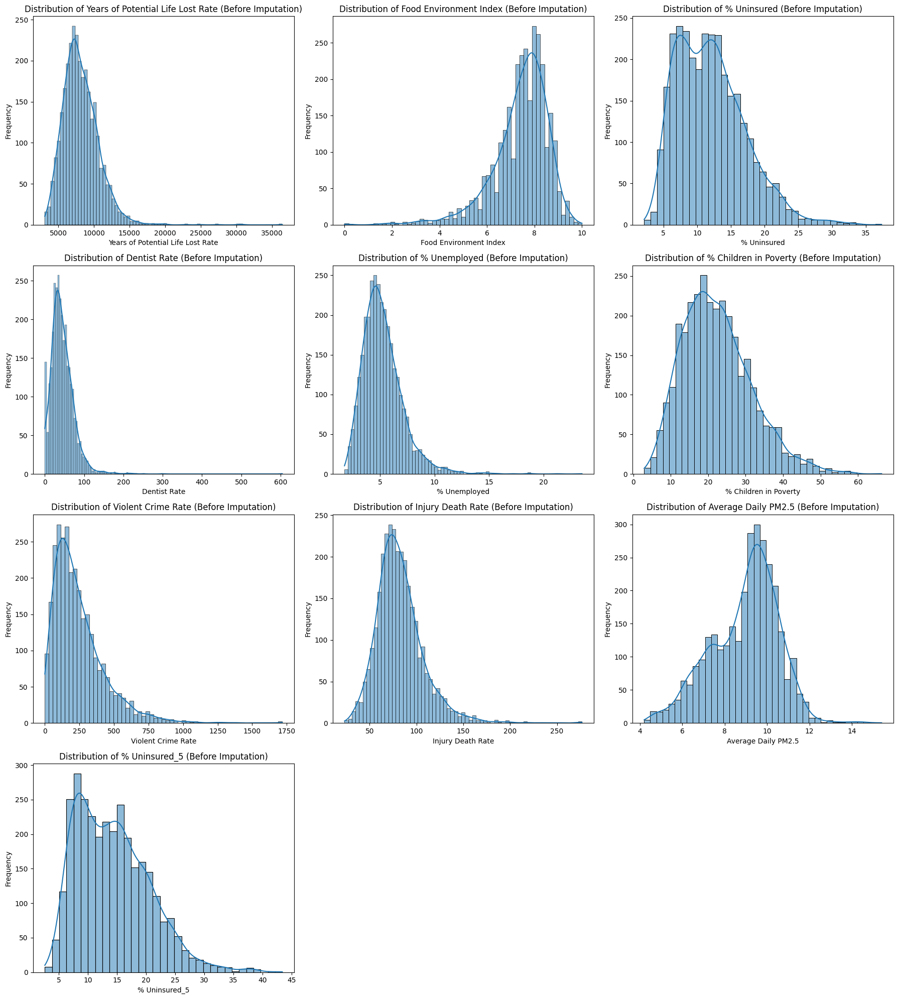

In [50]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Use the stored list of columns that originally had missing values
columns_to_plot = original_missing_columns_to_plot

print("Plotting distributions for columns that previously had missing values (Before Imputation):")

# Add a check for empty DataFrame or empty list of columns to plot
if combined_df.empty or not columns_to_plot:
    print("Warning: No plots can be generated because 'combined_df' is empty or 'original_missing_columns_to_plot' is empty.")
    print("This usually means data was not loaded or merged correctly in cells `be5bccf4` and `PX0tgNnzDS7L`.")
    print("Please check those cells to ensure data is being read and processed as expected.")
else:
    # Create a figure to hold multiple subplots
    num_cols = len(columns_to_plot)
    num_rows = (num_cols + 2) // 3 # Roughly 3 plots per row

    plt.figure(figsize=(18, num_rows * 5))

    for i, col in enumerate(columns_to_plot):
        if pd.api.types.is_numeric_dtype(combined_df[col]):
            plt.subplot(num_rows, 3, i + 1)
            sns.histplot(combined_df[col], kde=True)
            plt.title(f'Distribution of {col} (Before Imputation)')
            plt.xlabel(col)
            plt.ylabel('Frequency')
        else:
            print(f"Skipping {col} as it is not a numerical column in combined_df.")

    plt.tight_layout()
    plt.show()


### Imputing Missing Values using Median

In [51]:
# Impute missing values with the median of each column
for col in missing_values[missing_values > 0].index:
    if pd.api.types.is_numeric_dtype(data_combined[col]):
        median_value = data_combined[col].median()
        data_combined[col].fillna(median_value, inplace=True)
        print(f"Filled missing values in '{col}' with median: {median_value:.2f}")
    else:
        # For non-numeric columns, you might choose a different imputation strategy, e.g., mode
        # For now,only numeric columns will be imputed since no categorial features were used.
        print(f"Column '{col}' is not numeric, skipping imputation for now.")


Filled missing values in 'Years of Potential Life Lost Rate' with median: 7863.49
Filled missing values in 'Food Environment Index' with median: 7.60
Filled missing values in '% Uninsured' with median: 11.45
Filled missing values in 'Dentist Rate' with median: 39.75
Filled missing values in '% Unemployed' with median: 4.97
Filled missing values in '% Children in Poverty' with median: 21.30
Filled missing values in 'Violent Crime Rate' with median: 198.15
Filled missing values in 'Injury Death Rate' with median: 78.82
Filled missing values in 'Average Daily PM2.5' with median: 9.20
Filled missing values in '% Uninsured_5' with median: 13.57


/tmp/ipykernel_7842/2018529600.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_combined[col].fillna(median_value, inplace=True)


In [52]:
# Verify that there are no more missing values in the imputed columns
print("Missing values per column in the combined dataset:")
missing_values = data_combined.isnull().sum()
print(missing_values[missing_values > 0])

Missing values per column in the combined dataset:
Series([], dtype: int64)


### Distributions After Missing Value Imputation Using Median

Plotting distributions for columns that previously had missing values (After Imputation):


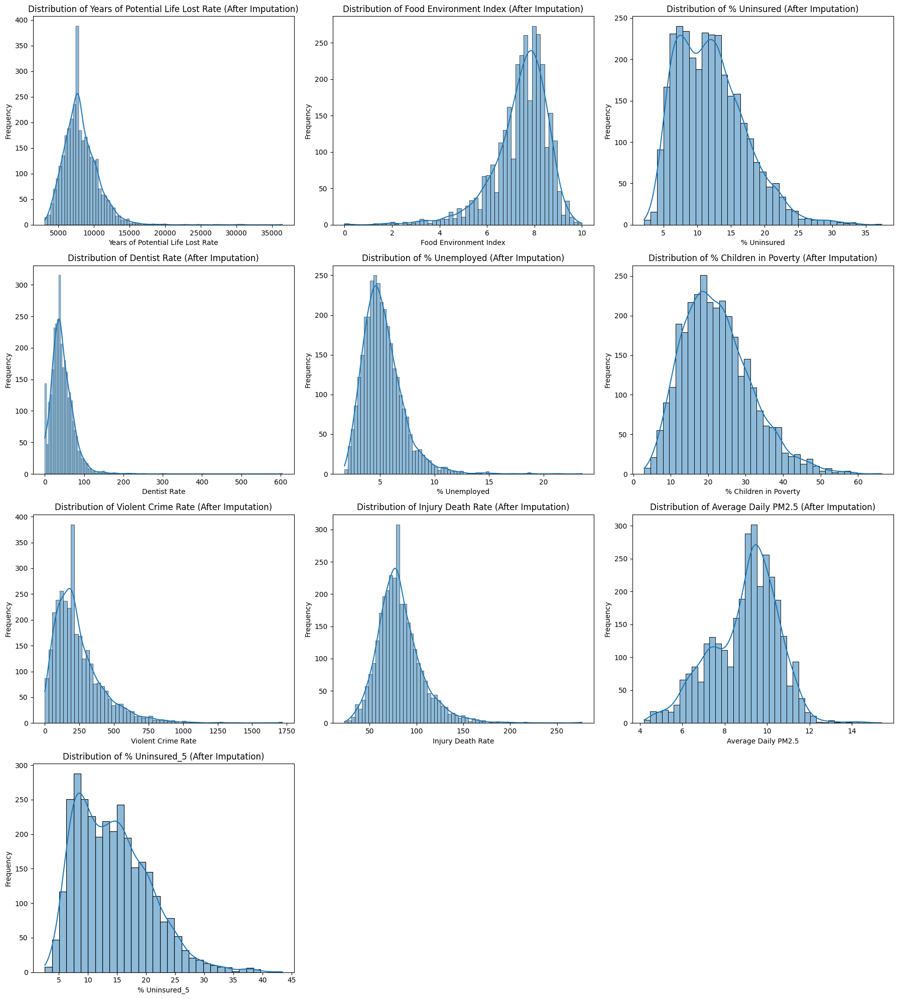

In [53]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Use the stored list of columns that originally had missing values
columns_to_plot = original_missing_columns_to_plot

print("Plotting distributions for columns that previously had missing values (After Imputation):")

# Create a figure to hold multiple subplots
num_cols = len(columns_to_plot)
num_rows = (num_cols + 2) // 3 # Roughly 3 plots per row

plt.figure(figsize=(18, num_rows * 5))

for i, col in enumerate(columns_to_plot):
    if pd.api.types.is_numeric_dtype(data_combined[col]):
        plt.subplot(num_rows, 3, i + 1)
        sns.histplot(data_combined[col], kde=True)
        plt.title(f'Distribution of {col} (After Imputation)')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    else:
        print(f"Skipping {col} as it is not a numerical column in data_combined.")

plt.tight_layout()
plt.show()

Comparison of the data distributions before and after missing value imputation revealed that median filling introduced a noticeable spike at the median value, significantly altering the original distribution shape. To address this issue, an alternative imputation method that preserves the original distribution is required.

### *K-Nearest Neighbors (KNN) Imputation*

For each data point with a missing value, the KNN imputer finds the k-nearest neighbors based on a specified distance metric (e.g., Euclidean distance, cosine similarity).
The missing value is then imputed using the mean or median of the values from the k-nearest neighbors.

In [54]:
from sklearn.impute import KNNImputer
import pandas as pd

data_knn_imputed = combined_df.copy()

# Identifying numeric columns from the list that originally had missing values
numeric_cols_for_knn = [col for col in original_missing_columns_to_plot if pd.api.types.is_numeric_dtype(data_knn_imputed[col])]

print(f"Applying KNN imputation to the following columns: {numeric_cols_for_knn}")

# Apply KNN imputation
knn_imputer = KNNImputer(n_neighbors=5)

# The imputer returns a numpy array, so we need to convert it back to a DataFrame
data_knn_imputed[numeric_cols_for_knn] = knn_imputer.fit_transform(data_knn_imputed[numeric_cols_for_knn])

# Verify that there are no more missing values in the imputed columns
print("\nMissing values in imputed columns after KNN imputation:")
print(data_knn_imputed[numeric_cols_for_knn].isnull().sum().sum())

print("\nFirst 5 rows of the DataFrame after KNN imputation:")
display(data_knn_imputed.head())


Applying KNN imputation to the following columns: ['Years of Potential Life Lost Rate', 'Food Environment Index', '% Uninsured', 'Dentist Rate', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Uninsured_5']

Missing values in imputed columns after KNN imputation:
0

First 5 rows of the DataFrame after KNN imputation:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,% Uninsured_5
0,1001,Alabama,Autauga,9409.294766,18.411124,4.200578,4.306739,19.124658,36.4,7.1,...,9.387712,32.48159,61.942019,5.271161,19.3,265.699747,72.584664,10.8,15.217927,12.193092
1,1003,Alabama,Baldwin,7467.596664,18.060458,4.098748,4.249649,16.795485,29.3,7.9,...,11.524397,49.38556,63.757100,5.415263,17.6,216.773078,71.492010,9.6,14.310156,14.719861
2,1005,Alabama,Barbour,8929.474982,25.773416,5.067438,4.634994,21.540878,44.2,5.5,...,13.310452,34.66205,39.723661,8.648518,39.6,328.659071,66.607792,10.1,15.254237,17.401551
3,1007,Alabama,Bibb,11741.938889,19.996912,4.363377,4.315710,19.916404,38.4,7.6,...,11.855881,22.08188,49.821371,6.637117,27.5,147.290900,95.709893,10.5,12.358757,15.070569
4,1009,Alabama,Blount,9359.122343,21.095323,4.512753,4.701599,19.652158,35.8,8.5,...,13.963659,19.06280,53.866457,5.520897,19.4,211.598836,104.572810,11.3,11.058037,17.699115


### Distributions After KNN Imputation

Plotting distributions for columns that previously had missing values (After KNN Imputation):


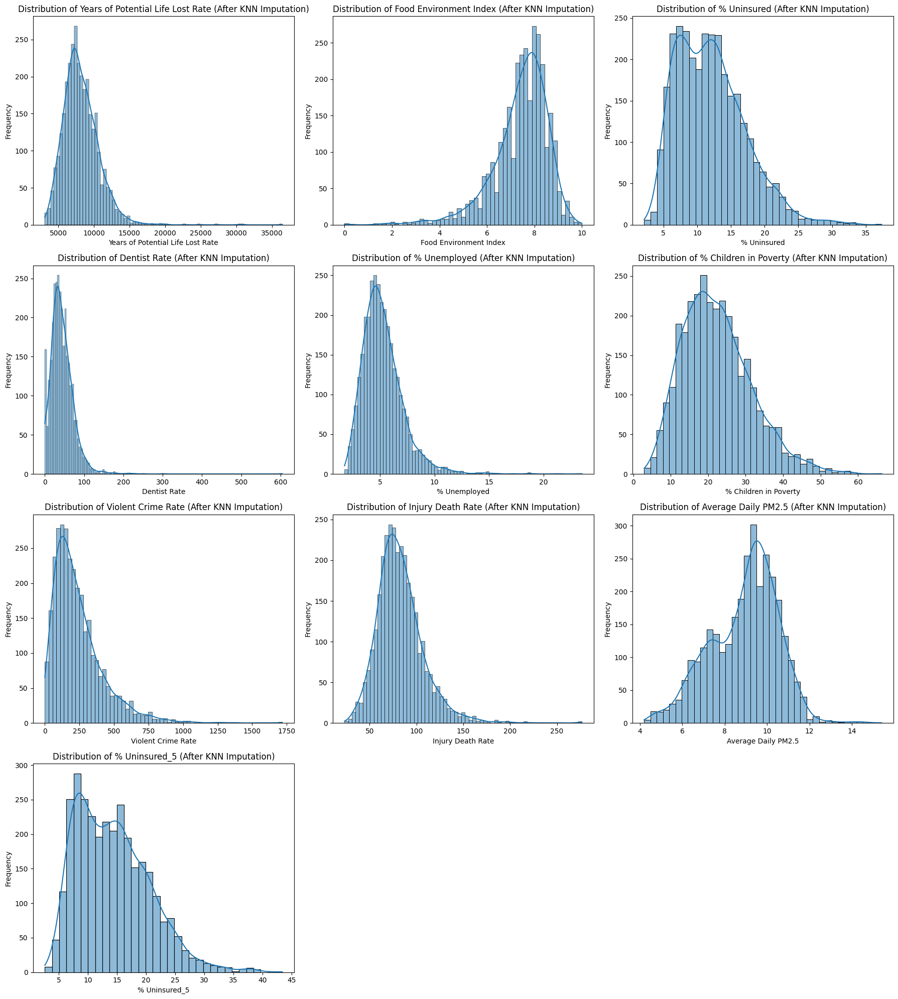

In [55]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Use the stored list of columns that originally had missing values
columns_to_plot = original_missing_columns_to_plot

print("Plotting distributions for columns that previously had missing values (After KNN Imputation):")

# Create a figure to hold multiple subplots
num_cols = len(columns_to_plot)
num_rows = (num_cols + 2) // 3 # Roughly 3 plots per row

plt.figure(figsize=(18, num_rows * 5))

for i, col in enumerate(columns_to_plot):
    if pd.api.types.is_numeric_dtype(data_knn_imputed[col]):
        plt.subplot(num_rows, 3, i + 1)
        sns.histplot(data_knn_imputed[col], kde=True)
        plt.title(f'Distribution of {col} (After KNN Imputation)')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    else:
        print(f"Skipping {col} as it is not a numerical column in data_knn_imputed.")

plt.tight_layout()
plt.show()

### Comparing Original Data Distribution with KNN Imputed Data Distribution

Plotting distributions for columns: Original vs. KNN Imputed Data


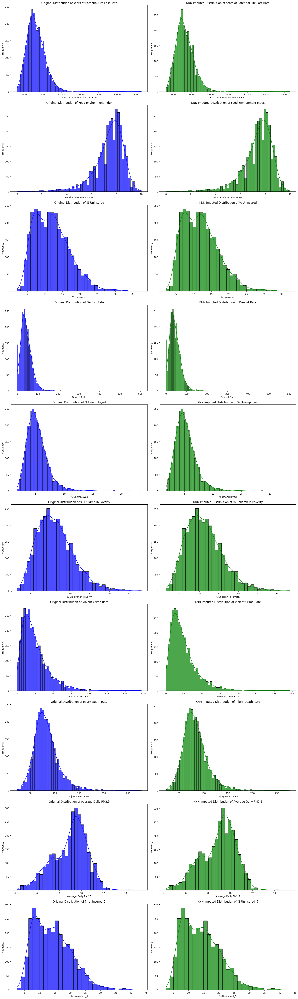

In [56]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Use the stored list of columns that originally had missing values
columns_to_compare = original_missing_columns_to_plot

print("Plotting distributions for columns: Original vs. KNN Imputed Data")

# Create a figure with subplots for distribution comparison
# Each feature gets two plots side by side: Original vs KNN Imputed
# Rows = number of features, Columns = 2 (Original, KNN Imputed)
num_cols_to_compare = len(columns_to_compare)
num_rows = num_cols_to_compare
plt.figure(figsize=(18, num_rows * 6)) # Adjust figure size for readability

for i, col in enumerate(columns_to_compare):
    if pd.api.types.is_numeric_dtype(combined_df[col]) and pd.api.types.is_numeric_dtype(data_knn_imputed[col]):
        # Plot for Original Data
        plt.subplot(num_rows, 2, (i * 2) + 1) # Position for original data plot
        sns.histplot(combined_df[col], kde=True, color='blue', alpha=0.7)
        plt.title(f'Original Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')

        # Plot for KNN Imputed Data
        plt.subplot(num_rows, 2, (i * 2) + 2) # Position for KNN imputed data plot
        sns.histplot(data_knn_imputed[col], kde=True, color='green', alpha=0.7)
        plt.title(f'KNN Imputed Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    else:
        print(f"Skipping {col} as it is not a numerical column for comparison.")

plt.tight_layout()
plt.show()

### Using Mean to Fill the Missing Data

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Make a copy of combined_df for mean imputation to preserve the original
data_mean_imputed = combined_df.copy()

# Identify numeric columns from the list that originally had missing values for mean imputation
numeric_cols_for_mean = [col for col in original_missing_columns_to_plot if pd.api.types.is_numeric_dtype(data_mean_imputed[col])]

print(f"Applying Mean imputation to the following columns: {numeric_cols_for_mean}")

# Impute missing values with the mean of each column in data_mean_imputed
for col in numeric_cols_for_mean:
    mean_value = data_mean_imputed[col].mean()
    data_mean_imputed[col] = data_mean_imputed[col].fillna(mean_value)

# Verify that there are no more missing values in the imputed columns
print("\nMissing values in imputed columns after Mean imputation:")
print(data_mean_imputed[numeric_cols_for_mean].isnull().sum().sum())

print("\nFirst 5 rows of the DataFrame after Mean imputation:")
display(data_mean_imputed.head())


Applying Mean imputation to the following columns: ['Years of Potential Life Lost Rate', 'Food Environment Index', '% Uninsured', 'Dentist Rate', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Uninsured_5']

Missing values in imputed columns after Mean imputation:
0

First 5 rows of the DataFrame after Mean imputation:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,% Uninsured_5
0,1001,Alabama,Autauga,9409.294766,18.411124,4.200578,4.306739,19.124658,36.4,7.1,...,9.387712,32.48159,61.942019,5.271161,19.3,265.699747,72.584664,10.8,15.217927,12.193092
1,1003,Alabama,Baldwin,7467.596664,18.060458,4.098748,4.249649,16.795485,29.3,7.9,...,11.524397,49.38556,63.757100,5.415263,17.6,216.773078,71.492010,9.6,14.310156,14.719861
2,1005,Alabama,Barbour,8929.474982,25.773416,5.067438,4.634994,21.540878,44.2,5.5,...,13.310452,34.66205,39.723661,8.648518,39.6,328.659071,66.607792,10.1,15.254237,17.401551
3,1007,Alabama,Bibb,11741.938889,19.996912,4.363377,4.315710,19.916404,38.4,7.6,...,11.855881,22.08188,49.821371,6.637117,27.5,147.290900,95.709893,10.5,12.358757,15.070569
4,1009,Alabama,Blount,9359.122343,21.095323,4.512753,4.701599,19.652158,35.8,8.5,...,13.963659,19.06280,53.866457,5.520897,19.4,211.598836,104.572810,11.3,11.058037,17.699115



Plotting distributions for columns: Original vs. KNN Imputed vs. Mean Imputed Data


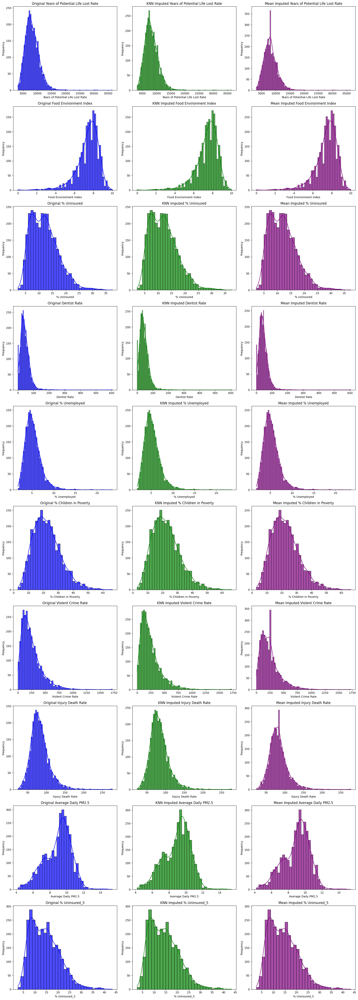

In [58]:
# --- Comparison Plots: Original vs. KNN vs. Mean Imputed Data ---

print("\nPlotting distributions for columns: Original vs. KNN Imputed vs. Mean Imputed Data")

columns_to_compare = original_missing_columns_to_plot

num_cols_to_compare = len(columns_to_compare)
# We'll have 3 plots per column (Original, KNN, Mean)
num_rows = num_cols_to_compare

plt.figure(figsize=(18, num_rows * 5)) # Adjust figure size for readability

for i, col in enumerate(columns_to_compare):
    if pd.api.types.is_numeric_dtype(combined_df[col]) and pd.api.types.is_numeric_dtype(data_knn_imputed[col]) and pd.api.types.is_numeric_dtype(data_mean_imputed[col]):
        # Plot for Original Data
        plt.subplot(num_rows, 3, (i * 3) + 1) # Position for original data plot
        sns.histplot(combined_df[col], kde=True, color='blue', alpha=0.7)
        plt.title(f'Original {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')

        # Plot for KNN Imputed Data
        plt.subplot(num_rows, 3, (i * 3) + 2) # Position for KNN imputed data plot
        sns.histplot(data_knn_imputed[col], kde=True, color='green', alpha=0.7)
        plt.title(f'KNN Imputed {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')

        # Plot for Mean Imputed Data
        plt.subplot(num_rows, 3, (i * 3) + 3) # Position for Mean imputed data plot
        sns.histplot(data_mean_imputed[col], kde=True, color='purple', alpha=0.7)
        plt.title(f'Mean Imputed {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    else:
        print(f"Skipping {col} as it is not a numerical column for comparison.")

plt.tight_layout()
plt.show()

Comparing KNN with the Mean, it is noticed that the mean in some of the features distribution ('Years of Potential Life Lost Rate', 'Dentist Rate', 'Violent Crime Rate', 'Injury Death Rate') also has created a spike, which is still undesirable. This means that KNN is still the better method till now since it doesn't affect the shape of the distribution, therefore, the complete dataset resulted from KNN will be used.

## c- Exploratory Data Analysis (EDA)

In [59]:
print("Descriptive Statistics of KNN-Imputed Data:")
display(data_knn_imputed.describe())

Descriptive Statistics of KNN-Imputed Data:


,FIPS,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,% Physically Inactive,% Excessive Drinking,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,% Uninsured_5
count,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000
mean,30383.649268,8217.305976,17.483261,3.922021,3.932145,17.872612,31.473679,7.402215,26.821642,17.411379,12.039698,43.920122,57.230574,5.259674,22.370261,241.095838,82.949411,8.931770,14.461825,14.288749
std,15162.508374,2524.479088,4.699417,0.714456,0.613682,3.660079,4.514139,1.186818,5.176125,3.242948,5.085799,30.064405,11.550330,1.889592,9.208454,186.620184,25.430907,1.587196,4.789521,6.248451
min,1001.000000,3122.595080,8.289167,2.323511,2.439654,6.735433,12.800000,0.000000,9.800000,9.265156,2.130475,0.000000,15.510340,1.746107,2.900000,0.000000,23.125641,4.200000,2.692308,2.615943
25%,18177.500000,6538.363192,13.942012,3.393395,3.494451,15.235070,28.800000,6.900000,23.600000,15.083152,7.996045,24.889032,49.238949,3.989984,15.600000,112.683599,66.651977,7.800000,11.456839,9.110009
50%,29176.000000,7880.232105,16.691579,3.870800,3.937506,17.320893,31.800000,7.600000,26.800000,17.376413,11.454340,39.372035,57.064722,4.965675,21.300000,194.703851,79.518596,9.200000,13.987739,13.568609
75%,45080.500000,9581.909548,20.476458,4.417652,4.348074,20.280274,34.400000,8.200000,30.200000,19.666507,15.143260,58.567057,65.513936,6.157976,27.900000,317.277201,95.233092,10.000000,16.680762,18.312144
max,56045.000000,36469.014359,40.732355,7.230990,5.964156,42.754056,47.800000,10.000000,44.400000,29.440119,37.353706,604.284930,94.047619,23.521070,66.300000,1717.731948,276.713495,15.400000,70.118343,43.395037


### Visualizing Distributions of Numerical Features

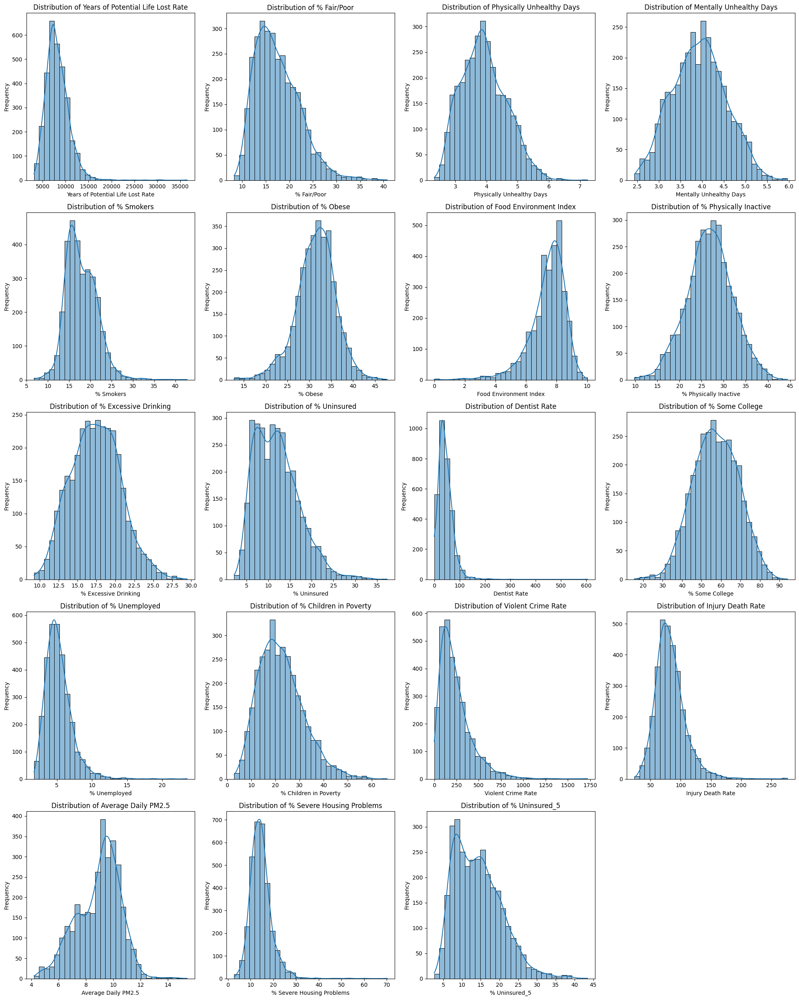

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

# Exclude non-numeric columns like 'State' and 'County', and identifier 'FIPS'
numeric_cols = data_knn_imputed.select_dtypes(include=['float64', 'int64']).columns.tolist()
exclude_cols = ['FIPS'] # FIPS is an identifier, not a feature to visualize distribution
numeric_cols = [col for col in numeric_cols if col not in exclude_cols]

# Determine grid size for subplots
num_features = len(numeric_cols)
num_rows = (num_features + 3) // 4 # Roughly 4 plots per row

plt.figure(figsize=(20, num_rows * 5))

for i, col in enumerate(numeric_cols):
    plt.subplot(num_rows, 4, i + 1)
    sns.histplot(data_knn_imputed[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

From these distributions, we can observe the spread and general shape of each feature. Some appear normally distributed, others skewed, and a few might show very little variance. Next, let's quantitatively check for features with very low variance.

In [61]:
# Calculate the variance for each numerical column
variances = data_knn_imputed[numeric_cols].var()

print("Variance of numerical features:")
print(variances.sort_values())

# Identify columns with very low variance (e.g., variance close to 0)
# A common threshold can be chosen based on the context of the data.
# For now, let's consider anything below a very small number as potentially constant.
low_variance_threshold = 0.1

low_variance_cols = variances[variances < low_variance_threshold].index.tolist()

if low_variance_cols:
    print(f"\nFeatures with variance below {low_variance_threshold}:")
    print(low_variance_cols)
    print("These features might be considered for removal if they do not provide significant information.")
else:
    print(f"\nNo features found with variance below {low_variance_threshold}.")

Variance of numerical features:
Mentally Unhealthy Days              3.766056e-01
Physically Unhealthy Days            5.104467e-01
Food Environment Index               1.408538e+00
Average Daily PM2.5                  2.519192e+00
% Unemployed                         3.570560e+00
% Excessive Drinking                 1.051671e+01
% Smokers                            1.339618e+01
% Obese                              2.037745e+01
% Fair/Poor                          2.208452e+01
% Severe Housing Problems            2.293951e+01
% Uninsured                          2.586535e+01
% Physically Inactive                2.679227e+01
% Uninsured_5                        3.904315e+01
% Children in Poverty                8.479562e+01
% Some College                       1.334101e+02
Injury Death Rate                    6.467310e+02
Dentist Rate                         9.038684e+02
Violent Crime Rate                   3.482709e+04
Years of Potential Life Lost Rate    6.372995e+06
dtype: float64

No

Low variance features are checked because they often provide very little information to a machine learning model. If a feature's values are almost constant across all data points (its variance is very low), it means that feature doesn't differentiate between observations much. Such features can sometimes be removed without significant loss of information, helping to reduce the dimensionality of the dataset and potentially improve model performance or reduce noise.

On the other hand, high variance is generally a desired characteristic in features. It indicates that the feature's values are widely distributed and vary significantly across different data points. This variability is what models use to learn patterns and make distinctions between different observations. Features with high variance are typically rich in information and are crucial for the model's ability to discriminate and predict.

### Correlation Matrix Heatmap

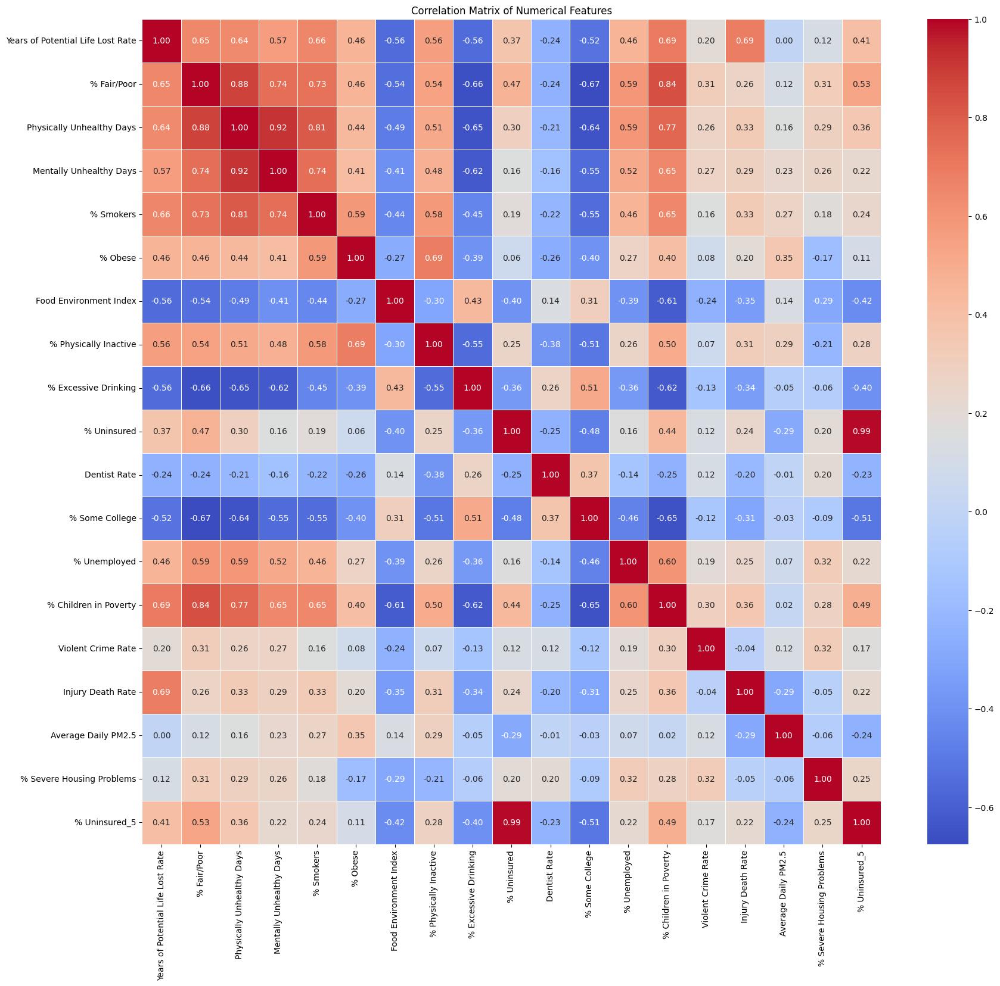


Features with high absolute correlation (e.g., > 0.8) might be redundant:
- Physically Unhealthy Days and % Fair/Poor: 0.88
- Mentally Unhealthy Days and Physically Unhealthy Days: 0.92
- % Smokers and Physically Unhealthy Days: 0.81
- % Children in Poverty and % Fair/Poor: 0.84
- % Uninsured_5 and % Uninsured: 0.99


In [62]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix for numerical columns
# Exclude 'FIPS' as it's an identifier and 'State', 'County' are categorical
# 'numeric_cols' identified earlier will be used as 'FIPS' is already excluded
correlation_matrix = data_knn_imputed[numeric_cols].corr()

plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

print("\nFeatures with high absolute correlation (e.g., > 0.8) might be redundant:")
# Find highly correlated pairs
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

if high_corr_pairs:
    for col1, col2, corr_val in high_corr_pairs:
        print(f"- {col1} and {col2}: {corr_val:.2f}")
else:
    print("No highly correlated pairs found above the 0.8 threshold.")

Uninsured_5 is a copy of Uninsured (0.99 correlation), it occured during the data loading and merging process.
When we merge multiple Excel sheets into a single `combined_df`, we use pd.merge with the `suffixes=('', f'_{sheet_id}')` parameter. This parameter tells pandas how to handle columns that have the same name in both DataFrames being merged.

In this case, it appears that the `combined_df` (from an earlier merged sheet) already contained a column named `% Uninsured`. When another sheet, specifically the one with `sheet_id=5`, was merged and it also contained a column named `% Uninsured`, pandas renamed the column from the sheet with `sheet_id=5` to `% Uninsured_5` to avoid a naming conflict.

Therefore, `% Uninsured_5` has to be dropped.

### Dropping Redundant Columns

In [63]:
data_knn_imputed = data_knn_imputed.drop(columns=['% Uninsured_5'])
print("Dropped '% Uninsured_5' column.")

# Verify the columns after dropping
print("\nRemaining columns in data_knn_imputed:")
print(data_knn_imputed.columns.tolist())

# Update numeric_cols list to reflect the dropped column for future use
numeric_cols = data_knn_imputed.select_dtypes(include=['float64', 'int64']).columns.tolist()
exclude_cols = ['FIPS']
numeric_cols = [col for col in numeric_cols if col not in exclude_cols]

print("\nUpdated list of numerical columns for analysis (excluding FIPS and dropped columns):")
print(numeric_cols)

Dropped '% Uninsured_5' column.

Remaining columns in data_knn_imputed:
['FIPS', 'State', 'County', 'Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']

Updated list of numerical columns for analysis (excluding FIPS and dropped columns):
['Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']


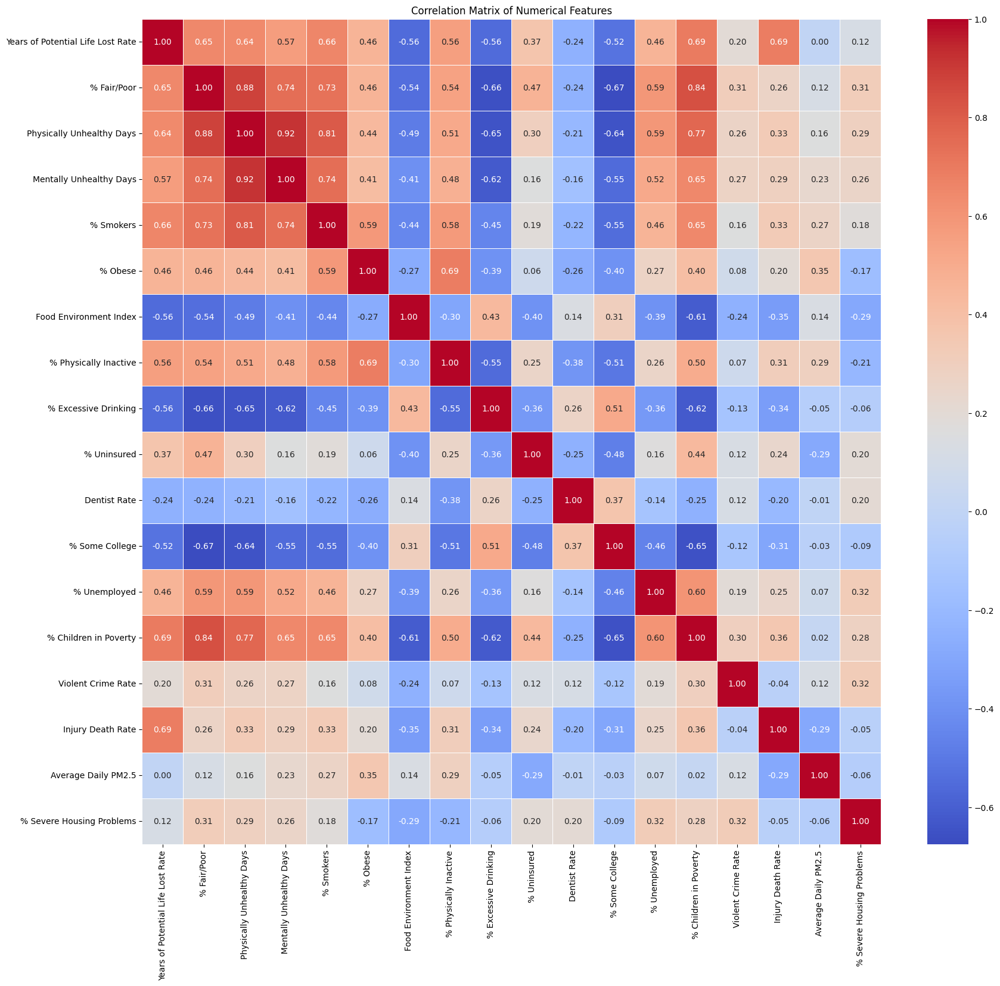


Features with high absolute correlation (e.g., > 0.8) might be redundant:
- Physically Unhealthy Days and % Fair/Poor: 0.88
- Mentally Unhealthy Days and Physically Unhealthy Days: 0.92
- % Smokers and Physically Unhealthy Days: 0.81
- % Children in Poverty and % Fair/Poor: 0.84


In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix for numerical columns
# Exclude 'FIPS' as it's an identifier and 'State', 'County' are categorical
# 'numeric_cols' will be used which already excludes 'FIPS'
correlation_matrix = data_knn_imputed[numeric_cols].corr()

plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

print("\nFeatures with high absolute correlation (e.g., > 0.8) might be redundant:")
# Find highly correlated pairs
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

if high_corr_pairs:
    for col1, col2, corr_val in high_corr_pairs:
        print(f"- {col1} and {col2}: {corr_val:.2f}")
else:
    print("No highly correlated pairs found above the 0.8 threshold.")

% Uninsured_5 has been dropped successfully, and this is our new correlation matrix.

For other correlated data, the decision to drop or keep them will be made according to the ML models that will be implemented.

### Visualizing Distributions with Box Plots for Anomaly Detection

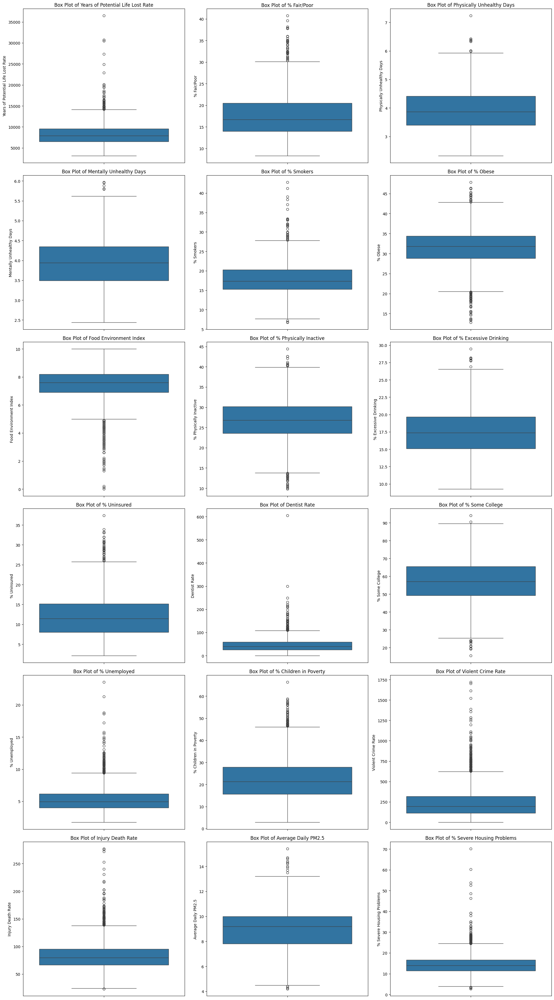

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

#  This time, the updated numeric_cols list (which excludes FIPS and '% Uninsured_5') is used

num_features = len(numeric_cols)
num_rows = (num_features + 2) // 3 # Roughly 3 plots per row

plt.figure(figsize=(20, num_rows * 6))

for i, col in enumerate(numeric_cols):
    plt.subplot(num_rows, 3, i + 1)
    sns.boxplot(y=data_knn_imputed[col])
    plt.title(f'Box Plot of {col}')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

Boxplots revealed outliers across multiple features. These feature-level outliers represent potential anomaly candidates that our ensemble methods will further validate.

Visual inspection of boxplots for all 16 features revealed substantial outliers beyond the 1.5 × IQR threshold. Features such as `Years of Potential Life Lost Rate`, `Food Environment Index`, `Violent Crime Rate`, `Injury Death Rate`, `Severe Housing Problems`, `Dentist Rate`, `Children Poverty` and `% Uninsured` exhibited the most extreme outliers. These feature-level anomalies serve as preliminary indicators of counties that may be identified as anomalous by our ensemble methods.

### Anomaly Detection using Z-score

In [66]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Ensure we are working with the latest `data_knn_imputed` which has '% Uninsured_5' dropped
# And re-create the scaled dataset based on this clean version.
data_for_zscore = data_knn_imputed.copy()

# Identify numerical columns for scaling (excluding FIPS, State, County)
numeric_cols_for_zscore = data_for_zscore.select_dtypes(include=np.number).columns.tolist()
if 'FIPS' in numeric_cols_for_zscore:
    numeric_cols_for_zscore.remove('FIPS')

print(f"Applying StandardScaler for Z-score calculation to: {numeric_cols_for_zscore}")

scaler = StandardScaler()
data_zscore = pd.DataFrame(scaler.fit_transform(data_for_zscore[numeric_cols_for_zscore]),
                          columns=numeric_cols_for_zscore,
                          index=data_for_zscore.index)

# Display the first few rows of the Z-score transformed data
print("\nFirst 5 rows of Z-score transformed data:")
display(data_zscore.head())

Applying StandardScaler for Z-score calculation to: ['Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']

First 5 rows of Z-score transformed data:


,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,% Physically Inactive,% Excessive Drinking,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems
0,0.472247,0.197474,0.389949,0.610502,0.342136,1.091483,-0.254684,0.788043,-0.164495,-0.521532,-0.380528,0.407971,0.006080,-0.333471,0.131860,-0.407630,1.177251,0.157891
1,-0.297023,0.122843,0.247398,0.517458,-0.294338,-0.481604,0.419495,-0.448600,-0.214780,-0.101338,0.181820,0.565141,0.082353,-0.518113,-0.130354,-0.450602,0.421080,-0.031672
2,0.282150,1.764362,1.603458,1.145482,1.002396,2.819662,-1.603041,0.730075,-1.453435,0.249903,-0.307990,-1.515948,1.793711,1.871376,0.469280,-0.642691,0.736151,0.165473
3,1.396404,0.534971,0.617850,0.625123,0.558490,1.534606,0.166678,2.063331,-0.458369,-0.036149,-0.726498,-0.641573,0.729079,0.557157,-0.502732,0.501850,0.988208,-0.439168
4,0.452370,0.768741,0.826959,1.254032,0.486282,0.958546,0.925129,0.420914,-0.626893,0.378361,-0.826934,-0.291304,0.138265,-0.322609,-0.158084,0.850416,1.492322,-0.710787


Now that we have the Z-scores for each feature, we can identify anomalies by setting a threshold. A common threshold for anomaly detection using Z-scores is usually `2`, `2.5`, `3`, or more, depending on how strict you want your anomaly detection to be. Values outside `+/- 3` standard deviations are often considered anomalies.

In [67]:
z_score_threshold = 3

# Identify anomalies for each feature
anomalies_df = (data_zscore.abs() > z_score_threshold)

# Count the number of anomalies per feature
anomaly_counts_per_feature = anomalies_df.sum()

print(f"Anomalies identified per feature (Z-score absolute value > {z_score_threshold}):")
display(anomaly_counts_per_feature[anomaly_counts_per_feature > 0].sort_values(ascending=False))

print("\nTotal number of rows with at least one anomaly:")
total_anomalous_rows = anomalies_df.any(axis=1).sum()
print(f"{total_anomalous_rows} out of {len(data_for_zscore)} rows contain at least one anomaly.")

# Display some rows that contain anomalies
print("\nSample of rows containing anomalies:")
# Get the original data for anomalous rows to see their actual values
anomalous_indices = anomalies_df.any(axis=1)[anomalies_df.any(axis=1)].index
display(data_for_zscore.loc[anomalous_indices].head())

Anomalies identified per feature (Z-score absolute value > 3):


,0
Food Environment Index,52
Violent Crime Rate,48
% Unemployed,41
Injury Death Rate,39
Dentist Rate,35
% Fair/Poor,33
% Uninsured,30
% Smokers,26
Years of Potential Life Lost Rate,25
% Severe Housing Problems,24



Total number of rows with at least one anomaly:
280 out of 3142 rows contain at least one anomaly.

Sample of rows containing anomalies:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Excessive Drinking,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems
12,1025,Alabama,Clarke,9133.840426,27.700529,5.034122,4.803871,20.933323,38.4,5.2,...,13.353695,12.556391,28.69793,38.972542,11.147173,38.9,439.428743,83.614729,9.6,13.023493
23,1047,Alabama,Dallas,12998.984568,28.705154,5.139039,5.075557,22.196835,42.4,4.3,...,12.016477,12.129690,32.49350,47.143620,9.394720,58.3,774.106604,93.880892,10.1,23.739237
31,1063,Alabama,Greene,14001.428517,34.098748,5.644849,5.255159,24.424960,42.3,3.0,...,9.953682,12.125639,11.87366,41.818182,10.127895,49.3,886.359016,85.898686,9.6,15.091463
42,1085,Alabama,Lowndes,14443.619257,30.048412,5.359850,5.121477,22.357405,46.2,4.4,...,10.758840,12.014093,9.65437,37.398025,10.754667,57.5,610.997963,115.189969,10.0,22.987165
43,1087,Alabama,Macon,13908.729130,29.978206,5.169402,4.851559,21.789731,47.8,3.8,...,11.820092,10.840551,26.36714,53.654234,7.730861,45.2,736.550489,84.940030,10.6,20.957711


The output above shows the number of potential anomalies detected for each feature based on the chosen Z-score threshold. It also provides a sample of rows from the original data that were flagged as anomalous in at least one feature, which can be useful for further investigation.

### Visualizing Anomalies in Top Correlated Features

Top correlated features are 'Mentally Unhealthy Days' and 'Physically Unhealthy Days' with correlation: 0.92


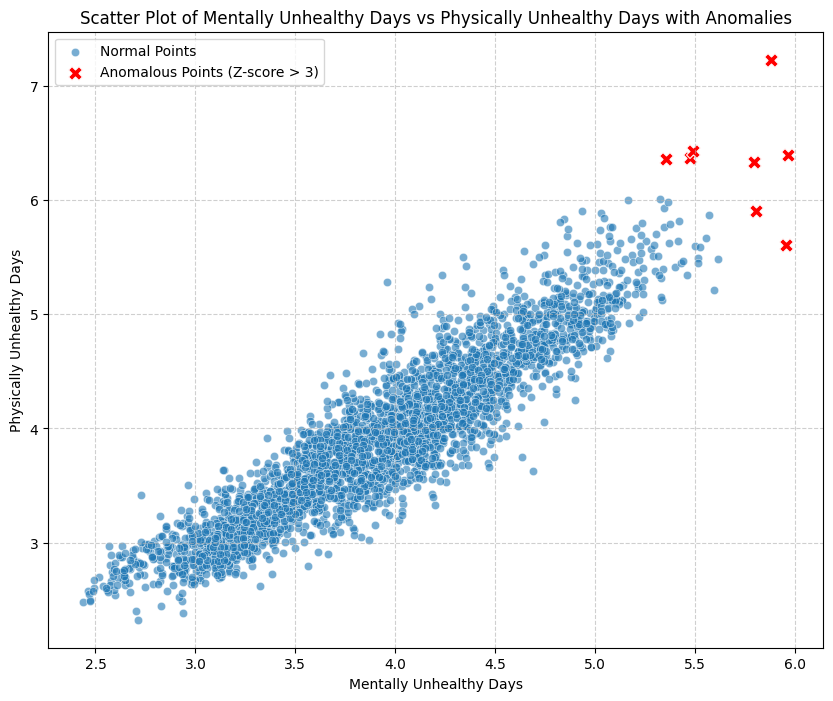

In [68]:
# Sort high_corr_pairs by absolute correlation value in descending order
sorted_high_corr_pairs = sorted(high_corr_pairs, key=lambda item: abs(item[2]), reverse=True)

if sorted_high_corr_pairs:
    top_corr_feature_1 = sorted_high_corr_pairs[0][0]
    top_corr_feature_2 = sorted_high_corr_pairs[0][1]
    correlation_value = sorted_high_corr_pairs[0][2]

    print(f"Top correlated features are '{top_corr_feature_1}' and '{top_corr_feature_2}' with correlation: {correlation_value:.2f}")

    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        x=data_knn_imputed[top_corr_feature_1],
        y=data_knn_imputed[top_corr_feature_2],
        alpha=0.6,
        label='Normal Points'
    )

    # Identify anomalous points specific to these two features
    # A point is considered anomalous if it's flagged as anomalous in either of the two features
    anomalous_points_indices = anomalies_df[(anomalies_df[top_corr_feature_1]) | (anomalies_df[top_corr_feature_2])].index
    anomalous_data = data_knn_imputed.loc[anomalous_points_indices]

    if not anomalous_data.empty:
        sns.scatterplot(
            x=anomalous_data[top_corr_feature_1],
            y=anomalous_data[top_corr_feature_2],
            color='red',
            s=100, # size of the points
            marker='X', # marker style for anomalies
            label=f'Anomalous Points (Z-score > {z_score_threshold})'
        )
    else:
        print("No anomalous points found for these features at the current Z-score threshold.")

    plt.title(f'Scatter Plot of {top_corr_feature_1} vs {top_corr_feature_2} with Anomalies')
    plt.xlabel(top_corr_feature_1)
    plt.ylabel(top_corr_feature_2)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
else:
    print("No highly correlated pairs found to visualize.")

# **3- Models' Implemetation**

### Feature Scaling with StandardScaler

In [69]:
from sklearn.preprocessing import StandardScaler

# Making a copy to avoid modifying the original KNN-imputed data directly
data_scaled = data_knn_imputed.copy()

# Identifying numerical columns to scale
numeric_cols_to_scale = data_scaled.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Exclude 'FIPS' as it's an identifier, not a feature to be scaled
if 'FIPS' in numeric_cols_to_scale:
    numeric_cols_to_scale.remove('FIPS')

print(f"Applying StandardScaler to the following columns: {numeric_cols_to_scale}")

# Initialize the StandardScaler
scaler = StandardScaler()

# Apply scaling to the selected numerical columns
data_scaled[numeric_cols_to_scale] = scaler.fit_transform(data_scaled[numeric_cols_to_scale])

print("\nFirst 5 rows of the DataFrame after scaling:")
display(data_scaled.head())

Applying StandardScaler to the following columns: ['Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']

First 5 rows of the DataFrame after scaling:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Excessive Drinking,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems
0,1001,Alabama,Autauga,0.472247,0.197474,0.389949,0.610502,0.342136,1.091483,-0.254684,...,-0.164495,-0.521532,-0.380528,0.407971,0.006080,-0.333471,0.131860,-0.407630,1.177251,0.157891
1,1003,Alabama,Baldwin,-0.297023,0.122843,0.247398,0.517458,-0.294338,-0.481604,0.419495,...,-0.214780,-0.101338,0.181820,0.565141,0.082353,-0.518113,-0.130354,-0.450602,0.421080,-0.031672
2,1005,Alabama,Barbour,0.282150,1.764362,1.603458,1.145482,1.002396,2.819662,-1.603041,...,-1.453435,0.249903,-0.307990,-1.515948,1.793711,1.871376,0.469280,-0.642691,0.736151,0.165473
3,1007,Alabama,Bibb,1.396404,0.534971,0.617850,0.625123,0.558490,1.534606,0.166678,...,-0.458369,-0.036149,-0.726498,-0.641573,0.729079,0.557157,-0.502732,0.501850,0.988208,-0.439168
4,1009,Alabama,Blount,0.452370,0.768741,0.826959,1.254032,0.486282,0.958546,0.925129,...,-0.626893,0.378361,-0.826934,-0.291304,0.138265,-0.322609,-0.158084,0.850416,1.492322,-0.710787


## a- Anomaly Detection using Isolation Forest

In [70]:
from sklearn.ensemble import IsolationForest


# Initialize the Isolation Forest model
# contamination: The proportion of outliers in the data set. This is a crucial parameter.
# random_state: for reproducibility
# A contamination estimate of 0.05 (5% anomalies) will be used as a starting point.
iso_forest = IsolationForest(contamination=0.05, random_state=42, n_jobs=-1)

# Fit the model and predict anomalies
# The fit_predict method returns -1 for outliers and 1 for inliers.
# The fitting is on the numerical columns of data_scaled, excluding State and County.
# Re-identifying the columns in data_scaled that are numerical for the Isolation Forest

features_for_isolation_forest = data_scaled.select_dtypes(include=np.number).columns.tolist()
if 'FIPS' in features_for_isolation_forest:
    features_for_isolation_forest.remove('FIPS') # FIPS is an identifier, not a feature

print(f"Applying Isolation Forest to the following {len(features_for_isolation_forest)} features:\n{features_for_isolation_forest}")

anomaly_predictions_if = iso_forest.fit_predict(data_scaled[features_for_isolation_forest])

# Add the anomaly predictions to the original data_knn_imputed DataFrame for easier analysis
data_knn_imputed['isolation_forest_anomaly'] = anomaly_predictions_if

# Count the number of anomalies (-1) and normal points (1)
num_anomalies_if = (data_knn_imputed['isolation_forest_anomaly'] == -1).sum()
num_normal_if = (data_knn_imputed['isolation_forest_anomaly'] == 1).sum()

print(f"\nTotal instances: {len(data_knn_imputed)}")
print(f"Anomalies detected by Isolation Forest: {num_anomalies_if}")
print(f"Normal instances detected by Isolation Forest: {num_normal_if}")
print(f"Proportion of anomalies: {num_anomalies_if / len(data_knn_imputed):.4f}")

# Display some of the detected anomalies
print("\nSample of rows identified as anomalies by Isolation Forest:")
display(data_knn_imputed[data_knn_imputed['isolation_forest_anomaly'] == -1].head())

Applying Isolation Forest to the following 18 features:
['Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']

Total instances: 3142
Anomalies detected by Isolation Forest: 158
Normal instances detected by Isolation Forest: 2984
Proportion of anomalies: 0.0503

Sample of rows identified as anomalies by Isolation Forest:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,isolation_forest_anomaly
23,1047,Alabama,Dallas,12998.984568,28.705154,5.139039,5.075557,22.196835,42.4,4.3,...,12.129690,32.49350,47.143620,9.394720,58.3,774.106604,93.880892,10.1,23.739237,-1
31,1063,Alabama,Greene,14001.428517,34.098748,5.644849,5.255159,24.424960,42.3,3.0,...,12.125639,11.87366,41.818182,10.127895,49.3,886.359016,85.898686,9.6,15.091463,-1
42,1085,Alabama,Lowndes,14443.619257,30.048412,5.359850,5.121477,22.357405,46.2,4.4,...,12.014093,9.65437,37.398025,10.754667,57.5,610.997963,115.189969,10.0,22.987165,-1
43,1087,Alabama,Macon,13908.729130,29.978206,5.169402,4.851559,21.789731,47.8,3.8,...,10.840551,26.36714,53.654234,7.730861,45.2,736.550489,84.940030,10.6,20.957711,-1
52,1105,Alabama,Perry,13552.698473,32.304996,5.764699,5.343086,23.270894,44.1,5.0,...,12.716601,20.88991,48.059049,10.585521,51.6,242.431157,71.061661,9.7,21.745789,-1


Isolation Forest works by building an ensemble of decision trees. It isolates observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of the selected feature. Recursive partitioning helps to isolate individual observations. Outliers are those observations that require fewer splits to be isolated. The `contamination` parameter controls the expected proportion of outliers in the dataset, which influences the decision boundary.

Visualizing the first Isolation Tree (out of 100) from the Isolation Forest model.


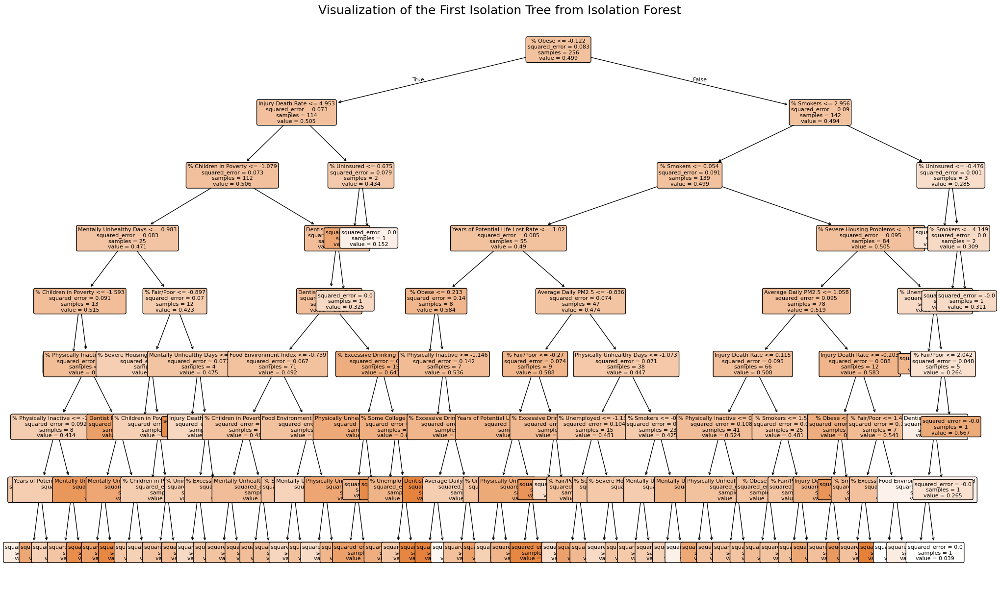

In [71]:
from sklearn.tree import plot_tree # This function is useful for visualizing decision trees

# Isolation Forest consists of many Isolation Trees. We can visualize one of them.
# The `iso_forest` model is an ensemble, its `estimators_` attribute contains the individual trees.

if iso_forest.estimators_ and len(iso_forest.estimators_) > 0:
    single_tree_estimator = iso_forest.estimators_[0]
    print(f"Visualizing the first Isolation Tree (out of {len(iso_forest.estimators_)}) from the Isolation Forest model.")

    plt.figure(figsize=(25, 15))
    # plot_tree requires feature names for better readability
    # `features_for_isolation_forest` contains the names of the features used.
    plot_tree(single_tree_estimator,
              feature_names=features_for_isolation_forest,
              filled=True,
              rounded=True,
              class_names=['Normal', 'Anomaly'], # Isolation forest doesn't have explicit classes like this, but we can label it for understanding the split
              fontsize=8)
    plt.title('Visualization of the First Isolation Tree from Isolation Forest', fontsize=18)
    plt.show()
else:
    print("Isolation Forest model or its estimators not found or are empty.")

Visualizing all trees in an ensemble model like Isolation Forest is generally not practical due to the large number of trees and their depth. Visualizing a single tree helps to understand the splitting logic.

### Visualizing Isolation Forest Anomalies

Visualizing anomaly distributions for: ['Years of Potential Life Lost Rate', '% Fair/Poor', 'Food Environment Index', 'Violent Crime Rate']


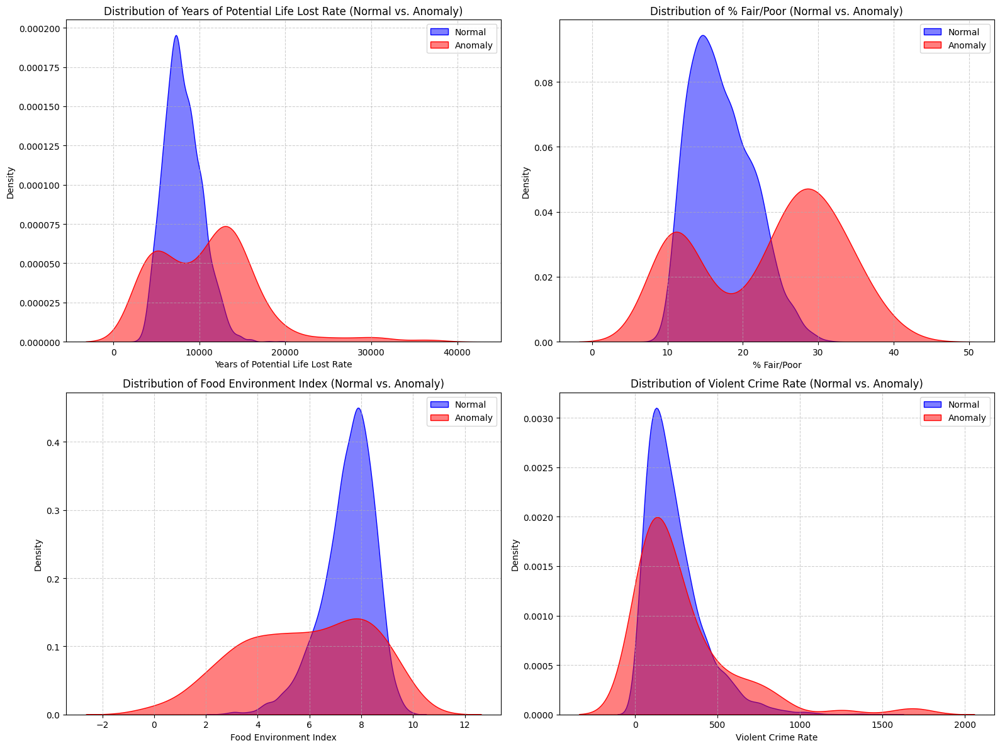

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select a few representative numerical features to visualize
# Let's pick some that had high anomaly counts in Z-score or are generally important
features_to_visualize = [
    'Years of Potential Life Lost Rate',
    '% Fair/Poor',
    'Food Environment Index',
    'Violent Crime Rate'
]

# Filter the data into normal and anomalous groups based on Isolation Forest predictions
normal_data = data_knn_imputed[data_knn_imputed['isolation_forest_anomaly'] == 1]
anomalous_data = data_knn_imputed[data_knn_imputed['isolation_forest_anomaly'] == -1]

print(f"Visualizing anomaly distributions for: {features_to_visualize}")

plt.figure(figsize=(16, 12))

for i, feature in enumerate(features_to_visualize):
    plt.subplot(2, 2, i + 1) # Arrange in a 2x2 grid

    # Plot distribution for normal points
    sns.kdeplot(normal_data[feature], label='Normal', color='blue', fill=True, alpha=0.5)
    # Plot distribution for anomalous points
    sns.kdeplot(anomalous_data[feature], label='Anomaly', color='red', fill=True, alpha=0.5)

    plt.title(f'Distribution of {feature} (Normal vs. Anomaly)')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

These plots show the density distributions of selected features for both normal and anomalous instances. It can be observed how the distributions for anomalous points (red) often deviate significantly from the normal points (blue), typically showing peaks in the tails or entirely separate clusters, indicating their unusual nature. This visual inspection helps to understand the characteristics of the identified anomalies.

**Key findings:**
1. **Years of Potential Life Lost Rate:** Anomalous counties have a bimodal distribution, indicating greater premature mortality for some counties and lower for others.
2. **% Fair/Poor:** The distribution for anomalies is also a bimodal distribution, reflecting worse self-reported health for some counties and better for others.
3. **Food Environment Index:** Anomalies cluster at lower values, suggesting poorer food access.
4. **Violent Crime Rate:** The distribution seems to be right skewed and similar to the normal data distribution, however we can notice that the density of crimes for that of anomalies is much less, meaning that these counties are much safer.

### Detailed Analysis of Isolation Forest Anomalies and Contributing Features

In [73]:
# Get the FIPS, State, and County for the Isolation Forest anomalies
if_anomalous_counties_info = data_knn_imputed[data_knn_imputed['isolation_forest_anomaly'] == -1][['FIPS', 'State', 'County']].copy()

# Merge with the Z-score transformed data to see the Z-scores of these anomalous counties
anomalies_zscores = pd.merge(
    if_anomalous_counties_info,
    data_zscore,
    left_index=True,
    right_index=True,
    how='inner'
)

# A slightly lower Z-score threshold than 3 can be used here to capture contributing factors
contribution_z_score_threshold = 2.5

# Store the analysis results for each anomalous county
anomalies_feature_breakdown = []

# `numeric_cols_for_zscore` was defined before
for index, row in anomalies_zscores.iterrows():
    fips = if_anomalous_counties_info.loc[index, 'FIPS']
    state = if_anomalous_counties_info.loc[index, 'State']
    county = if_anomalous_counties_info.loc[index, 'County']

    extreme_features = []
    for feature in numeric_cols_for_zscore: # Iterate over the numerical features used for Z-scoring
        z_score = row[feature]
        if z_score > contribution_z_score_threshold:
            extreme_features.append(f"{feature} (High: {z_score:.2f})")
        elif z_score < -contribution_z_score_threshold:
            extreme_features.append(f"{feature} (Low: {z_score:.2f})")


    anomalies_feature_breakdown.append({
        'FIPS': fips,
        'State': state,
        'County': county,
        'Num Extreme Features': len(extreme_features),
        'Extreme Features': extreme_features
    })

# Convert to DataFrame for easier viewing
anomalies_feature_breakdown_df = pd.DataFrame(anomalies_feature_breakdown)

print("Top 10 Isolation Forest Anomalies by Number of Extreme Z-score Features:")
display(anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).head(10))

# Count the occurrences of each extreme feature across all Isolation Forest anomalies
all_extreme_features = [item for sublist in anomalies_feature_breakdown_df['Extreme Features'] for item in sublist]
feature_contribution_counts = pd.Series(all_extreme_features).value_counts()

print("\nMost frequently extreme features among Isolation Forest Anomalies:")
display(feature_contribution_counts.head(10))

Top 10 Isolation Forest Anomalies by Number of Extreme Z-score Features:


,FIPS,State,County,Num Extreme Features,Extreme Features
11,2158,Alaska,Kusilvak,11,[Years of Potential Life Lost Rate (High: 8.91...
153,54047,West Virginia,McDowell,10,[Years of Potential Life Lost Rate (High: 4.41...
114,46017,South Dakota,Buffalo,9,[Years of Potential Life Lost Rate (High: 4.11...
122,46102,South Dakota,Oglala Lakota,8,[Years of Potential Life Lost Rate (High: 11.1...
22,5107,Arkansas,Phillips,7,[Years of Potential Life Lost Rate (High: 3.25...
16,2290,Alaska,Yukon-Koyukuk,7,[Years of Potential Life Lost Rate (High: 3.23...
78,28051,Mississippi,Holmes,7,[Years of Potential Life Lost Rate (High: 2.93...
123,46121,South Dakota,Todd,7,[Years of Potential Life Lost Rate (High: 6.60...
156,55078,Wisconsin,Menominee,7,[Years of Potential Life Lost Rate (High: 2.68...
154,54059,West Virginia,Mingo,6,[Years of Potential Life Lost Rate (High: 2.97...



Most frequently extreme features among Isolation Forest Anomalies:


,count
Average Daily PM2.5 (Low: -2.67),7
Food Environment Index (Low: -2.61),5
Food Environment Index (Low: -3.29),4
Food Environment Index (Low: -3.46),4
% Physically Inactive (Low: -2.86),3
% Children in Poverty (High: 2.72),3
Food Environment Index (Low: -2.87),3
% Unemployed (High: 2.58),3
Food Environment Index (Low: -4.05),3
% Fair/Poor (High: 2.74),3


Low / high indicates the standard deviation.

**Most Frequent Extreme Features Among All Anomalies**

| Rank | Feature | Direction | SD Value | Count | Interpretation |
|------|---------|-----------|----------|-------|----------------|
| 1 | Average Daily PM2.5 | ↓ LOW | -2.67 | 7 | Anomalies have cleaner air |
| 2 | Food Environment Index | ↓ LOW | -2.61 | 5 | Poor food access |
| 3 | Food Environment Index | ↓ LOW | -3.29 | 4 | Very poor food access |
| 4 | Food Environment Index | ↓ LOW | -3.46 | 4 | Extremely poor food access |
| 5 | % Physically Inactive | ↓ LOW | -2.86 | 3 | Less inactivity |
| 6 | % Children in Poverty | ↑ HIGH | +2.72 | 3 | More child poverty |
| 7 | Food Environment Index | ↓ LOW | -2.87 | 3 | Severely poor |
| 8 | % Unemployed | ↑ HIGH | +2.58 | 3 | Higher unemployment |
| 9 | Food Environment Index | ↓ LOW | -4.05 | 3 | Most severe |
| 10 | % Fair/Poor | ↑ HIGH | +2.74 | 3 | Worse self-rated health |

This analysis provides a more granular view of the Isolation Forest anomalies. For each county flagged by Isolation Forest, we now see how many and which specific features show extreme Z-scores. The 'High' or 'Low' indication for each feature's Z-score helps to identify if features are contributing in an opposing or 'contradicting' manner to the outlier status (e.g., one feature is extremely high while another is extremely low). This helps in understanding the characteristics of these outliers. Features appearing frequently in the 'Most frequently extreme features' list are strong indicators of what drives anomalies in this dataset.

### Visualizing the Most Frequently Extreme Features in Anomalous Counties

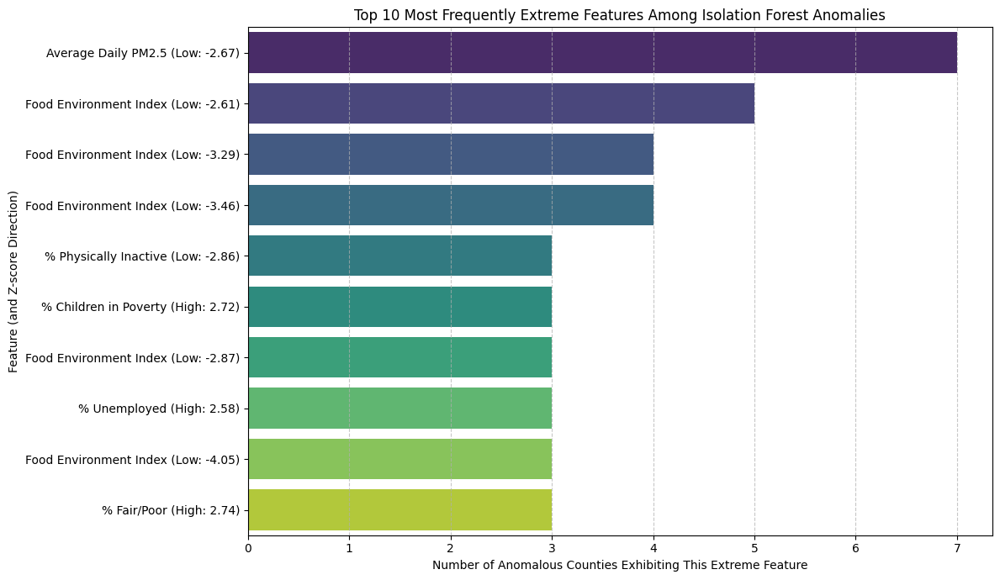

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 7))
sns.barplot(x=feature_contribution_counts.head(10).values, y=feature_contribution_counts.head(10).index, palette='viridis', hue=feature_contribution_counts.head(10).index, legend=False)
plt.title('Top 10 Most Frequently Extreme Features Among Isolation Forest Anomalies')
plt.xlabel('Number of Anomalous Counties Exhibiting This Extreme Feature')
plt.ylabel('Feature (and Z-score Direction)')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Example Breakdown of a Single Anomalous County


Let's take the top anomalous county, **Kusilvak, Alaska (FIPS: 2158)**, and explain its features. This county was flagged by Isolation Forest and has the highest number of individual features that show extreme Z-scores (11 features).

Here's what its `Extreme Features` list tells us:

In [110]:
# Get the details for the top anomalous county (Kusilvak, Alaska)
top_anomalous_county_info = anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).iloc[0]

print(f"County: {top_anomalous_county_info['County']}, {top_anomalous_county_info['State']} (FIPS: {top_anomalous_county_info['FIPS']})")
print(f"Total Extreme Features: {top_anomalous_county_info['Num Extreme Features']}")
print("Contributing Extreme Features:")
for feature_detail in top_anomalous_county_info['Extreme Features']:
    print(f"- {feature_detail}")

# Also print its full Z-score row for more context
print("\nFull Z-scores for this county:")
display(data_zscore.loc[top_anomalous_county_info.name].to_frame().T)

print("\nInterpretation:")
print("\nEach item in 'Extreme Features' lists a specific characteristic of this county that is significantly different from the average county. For example, for Kusilvak:\n")

for feature_detail in top_anomalous_county_info['Extreme Features']:
    feature_name = feature_detail.split(' (')[0]
    direction = feature_detail.split(' (')[1].split(':')[0]
    z_score_str = feature_detail.split(' (')[1].split(':')[1].replace(')', '')
    z_score = float(z_score_str)

    if direction == 'High':
        print(f"- '{feature_name} (High: {z_score:.2f})': This means the '{feature_name}' in Kusilvak County is {z_score:.2f} standard deviations *higher* than the average county. This indicates a much higher value for this characteristic compared to others.")
    elif direction == 'Low':
        print(f"- '{feature_name} (Low: {z_score:.2f})': This means the '{feature_name}' in Kusilvak County is {abs(z_score):.2f} standard deviations *lower* than the average county. This indicates a much lower value for this characteristic compared to others.")

print("\nThe combination of these 'High' and 'Low' values across multiple features (e.g., some metrics being very high while others are very low) is what makes this county a strong anomaly as detected by Isolation Forest. These individual extreme features collectively contribute to its overall anomalous status, sometimes in 'contradictory' directions, highlighting its unusualness.")

County: Kusilvak, Alaska (FIPS: 2158)
Total Extreme Features: 11
Contributing Extreme Features:
- Years of Potential Life Lost Rate (High: 8.91)
- % Fair/Poor (High: 4.36)
- Physically Unhealthy Days (High: 4.63)
- Mentally Unhealthy Days (High: 3.18)
- % Smokers (High: 6.80)
- Food Environment Index (Low: -4.55)
- % Some College (Low: -2.95)
- % Unemployed (High: 8.48)
- % Children in Poverty (High: 2.50)
- Injury Death Rate (High: 7.56)
- % Severe Housing Problems (High: 11.62)

Full Z-scores for this county:


,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,% Physically Inactive,% Excessive Drinking,% Uninsured,Dentist Rate,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems
11,1.32379,1.410617,1.142489,1.343144,0.32503,1.778323,-1.013134,1.213139,-1.352731,-0.043649,0.075137,-0.131961,1.918204,1.111084,-0.694949,1.111169,0.42108,-0.204158



Interpretation:

Each item in 'Extreme Features' lists a specific characteristic of this county that is significantly different from the average county. For example, for Kusilvak:

- 'Years of Potential Life Lost Rate (High: 8.91)': This means the 'Years of Potential Life Lost Rate' in Kusilvak County is 8.91 standard deviations *higher* than the average county. This indicates a much higher value for this characteristic compared to others.
- '% Fair/Poor (High: 4.36)': This means the '% Fair/Poor' in Kusilvak County is 4.36 standard deviations *higher* than the average county. This indicates a much higher value for this characteristic compared to others.
- 'Physically Unhealthy Days (High: 4.63)': This means the 'Physically Unhealthy Days' in Kusilvak County is 4.63 standard deviations *higher* than the average county. This indicates a much higher value for this characteristic compared to others.
- 'Mentally Unhealthy Days (High: 3.18)': This means the 'Mentally Unhealthy Days' in Kus

### Visualizing Top Anomalous Counties by Number of Extreme Features

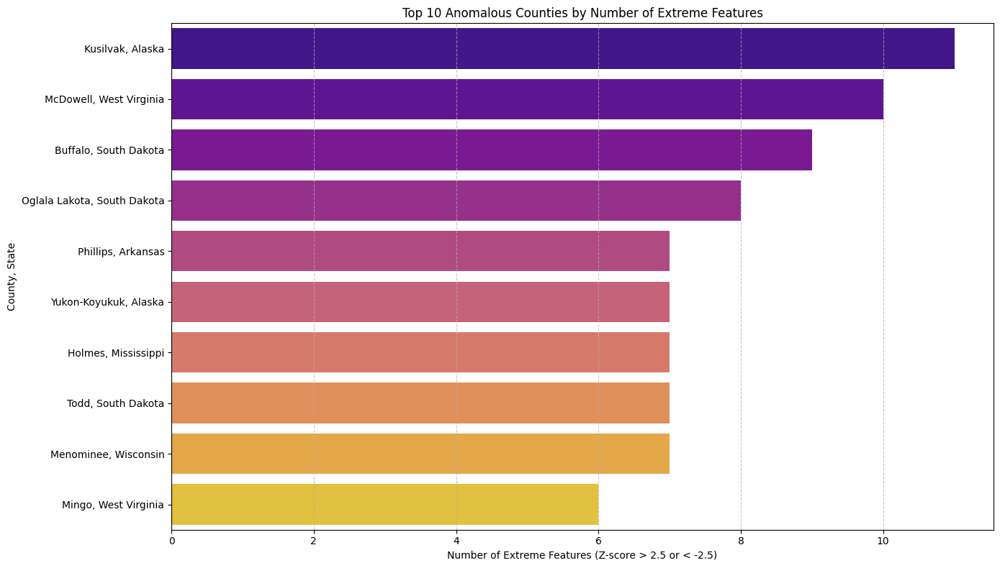

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the DataFrame by 'Num Extreme Features' in descending order
top_anomalous_counties = anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).head(10)

# Create a combined 'County, State' label for better readability on the plot
top_anomalous_counties['County_State'] = top_anomalous_counties['County'] + ', ' + top_anomalous_counties['State']

plt.figure(figsize=(14, 8))
sns.barplot(x='Num Extreme Features', y='County_State', data=top_anomalous_counties, palette='plasma', hue='County_State', legend=False)
plt.title('Top 10 Anomalous Counties by Number of Extreme Features')
plt.xlabel('Number of Extreme Features (Z-score > 2.5 or < -2.5)')
plt.ylabel('County, State')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

This bar plot clearly shows the top 10 counties that were identified as anomalies by the Isolation Forest model, ranked by the number of features that exhibit extreme (high or low) Z-scores within those counties. This visualization should make it much easier to identify and compare the most anomalous regions in your dataset.

## b- Anomaly Detection using Local Outlier Factor (LOF)

### Applying LOF

In [77]:
from sklearn.neighbors import LocalOutlierFactor
import numpy as np

# Ensure we use the same features as for Isolation Forest (scaled numerical features)
# `features_for_isolation_forest` was defined previously, we need to ensure it's still clean
# from anomaly labels from previous models if they were added to `data_scaled`.
features_for_lof = [col for col in features_for_isolation_forest if col not in ['isolation_forest_anomaly', 'lof_anomaly']]

print(f"Applying Local Outlier Factor to the following {len(features_for_lof)} features:\n{features_for_lof}")

# Initialize the Local Outlier Factor model
# n_neighbors: Number of neighbors to use by default for kneighbors queries.
# contamination: The amount of contamination of the dataset, i.e. the proportion of outliers in the dataset.
#                Used when fitting to define the threshold on the scores of the samples.
#                Similar to Isolation Forest, we can use 0.05 here.
# novelty=False for unsupervised outlier detection (training data contains outliers).
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05, novelty=False)

# Fit the model and predict anomalies
# LOF's fit_predict method returns -1 for outliers and 1 for inliers.
# We are fitting on the scaled numerical columns.
anomaly_predictions_lof = lof.fit_predict(data_scaled[features_for_lof])

# Get the raw anomaly scores (the opposite of the LOF scores, so positive means more anomalous)
# A lower LOF score indicates a higher degree of abnormality. We multiply by -1 to make higher values more anomalous.
anomaly_scores_lof = -lof.negative_outlier_factor_

# Add the anomaly predictions and scores to the original data_knn_imputed DataFrame for easier analysis
data_knn_imputed['lof_anomaly'] = anomaly_predictions_lof
data_knn_imputed['lof_anomaly_score'] = anomaly_scores_lof

# Count the number of anomalies (-1) and normal points (1)
num_anomalies_lof = (data_knn_imputed['lof_anomaly'] == -1).sum()
num_normal_lof = (data_knn_imputed['lof_anomaly'] == 1).sum()

print(f"\nTotal instances: {len(data_knn_imputed)}")
print(f"Anomalies detected by Local Outlier Factor: {num_anomalies_lof}")
print(f"Normal instances detected by Local Outlier Factor: {num_normal_lof}")
print(f"Proportion of anomalies: {num_anomalies_lof / len(data_knn_imputed):.4f}")

print("\nSample of rows identified as anomalies by LOF (including their anomaly score):")
display(data_knn_imputed[data_knn_imputed['lof_anomaly'] == -1].sort_values(by='lof_anomaly_score', ascending=False).head())

Applying Local Outlier Factor to the following 18 features:
['Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']

Total instances: 3142
Anomalies detected by Local Outlier Factor: 158
Normal instances detected by Local Outlier Factor: 2984
Proportion of anomalies: 0.0503

Sample of rows identified as anomalies by LOF (including their anomaly score):


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Some College,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,isolation_forest_anomaly,lof_anomaly,lof_anomaly_score
412,13053,Georgia,Chattahoochee,8904.411776,19.398351,4.084020,3.758120,19.643414,28.2,4.3,...,72.372119,8.400189,22.8,0.000000,34.996500,10.60,14.615385,-1,-1,3.642173
81,2158,Alaska,Kusilvak,30717.362820,37.948393,7.230990,5.880396,42.754056,27.5,2.0,...,23.161765,21.278195,45.4,138.380487,275.247723,7.76,70.118343,-1,-1,2.317364
2925,51610,Virginia,Falls Church City,3790.936541,11.013823,2.715511,3.107236,12.837128,28.1,6.1,...,90.481400,2.717665,3.4,134.318334,35.167927,10.10,13.091641,-1,-1,2.189963
2270,42053,Pennsylvania,Forest,6123.084509,15.940378,3.713705,3.815319,17.251470,31.4,8.0,...,15.510340,8.033827,57.1,376.137159,98.543159,9.10,9.638554,1,-1,2.145003
71,2060,Alaska,Bristol Bay,12753.701246,15.454088,3.745194,3.511147,20.041734,39.1,6.6,...,60.515021,6.947891,14.2,67.294751,276.713495,6.80,13.750000,-1,-1,2.137745


LOF (Local Outlier Factor) works by measuring the local deviation of density of a given data point with respect to its neighbors. It considers as outliers samples that have a substantially lower density than their neighbors. The 'anomaly score' (negative_outlier_factor_ in `sklearn`, which we've inverted to make higher values more anomalous) represents the degree of outlierness. A score significantly greater than 1 typically indicates an outlier. The `contamination` parameter helps in setting the threshold for deciding what constitutes an anomaly.

### Overlap Analysis: Isolation Forest vs. Local Outlier Factor Anomalies

In [78]:
# Get the indices/FIPS of anomalies from Isolation Forest
if_anomalies = data_knn_imputed[data_knn_imputed['isolation_forest_anomaly'] == -1]
if_anomalies_fips = set(if_anomalies['FIPS'])

# Get the indices/FIPS of anomalies from Local Outlier Factor
lof_anomalies = data_knn_imputed[data_knn_imputed['lof_anomaly'] == -1]
lof_anomalies_fips = set(lof_anomalies['FIPS'])

# Calculate the overlap (intersection) of FIPS codes
overlap_fips = if_anomalies_fips.intersection(lof_anomalies_fips)

# Number of unique anomalies from each method
num_if_anomalies = len(if_anomalies_fips)
num_lof_anomalies = len(lof_anomalies_fips)
num_overlap_anomalies = len(overlap_fips)

print(f"Number of anomalies detected by Isolation Forest: {num_if_anomalies}")
print(f"Number of anomalies detected by Local Outlier Factor: {num_lof_anomalies}")
print(f"Number of overlapping anomalies (FIPS codes common to both): {num_overlap_anomalies}")

# Calculate the proportion of overlap
overlap_proportion_if = num_overlap_anomalies / num_if_anomalies if num_if_anomalies > 0 else 0
overlap_proportion_lof = num_overlap_anomalies / num_lof_anomalies if num_lof_anomalies > 0 else 0

print(f"Proportion of Isolation Forest anomalies also detected by LOF: {overlap_proportion_if:.2f}")
print(f"Proportion of LOF anomalies also detected by Isolation Forest: {overlap_proportion_lof:.2f}")

# Display some of the overlapping anomalous counties
if num_overlap_anomalies > 0:
    print("\nSample of overlapping anomalous counties:")
    overlap_df = data_knn_imputed[data_knn_imputed['FIPS'].isin(overlap_fips)]
    display(overlap_df[['FIPS', 'State', 'County', 'isolation_forest_anomaly', 'lof_anomaly', 'lof_anomaly_score']].head())
else:
    print("\nNo overlapping anomalous counties found.")

Number of anomalies detected by Isolation Forest: 158
Number of anomalies detected by Local Outlier Factor: 158
Number of overlapping anomalies (FIPS codes common to both): 72
Proportion of Isolation Forest anomalies also detected by LOF: 0.46
Proportion of LOF anomalies also detected by Isolation Forest: 0.46

Sample of overlapping anomalous counties:


,FIPS,State,County,isolation_forest_anomaly,lof_anomaly,lof_anomaly_score
70,2050,Alaska,Bethel,-1,-1,1.920864
71,2060,Alaska,Bristol Bay,-1,-1,2.137745
72,2068,Alaska,Denali,-1,-1,1.522050
81,2158,Alaska,Kusilvak,-1,-1,2.317364
84,2180,Alaska,Nome,-1,-1,1.556910


This analysis provides a quantitative measure of how much the two anomaly detection methods agree. A high proportion indicates that both methods tend to identify a similar set of outliers. If the overlap is low, it suggests that the methods are sensitive to different types of anomalous patterns in the data, which can be valuable for a comprehensive outlier detection strategy.

### Visualizing Features of Overlapping Anomalous Counties

Visualizing features for the 72 counties identified as anomalous by both Isolation Forest and LOF.


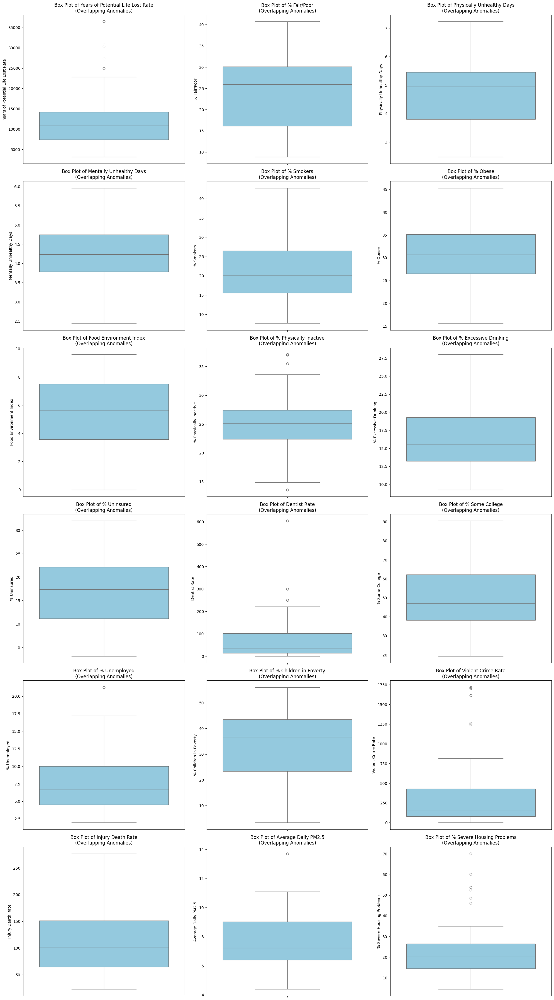

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data_knn_imputed to only include the overlapping anomalous counties
overlapping_anomalous_data = data_knn_imputed[data_knn_imputed['FIPS'].isin(overlap_fips)].copy()

print(f"Visualizing features for the {len(overlapping_anomalous_data)} counties identified as anomalous by both Isolation Forest and LOF.")

# Use the 'numeric_cols' list defined previously, which excludes FIPS and any dropped features.
features_to_visualize_overlap = [col for col in numeric_cols if col not in ['isolation_forest_anomaly', 'lof_anomaly']]

num_features = len(features_to_visualize_overlap)
num_rows = (num_features + 2) // 3 # Roughly 3 plots per row

plt.figure(figsize=(20, num_rows * 6))

for i, col in enumerate(features_to_visualize_overlap):
    plt.subplot(num_rows, 3, i + 1)
    sns.boxplot(y=overlapping_anomalous_data[col], color='skyblue')
    plt.title(f'Box Plot of {col}\n(Overlapping Anomalies)')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

These box plots show the distribution of each numerical feature specifically for the counties identified as anomalies by both Isolation Forest and LOF. This helps in understanding the common characteristics that make these particular counties outliers across different detection methods.

### Detailed Analysis of LOF Anomalies and Contributing Features

In [80]:
import numpy as np

# Get the FIPS, State, and County for the LOF anomalies
lof_anomalous_counties_info = data_knn_imputed[data_knn_imputed['lof_anomaly'] == -1][['FIPS', 'State', 'County']].copy()

# Merge with the Z-score transformed data to see the Z-scores of these LOF anomalous counties
lof_anomalies_zscores = pd.merge(
    lof_anomalous_counties_info,
    data_zscore, # Use the z-score data previously computed
    left_index=True,
    right_index=True,
    how='inner'
)

# `contribution_z_score_threshold` was defined previously as 2.5

# Store the analysis results for each LOF anomalous county
lof_anomalies_feature_breakdown = []

for index, row in lof_anomalies_zscores.iterrows():
    fips = lof_anomalous_counties_info.loc[index, 'FIPS']
    state = lof_anomalous_counties_info.loc[index, 'State']
    county = lof_anomalous_counties_info.loc[index, 'County']

    extreme_features_lof = []
    for feature in numeric_cols_for_zscore: # Iterate over the numerical features used for Z-scoring
        z_score = row[feature]
        if z_score > contribution_z_score_threshold:
            extreme_features_lof.append(f"{feature} (High: {z_score:.2f})")
        elif z_score < -contribution_z_score_threshold:
            extreme_features_lof.append(f"{feature} (Low: {z_score:.2f})")

    lof_anomalies_feature_breakdown.append({
        'FIPS': fips,
        'State': state,
        'County': county,
        'Num Extreme Features': len(extreme_features_lof),
        'Extreme Features': extreme_features_lof
    })

# Convert to DataFrame for easier viewing
lof_anomalies_feature_breakdown_df = pd.DataFrame(lof_anomalies_feature_breakdown)

print("Top 10 LOF Anomalies by Number of Extreme Z-score Features:")
display(lof_anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).head(10))

# Count the occurrences of each extreme feature across all LOF anomalies
all_extreme_features_lof = [item for sublist in lof_anomalies_feature_breakdown_df['Extreme Features'] for item in sublist]
feature_contribution_counts_lof = pd.Series(all_extreme_features_lof).value_counts()

print("\nMost frequently extreme features among LOF Anomalies:")
display(feature_contribution_counts_lof.head(10))

Top 10 LOF Anomalies by Number of Extreme Z-score Features:


,FIPS,State,County,Num Extreme Features,Extreme Features
7,2158,Alaska,Kusilvak,11,[Years of Potential Life Lost Rate (High: 8.91...
154,54047,West Virginia,McDowell,10,[Years of Potential Life Lost Rate (High: 4.41...
114,46017,South Dakota,Buffalo,9,[Years of Potential Life Lost Rate (High: 4.11...
121,46102,South Dakota,Oglala Lakota,8,[Years of Potential Life Lost Rate (High: 11.1...
20,5107,Arkansas,Phillips,7,[Years of Potential Life Lost Rate (High: 3.25...
14,2290,Alaska,Yukon-Koyukuk,7,[Years of Potential Life Lost Rate (High: 3.23...
122,46121,South Dakota,Todd,7,[Years of Potential Life Lost Rate (High: 6.60...
157,55078,Wisconsin,Menominee,7,[Years of Potential Life Lost Rate (High: 2.68...
89,35031,New Mexico,McKinley,6,"[Physically Unhealthy Days (High: 2.62), Food ..."
15,4001,Arizona,Apache,6,[Years of Potential Life Lost Rate (High: 2.81...



Most frequently extreme features among LOF Anomalies:


,count
Average Daily PM2.5 (Low: -2.67),5
Injury Death Rate (High: 2.70),3
Food Environment Index (Low: -4.05),3
Food Environment Index (Low: -3.63),3
Food Environment Index (Low: -3.46),2
Violent Crime Rate (High: 2.83),2
% Excessive Drinking (Low: -2.51),2
% Fair/Poor (High: 3.50),2
Food Environment Index (Low: -2.61),2
% Some College (Low: -3.29),2


This analysis provides a detailed breakdown of the LOF anomalies, similar to what what was done for Isolation Forest. It helps in understanding which specific features contribute most to a county being identified as an outlier by LOF, considering extreme Z-scores.

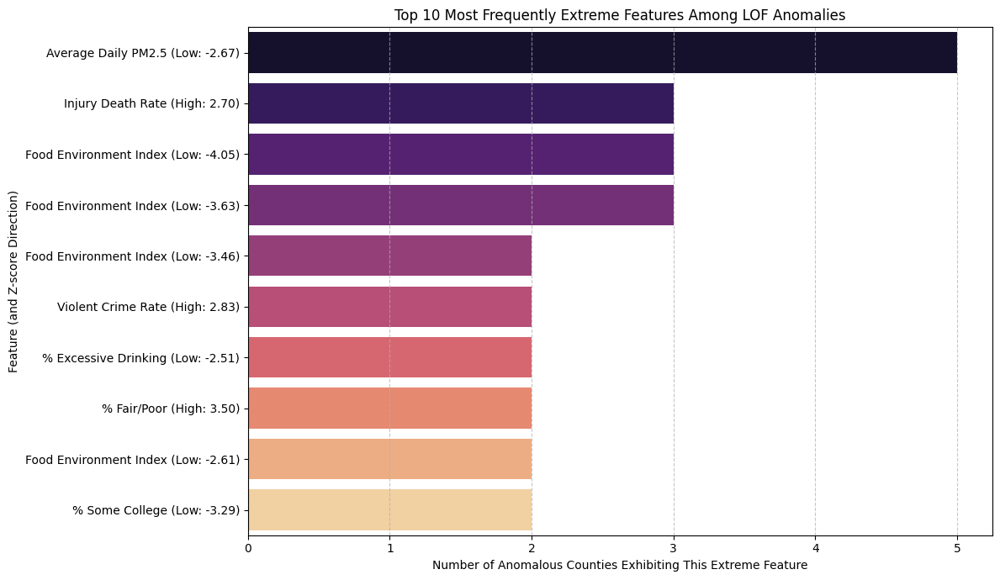

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure `feature_contribution_counts_lof` is available from the previous cell

plt.figure(figsize=(12, 7))
sns.barplot(x=feature_contribution_counts_lof.head(10).values, y=feature_contribution_counts_lof.head(10).index, palette='magma', hue=feature_contribution_counts_lof.head(10).index, legend=False)
plt.title('Top 10 Most Frequently Extreme Features Among LOF Anomalies')
plt.xlabel('Number of Anomalous Counties Exhibiting This Extreme Feature')
plt.ylabel('Feature (and Z-score Direction)')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


This bar plot visualizes the features that most frequently appear as extreme (high or low Z-scores) in the counties identified as anomalous by Local Outlier Factor. By comparing this to the Isolation Forest plot, further insights will be gained into the specific characteristics that each algorithm prioritizes or is sensitive to when detecting anomalies.

### Visualizing Top LOF Anomalous Counties by Number of Extreme Features

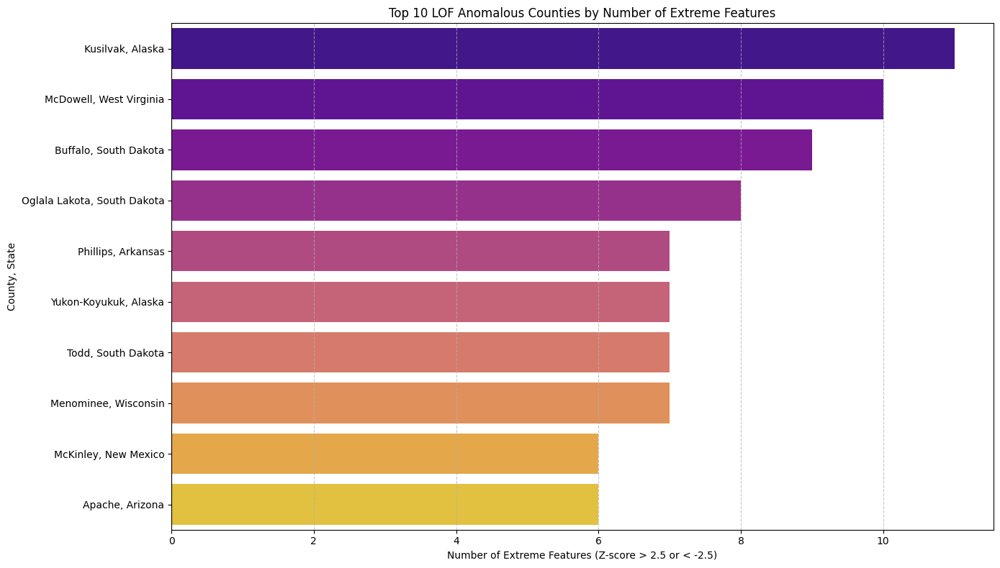

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the DataFrame by 'Num Extreme Features' in descending order
top_lof_anomalous_counties = lof_anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).head(10)

# Create a combined 'County, State' label for better readability on the plot
top_lof_anomalous_counties['County_State'] = top_lof_anomalous_counties['County'] + ', ' + top_lof_anomalous_counties['State']

plt.figure(figsize=(14, 8))
sns.barplot(x='Num Extreme Features', y='County_State', data=top_lof_anomalous_counties, palette='plasma', hue='County_State', legend=False)
plt.title('Top 10 LOF Anomalous Counties by Number of Extreme Features')
plt.xlabel('Number of Extreme Features (Z-score > 2.5 or < -2.5)')
plt.ylabel('County, State')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

This bar plot provides a clear visual representation of the counties identified as anomalous by LOF, ranked by the count of their features with extreme Z-scores. This helps to quickly identify the most prominent outliers according to LOF's perspective and compare them to the Isolation Forest results.

### Correlation Matrix Heatmap for Overlapping Anomalous Counties

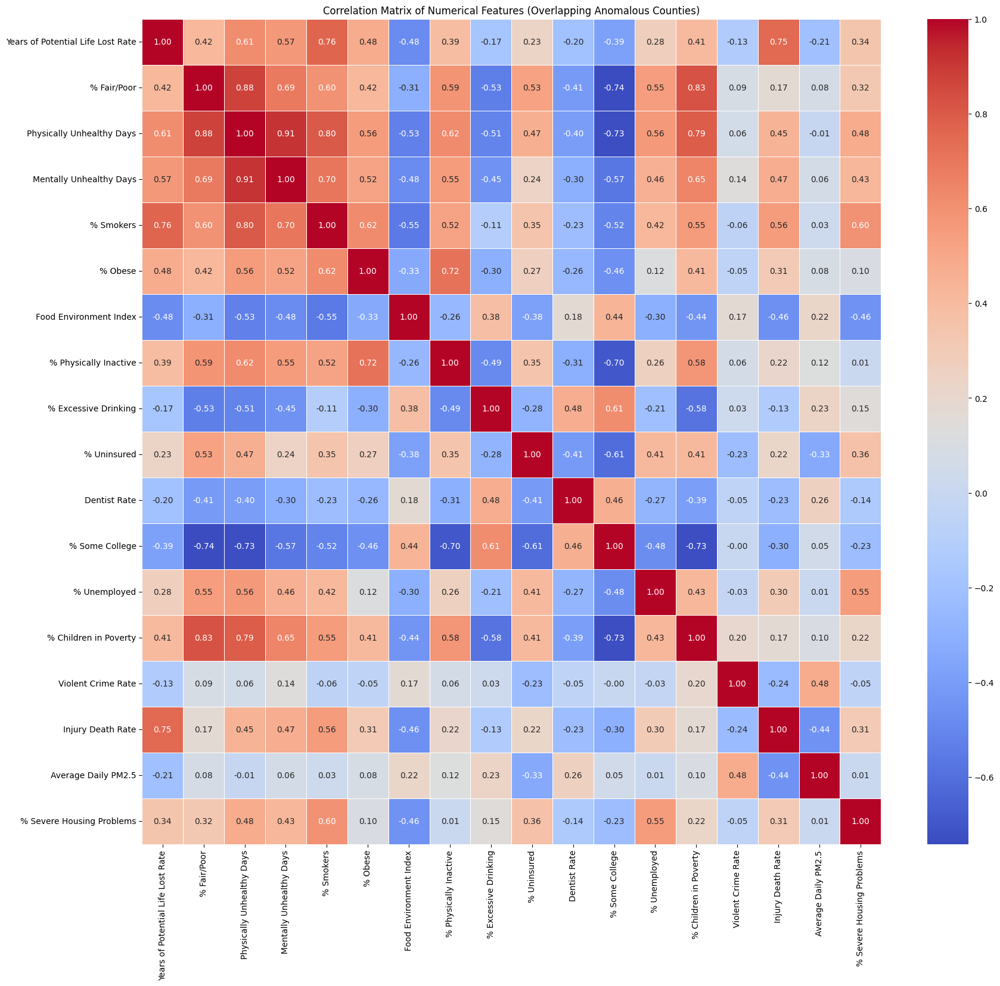


Features with high absolute correlation (> 0.8) within the overlapping anomalous counties:
- Physically Unhealthy Days and % Fair/Poor: 0.88
- Mentally Unhealthy Days and Physically Unhealthy Days: 0.91
- % Children in Poverty and % Fair/Poor: 0.83


In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix for numerical columns of the overlapping anomalous data
# Use 'features_to_visualize_overlap' which is already cleaned of identifiers and anomaly flags
correlation_matrix_overlap = overlapping_anomalous_data[features_to_visualize_overlap].corr()

plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix_overlap, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Features (Overlapping Anomalous Counties)')
plt.show()

print("\nFeatures with high absolute correlation (> 0.8) within the overlapping anomalous counties:")
# Find highly correlated pairs within this specific subset
high_corr_pairs_overlap = []
for i in range(len(correlation_matrix_overlap.columns)):
    for j in range(i):
        if abs(correlation_matrix_overlap.iloc[i, j]) > 0.8:
            # Store both column names and the correlation value
            high_corr_pairs_overlap.append((correlation_matrix_overlap.columns[i], correlation_matrix_overlap.columns[j], correlation_matrix_overlap.iloc[i, j]))

if high_corr_pairs_overlap:
    for col1, col2, corr_val in high_corr_pairs_overlap:
        print(f"- {col1} and {col2}: {corr_val:.2f}")
else:
    print("No highly correlated pairs found above the 0.8 threshold in this subset.")

### Visualizing LOF Anomalies

Visualizing LOF anomaly distributions for: ['Years of Potential Life Lost Rate', '% Fair/Poor', 'Food Environment Index', 'Violent Crime Rate']


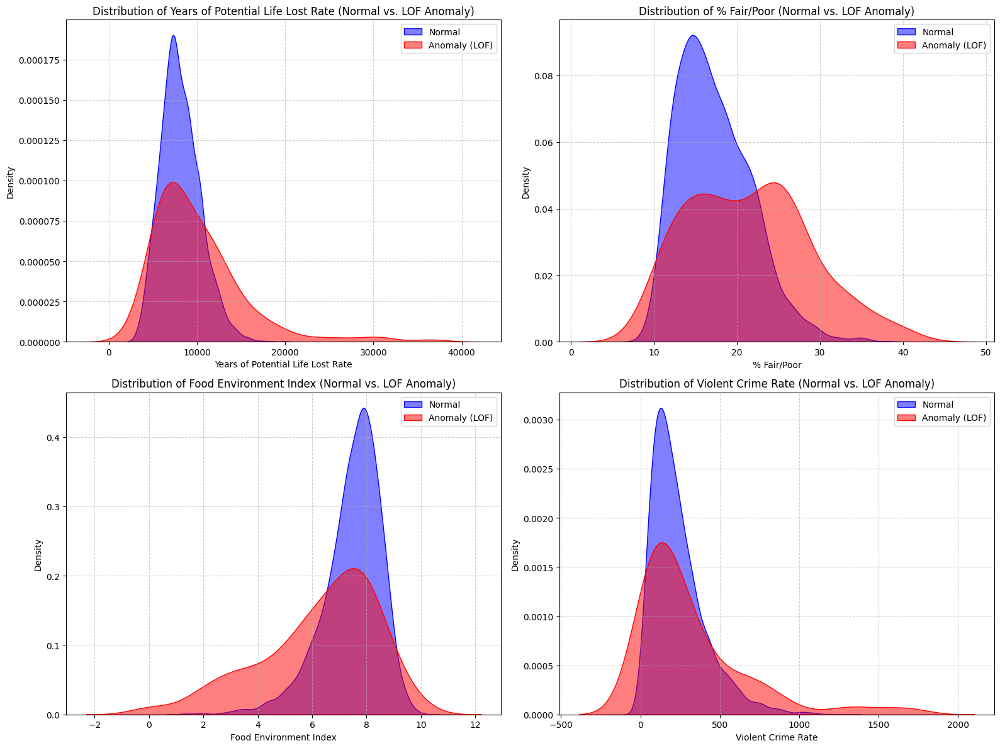

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data into normal and anomalous groups based on LOF predictions
normal_data_lof = data_knn_imputed[data_knn_imputed['lof_anomaly'] == 1]
anomalous_data_lof = data_knn_imputed[data_knn_imputed['lof_anomaly'] == -1]

# Select a few representative numerical features to visualize
# Reuse features_to_visualize or define a new list if preferred
# Ensure these features are clean and don't include anomaly flags themselves
features_to_visualize_lof = [col for col in numeric_cols if col not in ['isolation_forest_anomaly', 'lof_anomaly', 'lof_anomaly_score']]

# Limit to the same features used for Isolation Forest visualization for consistency
# For example, let's use the 'features_to_visualize' list defined previously
# if that's what we want to compare directly.
features_to_visualize_for_lof_plots = [
    'Years of Potential Life Lost Rate',
    '% Fair/Poor',
    'Food Environment Index',
    'Violent Crime Rate'
]

print(f"Visualizing LOF anomaly distributions for: {features_to_visualize_for_lof_plots}")

plt.figure(figsize=(16, 12))

for i, feature in enumerate(features_to_visualize_for_lof_plots):
    plt.subplot(2, 2, i + 1) # Arrange in a 2x2 grid

    # Plot distribution for normal points
    sns.kdeplot(normal_data_lof[feature], label='Normal', color='blue', fill=True, alpha=0.5)
    # Plot distribution for anomalous points
    sns.kdeplot(anomalous_data_lof[feature], label='Anomaly (LOF)', color='red', fill=True, alpha=0.5)

    plt.title(f'Distribution of {feature} (Normal vs. LOF Anomaly)')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

These density plots show the distributions of selected features for both normal and LOF-identified anomalous instances. By comparing the red (anomaly) and blue (normal) distributions, it's possible to visually assess how LOF outliers differ from the majority of the data in terms of these features. This helps in understanding the characteristics that LOF is sensitive to.

**Key findings:**
1. **Years of Potential Life Lost Rate:** Anomalous counties have a right-skewed distribution, which is the same distribution shape as normal counties, however with much lower density, indicating that anomalous counties share the same underlying distributional form but are underrepresented in the bulk and overrepresented in the upper tail of the distribution. Consequently, these anomalous counties are characterized by elevated premature mortality rates compared to normal counties.

2. **% Fair/Poor:** The distribution for anomalous counties is bimodal. The first mode corresponds to the typical range seen in normal counties, though with fewer counties. The second mode is concentrated in the upper tail, representing counties where a large proportion of residents report fair or poor health. This suggests that anomalous counties experience significantly worse perceived health status.

3. **Food Environment Index:** Anomalous counties have a left-skewed distribution, which is the same distribution shape as normal counties, however with much lower density, indicating that anomalous counties share the same underlying distributional form but are underrepresented in the bulk and overrepresented in the lower tail of the distribution. Consequently, these anomalous counties are characterized by unhealthy food environment compared to normal counties.

4. **Violent Crime Rate:** Anomalous counties have a right-skewed distribution, which is the same distribution shape as normal counties, however with much lower density, indicating that anomalous counties share the same underlying distributional form but are underrepresented in the bulk and overrepresented in the upper tail of the distribution. Consequently, these anomalous counties are characterized by elevated violent crime rates compared to normal counties.


## c- Anomaly Detection using One-Class SVM

### Implementing One-class SVM on the Dataset

In [85]:
from sklearn.svm import OneClassSVM

# Ensure that the same features as for Isolation Forest and LOF (scaled numerical features) is used
# `features_for_lof` is a good list of columns to use.

print(f"Applying One-Class SVM to the following {len(features_for_lof)} features:\n{features_for_lof}")

# Initialize the One-Class SVM model
    # nu: An upper bound on the fraction of training errors and a lower bound of the fraction of support vectors.
    # It's analogous to the 'contamination' parameter in IsolationForest and LOF.
    # kernel: Specifies the kernel type to be used in the algorithm. 'rbf' (Radial Basis Function) is a common choice.
    # gamma: Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.
oc_svm = OneClassSVM(kernel='rbf', nu=0.05, gamma='auto') # Using nu=0.05 consistent with previous methods

# Fit the model and predict anomalies
    # The fit_predict method returns -1 for outliers and 1 for inliers.
anomaly_predictions_ocsvm = oc_svm.fit_predict(data_scaled[features_for_lof])

# Add the anomaly predictions to the original data_knn_imputed DataFrame for easier analysis
data_knn_imputed['ocsvm_anomaly'] = anomaly_predictions_ocsvm

# Count the number of anomalies (-1) and normal points (1)
num_anomalies_ocsvm = (data_knn_imputed['ocsvm_anomaly'] == -1).sum()
num_normal_ocsvm = (data_knn_imputed['ocsvm_anomaly'] == 1).sum()

print(f"\nTotal instances: {len(data_knn_imputed)}")
print(f"Anomalies detected by One-Class SVM: {num_anomalies_ocsvm}")
print(f"Normal instances detected by One-Class SVM: {num_normal_ocsvm}")
print(f"Proportion of anomalies: {num_anomalies_ocsvm / len(data_knn_imputed):.4f}")

print("\nSample of rows identified as anomalies by One-Class SVM:")
display(data_knn_imputed[data_knn_imputed['ocsvm_anomaly'] == -1].head())

Applying One-Class SVM to the following 18 features:
['Years of Potential Life Lost Rate', '% Fair/Poor', 'Physically Unhealthy Days', 'Mentally Unhealthy Days', '% Smokers', '% Obese', 'Food Environment Index', '% Physically Inactive', '% Excessive Drinking', '% Uninsured', 'Dentist Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Violent Crime Rate', 'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems']

Total instances: 3142
Anomalies detected by One-Class SVM: 154
Normal instances detected by One-Class SVM: 2988
Proportion of anomalies: 0.0490

Sample of rows identified as anomalies by One-Class SVM:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,isolation_forest_anomaly,lof_anomaly,lof_anomaly_score,ocsvm_anomaly
65,1131,Alabama,Wilcox,18334.688186,30.371228,5.657480,5.181123,24.254934,42.6,2.1,...,14.702741,48.8,418.679549,107.371021,9.40,17.815345,-1,1,1.269766,-1
67,2013,Alaska,Aleutians East,8176.395642,16.741023,3.418464,2.726474,17.427062,34.9,5.0,...,2.722178,13.5,235.799588,77.436922,7.00,14.782609,1,-1,1.654931,-1
68,2016,Alaska,Aleutians West,5186.465492,15.176383,2.966867,2.569844,15.346801,40.7,7.5,...,3.250576,8.2,291.567559,46.169691,7.20,21.266968,1,-1,1.588541,-1
70,2050,Alaska,Bethel,12528.584945,26.270612,5.684245,4.857296,33.382314,29.4,2.9,...,14.092334,33.8,90.975577,151.199516,7.14,60.247748,-1,-1,1.920864,-1
71,2060,Alaska,Bristol Bay,12753.701246,15.454088,3.745194,3.511147,20.041734,39.1,6.6,...,6.947891,14.2,67.294751,276.713495,6.80,13.750000,-1,-1,2.137745,-1


### Detailed Analysis of One-Class SVM Anomalies and Contributing Features

In [86]:
import numpy as np

# Get the FIPS, State, and County for the One-Class SVM anomalies
ocsvm_anomalous_counties_info = data_knn_imputed[data_knn_imputed['ocsvm_anomaly'] == -1][['FIPS', 'State', 'County']].copy()

# Merge with the Z-score transformed data to see the Z-scores of these OCSVM anomalous counties
ocsvm_anomalies_zscores = pd.merge(
    ocsvm_anomalous_counties_info,
    data_zscore, # Use the z-score data previously computed
    left_index=True,
    right_index=True,
    how='inner'
)

# `contribution_z_score_threshold` was defined previously as 2.5

# Store the analysis results for each OCSVM anomalous county
ocsvm_anomalies_feature_breakdown = []

for index, row in ocsvm_anomalies_zscores.iterrows():
    fips = ocsvm_anomalous_counties_info.loc[index, 'FIPS']
    state = ocsvm_anomalous_counties_info.loc[index, 'State']
    county = ocsvm_anomalous_counties_info.loc[index, 'County']

    extreme_features_ocsvm = []
    for feature in numeric_cols_for_zscore: # Iterate over the numerical features used for Z-scoring
        z_score = row[feature]
        if z_score > contribution_z_score_threshold:
            extreme_features_ocsvm.append(f"{feature} (High: {z_score:.2f})")
        elif z_score < -contribution_z_score_threshold:
            extreme_features_ocsvm.append(f"{feature} (Low: {z_score:.2f})")

    ocsvm_anomalies_feature_breakdown.append({
        'FIPS': fips,
        'State': state,
        'County': county,
        'Num Extreme Features': len(extreme_features_ocsvm),
        'Extreme Features': extreme_features_ocsvm
    })

# Convert to DataFrame for easier viewing
ocsvm_anomalies_feature_breakdown_df = pd.DataFrame(ocsvm_anomalies_feature_breakdown)

print("Top 10 One-Class SVM Anomalies by Number of Extreme Z-score Features:")
display(ocsvm_anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).head(10))

# Count the occurrences of each extreme feature across all OCSVM anomalies
all_extreme_features_ocsvm = [item for sublist in ocsvm_anomalies_feature_breakdown_df['Extreme Features'] for item in sublist]
feature_contribution_counts_ocsvm = pd.Series(all_extreme_features_ocsvm).value_counts()

print("\nMost frequently extreme features among One-Class SVM Anomalies:")
display(feature_contribution_counts_ocsvm.head(10))

Top 10 One-Class SVM Anomalies by Number of Extreme Z-score Features:


,FIPS,State,County,Num Extreme Features,Extreme Features
8,2158,Alaska,Kusilvak,11,[Years of Potential Life Lost Rate (High: 8.91...
149,54047,West Virginia,McDowell,10,[Years of Potential Life Lost Rate (High: 4.41...
114,46017,South Dakota,Buffalo,9,[Years of Potential Life Lost Rate (High: 4.11...
119,46102,South Dakota,Oglala Lakota,8,[Years of Potential Life Lost Rate (High: 11.1...
21,5107,Arkansas,Phillips,7,[Years of Potential Life Lost Rate (High: 3.25...
120,46121,South Dakota,Todd,7,[Years of Potential Life Lost Rate (High: 6.60...
73,28051,Mississippi,Holmes,7,[Years of Potential Life Lost Rate (High: 2.93...
16,2290,Alaska,Yukon-Koyukuk,7,[Years of Potential Life Lost Rate (High: 3.23...
153,55078,Wisconsin,Menominee,7,[Years of Potential Life Lost Rate (High: 2.68...
17,4001,Arizona,Apache,6,[Years of Potential Life Lost Rate (High: 2.81...



Most frequently extreme features among One-Class SVM Anomalies:


,count
Average Daily PM2.5 (Low: -2.67),6
Food Environment Index (Low: -3.29),4
Food Environment Index (Low: -3.46),3
Food Environment Index (Low: -3.63),3
Food Environment Index (Low: -4.05),3
Food Environment Index (Low: -3.20),2
% Excessive Drinking (Low: -2.51),2
% Fair/Poor (High: 3.50),2
Food Environment Index (Low: -2.53),2
% Obese (High: 2.89),2


This analysis provides a detailed breakdown of the One-Class SVM anomalies, highlighting which specific features contribute most to a county being identified as an outlier by OCSVM, based on extreme Z-scores.

In [87]:
num_anomalies_ocsvm = (data_knn_imputed['ocsvm_anomaly'] == -1).sum()
num_total_instances = len(data_knn_imputed)
percentage_anomalies = (num_anomalies_ocsvm / num_total_instances) * 100

print(f"Number of anomalies predicted by One-Class SVM: {num_anomalies_ocsvm}")
print(f"Percentage of anomalies predicted by One-Class SVM: {percentage_anomalies:.2f}%")

Number of anomalies predicted by One-Class SVM: 154
Percentage of anomalies predicted by One-Class SVM: 4.90%


### Visualizing different OCSVM Graphs

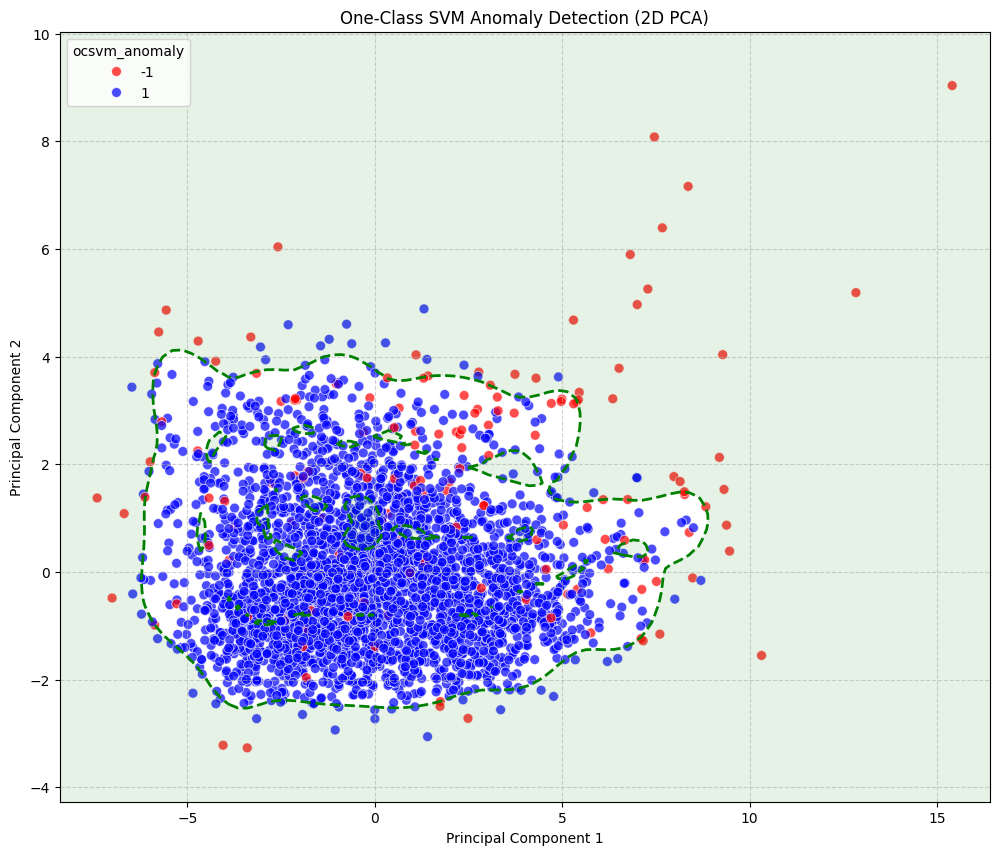

In [88]:
from sklearn.decomposition import PCA
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure relevant data and columns are accessible
# `data_scaled` and `numeric_cols` should be available from previous cells
# `oc_svm` (original model) and `ocsvm_anomaly` are also expected.

# 1. Dimensionality Reduction using PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled[numeric_cols])

# Convert to DataFrame for easier plotting, retaining anomaly labels
data_pca_df = pd.DataFrame(data_pca, columns=['PC1', 'PC2'], index=data_scaled.index)
data_pca_df['ocsvm_anomaly'] = data_knn_imputed['ocsvm_anomaly']

# 2. Re-train One-Class SVM on the 2D PCA-transformed data
# We use the same 'nu' parameter as the original OCSVM model for consistency.
# Gamma is set to 'auto' for the 2D model.
ocsvm_2d = OneClassSVM(kernel='rbf', nu=oc_svm.nu, gamma='auto')
ocsvm_2d.fit(data_pca)

# 3. Create a meshgrid to plot the decision boundary
xx, yy = np.meshgrid(np.linspace(data_pca_df['PC1'].min() - 1, data_pca_df['PC1'].max() + 1, 100),
                     np.linspace(data_pca_df['PC2'].min() - 1, data_pca_df['PC2'].max() + 1, 100))
Z = ocsvm_2d.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# 4. Plotting the results
plt.figure(figsize=(12, 10))
sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='ocsvm_anomaly',
    palette={1: 'blue', -1: 'red'},
    data=data_pca_df,
    s=50,
    alpha=0.7,
    legend='full'
)

# Plot the decision boundary
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='green', linestyles='dashed')

# Highlight the decision region for normal points (score > 0)
plt.contourf(xx, yy, Z, levels=[Z.min(), 0], colors='green', alpha=0.1)

plt.title('One-Class SVM Anomaly Detection (2D PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

**Interpretation:**


*   Blue points are classified as normal (inliers).
*   Red points are classified as anomalies (outliers).
*   The dashed green line represents the decision boundary found by the One-Class SVM.
*   The shaded green region indicates the 'normal' region where the model expects most data to lie.")
* Points outside this region are considered anomalies. One-Class SVM tries to find a hyperplane (or \"boundary\") that encompasses the majority of the data points, treating anything outside as an anomaly.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but OneClassSVM was fitted with feature names
  warnings.warn(


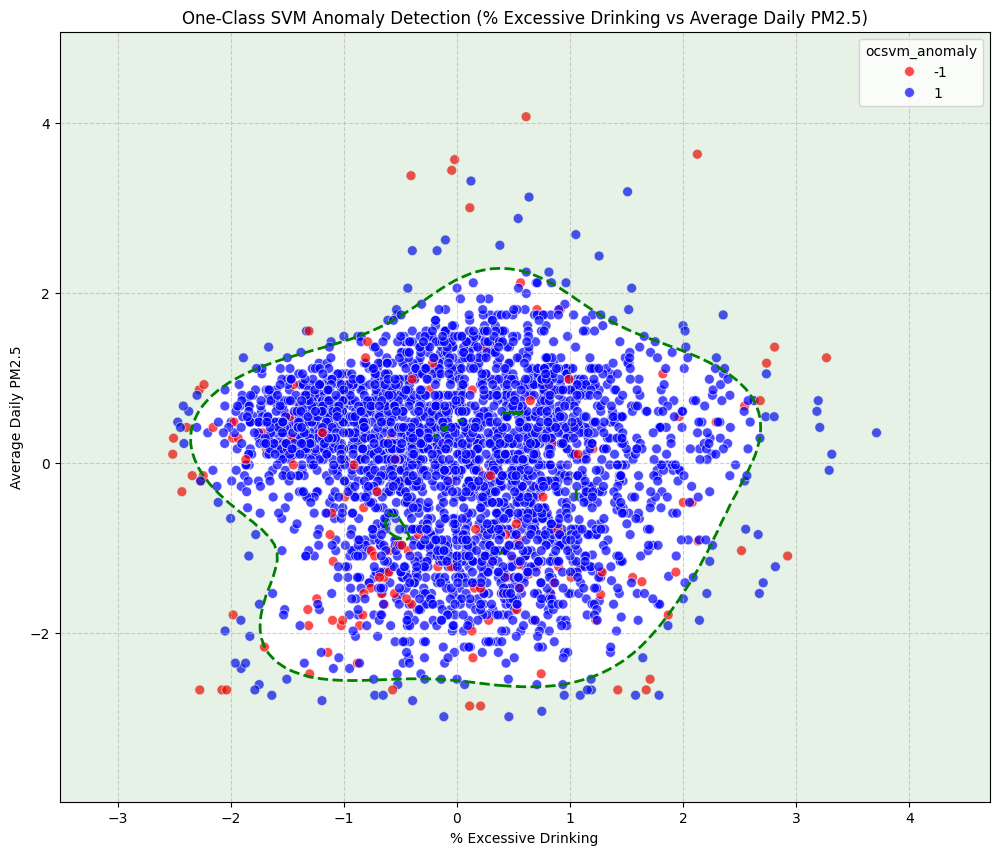

In [89]:
from sklearn.decomposition import PCA
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the two features for visualization
feature1 = '% Excessive Drinking'
feature2 = 'Average Daily PM2.5'

# Extract these features from the scaled data
data_selected_features = data_scaled[[feature1, feature2]]

# 2. Re-train One-Class SVM on the selected 2D features
# We use the same 'nu' parameter as the original OCSVM model for consistency.
# Gamma is set to 'auto' for the 2D model.
ocsvm_selected_features = OneClassSVM(kernel='rbf', nu=oc_svm.nu, gamma='auto')
ocsvm_selected_features.fit(data_selected_features)

# 3. Create a meshgrid to plot the decision boundary
xx, yy = np.meshgrid(np.linspace(data_selected_features[feature1].min() - 1, data_selected_features[feature1].max() + 1, 100),
                     np.linspace(data_selected_features[feature2].min() - 1, data_selected_features[feature2].max() + 1, 100))
Z = ocsvm_selected_features.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Create a DataFrame for plotting, using original OCSVM anomaly labels
data_plot_df = data_selected_features.copy()
data_plot_df['ocsvm_anomaly'] = data_knn_imputed['ocsvm_anomaly']

# 4. Plotting the results
plt.figure(figsize=(12, 10))
sns.scatterplot(
    x=feature1,
    y=feature2,
    hue='ocsvm_anomaly',
    palette={1: 'blue', -1: 'red'},
    data=data_plot_df,
    s=50,
    alpha=0.7,
    legend='full'
)

# Plot the decision boundary
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='green', linestyles='dashed')

# Highlight the decision region for normal points (score > 0)
plt.contourf(xx, yy, Z, levels=[Z.min(), 0], colors='green', alpha=0.1)

plt.title(f'One-Class SVM Anomaly Detection ({feature1} vs {feature2})')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


**Interpretation:**
* Blue points are classified as normal (inliers) by the overall OCSVM.
* Red points are classified as anomalies (outliers) by the overall OCSVM.
* The dashed green line represents the decision boundary found by the 2D One-Class SVM trained on these two features.
* The shaded green region indicates the 'normal' region where this 2D model expects most data to lie.
* Points outside this region are considered anomalies within this 2D projection. This helps visualize how the original OCSVM's classifications relate to extreme values in 'Excessive Drinking' and 'Average Daily PM2.5'.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but OneClassSVM was fitted with feature names
  warnings.warn(


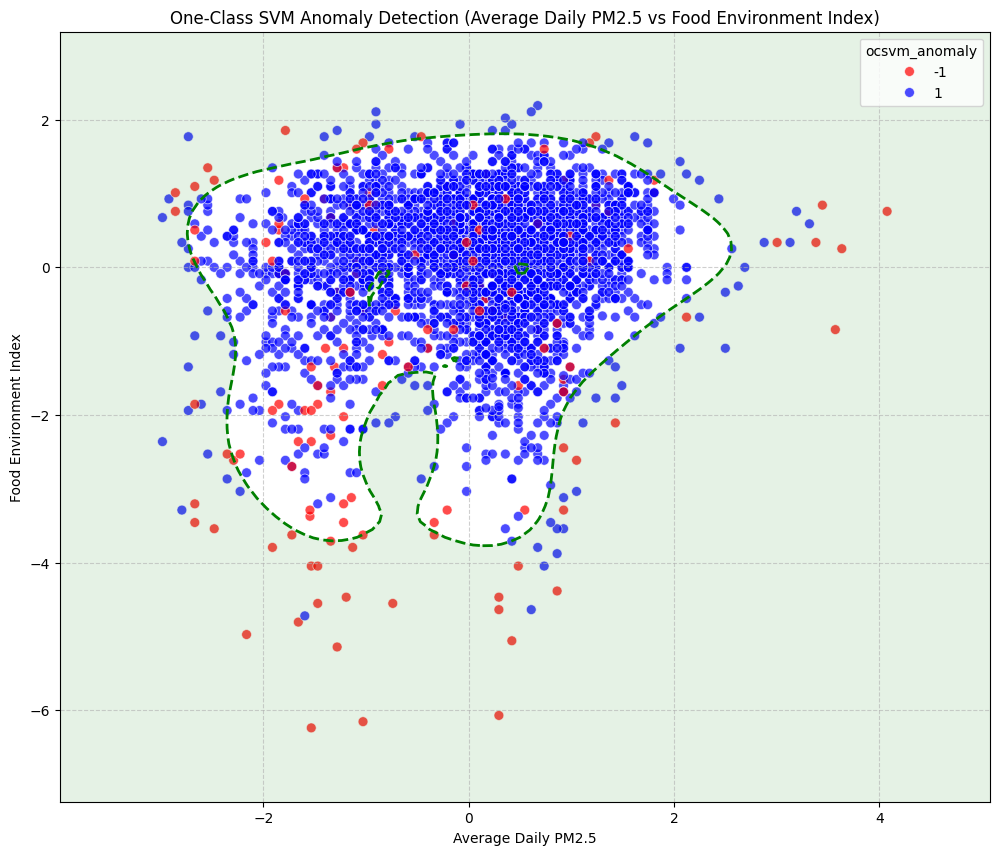

In [90]:
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the two features for visualization
feature1 = 'Average Daily PM2.5'
feature2 = 'Food Environment Index'

# Extract these features from the scaled data
data_selected_features = data_scaled[[feature1, feature2]]

# 2. Re-train One-Class SVM on the selected 2D features
# We use the same 'nu' parameter as the original OCSVM model for consistency.
# Gamma is set to 'auto' for the 2D model.
ocsvm_selected_features = OneClassSVM(kernel='rbf', nu=oc_svm.nu, gamma='auto')
ocsvm_selected_features.fit(data_selected_features)

# 3. Create a meshgrid to plot the decision boundary
xx, yy = np.meshgrid(np.linspace(data_selected_features[feature1].min() - 1, data_selected_features[feature1].max() + 1, 100),
                     np.linspace(data_selected_features[feature2].min() - 1, data_selected_features[feature2].max() + 1, 100))
Z = ocsvm_selected_features.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Create a DataFrame for plotting, using original OCSVM anomaly labels
data_plot_df = data_selected_features.copy()
data_plot_df['ocsvm_anomaly'] = data_knn_imputed['ocsvm_anomaly']

# 4. Plotting the results
plt.figure(figsize=(12, 10))
sns.scatterplot(
    x=feature1,
    y=feature2,
    hue='ocsvm_anomaly',
    palette={1: 'blue', -1: 'red'},
    data=data_plot_df,
    s=50,
    alpha=0.7,
    legend='full'
)

# Plot the decision boundary
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='green', linestyles='dashed')

# Highlight the decision region for normal points (score > 0)
plt.contourf(xx, yy, Z, levels=[Z.min(), 0], colors='green', alpha=0.1)

plt.title(f'One-Class SVM Anomaly Detection ({feature1} vs {feature2})')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Visualizing 2D OCSVM for Additional Feature Pairs

To further explore how One-Class SVM identifies anomalies, let's visualize its decision boundary for additional pairs of features. This helps to understand how different combinations of characteristics contribute to a county being flagged as anomalous.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but OneClassSVM was fitted with feature names
  warnings.warn(


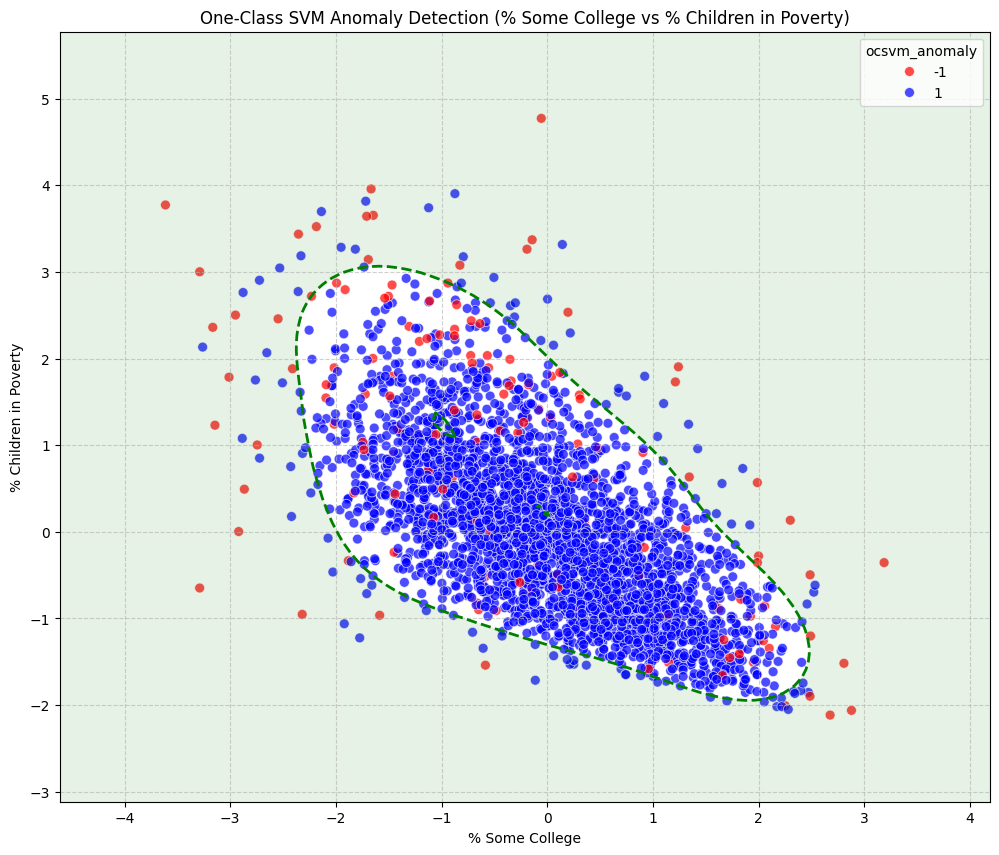

In [91]:
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the two features for visualization
feature1 = '% Some College'
feature2 = '% Children in Poverty'

# Extract these features from the scaled data
data_selected_features = data_scaled[[feature1, feature2]]

# Re-train One-Class SVM on the selected 2D features
# We use the same 'nu' parameter as the original OCSVM model for consistency.
# Gamma is set to 'auto' for the 2D model.
ocsvm_selected_features = OneClassSVM(kernel='rbf', nu=oc_svm.nu, gamma='auto')
ocsvm_selected_features.fit(data_selected_features)

# Create a meshgrid to plot the decision boundary
xx, yy = np.meshgrid(np.linspace(data_selected_features[feature1].min() - 1, data_selected_features[feature1].max() + 1, 100),
                     np.linspace(data_selected_features[feature2].min() - 1, data_selected_features[feature2].max() + 1, 100))
Z = ocsvm_selected_features.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Create a DataFrame for plotting, using original OCSVM anomaly labels
data_plot_df = data_selected_features.copy()
data_plot_df['ocsvm_anomaly'] = data_knn_imputed['ocsvm_anomaly']

# Plotting the results
plt.figure(figsize=(12, 10))
sns.scatterplot(
    x=feature1,
    y=feature2,
    hue='ocsvm_anomaly',
    palette={1: 'blue', -1: 'red'},
    data=data_plot_df,
    s=50,
    alpha=0.7,
    legend='full'
)

# Plot the decision boundary
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='green', linestyles='dashed')

# Highlight the decision region for normal points (score > 0)
plt.contourf(xx, yy, Z, levels=[Z.min(), 0], colors='green', alpha=0.1)

plt.title(f'One-Class SVM Anomaly Detection ({feature1} vs {feature2})')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

**Interpretation:**
* Blue points are classified as normal (inliers) by the overall OCSVM.
* Red points are classified as anomalies (outliers) by the overall OCSVM.
* The dashed green line represents the decision boundary found by the 2D One-Class SVM trained on these two features.
* The shaded green region indicates the 'normal' region where this 2D model expects most data to lie.
* Points outside this region are considered anomalies within this 2D projection. This visualization helps to see if counties with low college attainment and high child poverty are identified as anomalous by OCSVM.

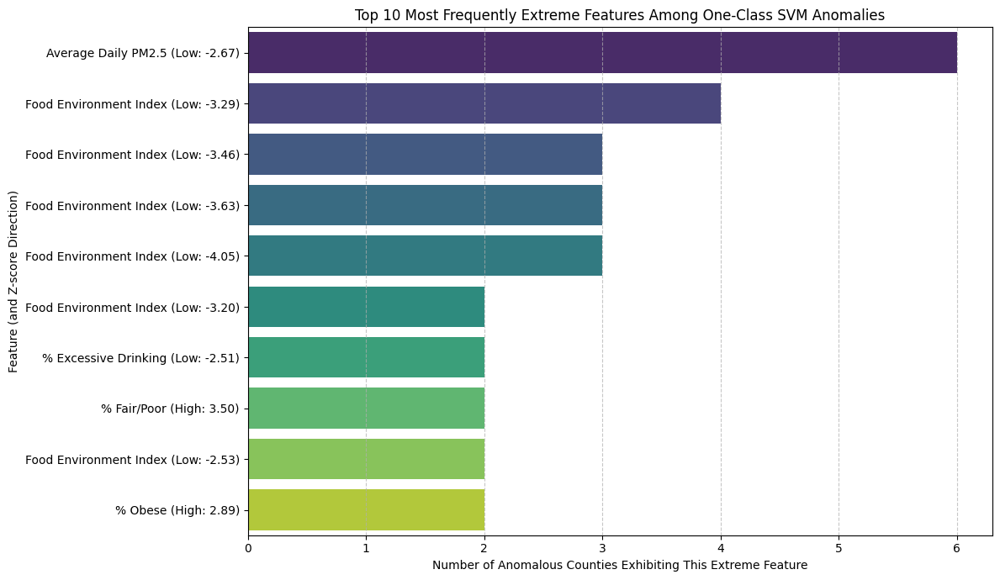

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure `feature_contribution_counts_ocsvm` is available from the previous cell

plt.figure(figsize=(12, 7))
sns.barplot(x=feature_contribution_counts_ocsvm.head(10).values, y=feature_contribution_counts_ocsvm.head(10).index, palette='viridis', hue=feature_contribution_counts_ocsvm.head(10).index, legend=False)
plt.title('Top 10 Most Frequently Extreme Features Among One-Class SVM Anomalies')
plt.xlabel('Number of Anomalous Counties Exhibiting This Extreme Feature')
plt.ylabel('Feature (and Z-score Direction)')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

This bar plot visualizes the features that most frequently appear as extreme (high or low Z-scores) in the counties identified as anomalous by One-Class SVM. This helps to understand the specific characteristics that OCSVM is sensitive to when detecting anomalies.

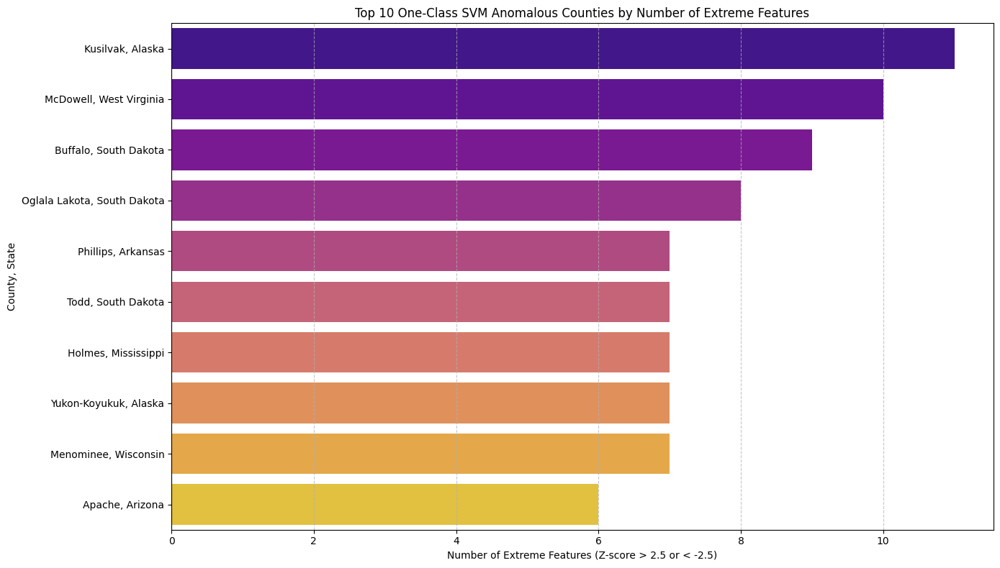

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the DataFrame by 'Num Extreme Features' in descending order
top_ocsvm_anomalous_counties = ocsvm_anomalies_feature_breakdown_df.sort_values(by='Num Extreme Features', ascending=False).head(10)

# Create a combined 'County, State' label for better readability on the plot
top_ocsvm_anomalous_counties['County_State'] = top_ocsvm_anomalous_counties['County'] + ', ' + top_ocsvm_anomalous_counties['State']

plt.figure(figsize=(14, 8))
sns.barplot(x='Num Extreme Features', y='County_State', data=top_ocsvm_anomalous_counties, palette='plasma', hue='County_State', legend=False)
plt.title('Top 10 One-Class SVM Anomalous Counties by Number of Extreme Features')
plt.xlabel('Number of Extreme Features (Z-score > 2.5 or < -2.5)')
plt.ylabel('County, State')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# **4- Combinig The Results Of The Three Models**

## a- Results Analysis

###Comparing Top Anomalous Counties & Extreme Features for the Three Models

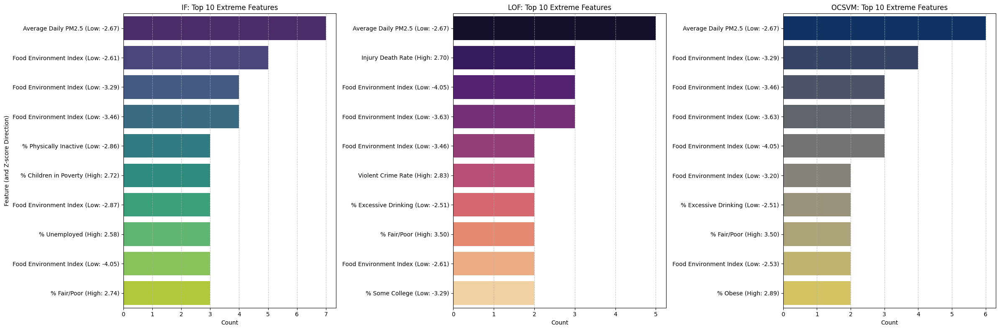

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(24, 8)) # Adjust figure size to accommodate three plots side-by-side

# Plot for Isolation Forest
plt.subplot(1, 3, 1) # 1 row, 3 columns, 1st plot
sns.barplot(x=feature_contribution_counts.head(10).values, y=feature_contribution_counts.head(10).index, palette='viridis', hue=feature_contribution_counts.head(10).index, legend=False)
plt.title('IF: Top 10 Extreme Features')
plt.xlabel('Count')
plt.ylabel('Feature (and Z-score Direction)')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Plot for LOF
plt.subplot(1, 3, 2) # 1 row, 3 columns, 2nd plot
sns.barplot(x=feature_contribution_counts_lof.head(10).values, y=feature_contribution_counts_lof.head(10).index, palette='magma', hue=feature_contribution_counts_lof.head(10).index, legend=False)
plt.title('LOF: Top 10 Extreme Features')
plt.xlabel('Count')
plt.ylabel('') # Remove y-label for better readability side-by-side
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Plot for One-Class SVM
plt.subplot(1, 3, 3) # 1 row, 3 columns, 3rd plot
sns.barplot(x=feature_contribution_counts_ocsvm.head(10).values, y=feature_contribution_counts_ocsvm.head(10).index, palette='cividis', hue=feature_contribution_counts_ocsvm.head(10).index, legend=False)
plt.title('OCSVM: Top 10 Extreme Features')
plt.xlabel('Count')
plt.ylabel('') # Remove y-label for better readability side-by-side
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

The above comparison bar plots show the features that most frequently exhibited extreme values (beyond ±2.5 standard deviations) among counties flagged as anomalies by Isolation Forest, LOF, One-class SVM consequently.

**Key observations:**

1. **Average Daily PM2.5** appeared most frequently among the three models, all with unusually LOW values (-2.61 SD), indicating that anomalous counties tend to have cleaner air than normal counties.

2. **Food Environment Index** appeared multiple times among the three models with progressively lower scores ranging from -2.61 to -4.05 SD, suggesting that poor food access is a defining characteristic of anomalous counties.

**Additional Notable Features: Cross-Model Comparison**

The pattern of feature selection across the three models reveals important insights about how different anomaly detection algorithms prioritize different types of deviations.

---

**% Fair/Poor (High) - Consistent Across All Three Models**

| Model | Count |
|-------|-------|
| IF | 2.74 |
| LOF | 3.5 |
| SVM | 3.5 |

**Interpretation:** Poor self-reported health is consistently flagged as an anomaly by all three detection methods. This means counties with unusually high rates of fair/poor health are reliably identified as anomalous, regardless of which algorithm is used.

---

**% Children in Poverty (High) - Only Isolation Forest**

| Model | Count |
|-------|-------|
| IF | 2.72 |
| LOF | Not in top 10 |
| SVM | Not in top 10 |

**Why only IF?** Isolation Forest identifies counties that are unusual relative to the entire United States. High child poverty rates are extreme by national standards. However, because these counties often cluster together geographically, LOF compares them to similarly poor neighbors and does not flag them as anomalies. SVM also failed to detect this pattern.

**What might be happening:** Counties with extreme child poverty may exist in geographic clusters, making them "normal" within their local neighborhood (thus missed by LOF) but globally anomalous (captured by IF).

**Why not SVM?** SVM draws a boundary around what it considers "normal" data. High child poverty counties do not form a clean, separable cluster outside this boundary. Instead, they are scattered in a way that SVM cannot easily distinguish from normal counties.

---

**% Unemployed (High) - Only Isolation Forest**

| Model | Count |
|-------|-------|
| IF | 2.58 |
| LOF | Not in top 10 |
| SVM | Not in top 10 |

**Similar explanation:** Unemployment, like child poverty, may exhibit spatial clustering. LOF's local density comparison would not flag these if surrounding counties also have high unemployment. IF's global perspective identifies them as anomalies relative to the national baseline.

---

**Violent Crime Rate (High) - Only LOF**

| Model | Count |
|-------|-------|
| IF | Not in top 10 |
| LOF | 3.0 |
| SVM | Not in top 10 |

**Why only LOF?** LOF is uniquely sensitive to local density deviations. High-crime counties may be local outliers within generally low-crime states or regions. For example, a high-crime county surrounded by low-crime counties in the same state would be missed by global methods (IF, SVM) but flagged by LOF.

**What might be happening:** Consider a county like St. Louis (independent city) with crime rates far exceeding its Missouri neighbors. LOF detects this local anomaly; IF does not because other high-crime counties exist elsewhere in the US.

---

**Injury Death Rate (High) - Only LOF**

| Model | Count |
|-------|-------|
| IF | Not in top 10 |
| LOF | 2.7 |
| SVM | Not in top 10 |

**Similar interpretation:** Injury deaths (from accidents, falls, etc.) may exhibit strong regional patterns (e.g., rural counties with limited trauma care). LOF detects counties that are anomalous relative to their immediate geographic neighbors, even if they are not globally extreme.

---

**% Excessive Drinking (Low) - LOF and SVM (Not IF)**

| Model | Count |
|-------|-------|
| IF | Not in top 10 |
| LOF | -2.51 |
| SVM | -2.51 |

**Why not IF?** Low excessive drinking rates may be common across many counties (e.g., rural religious communities, dry counties), making them not globally anomalous. However, LOF and SVM may detect them as anomalies when they occur in unexpected contexts (e.g., a low-drinking county in a high-drinking region).

**What might be happening:** A county in Wisconsin (high drinking culture) with unusually low excessive drinking rates would be locally anomalous (captured by LOF) but not globally extreme (missed by IF).

---

**% Some College (Low) - Only LOF**

| Model | Count |
|-------|-------|
| IF | Not in top 10 |
| LOF | -3.29 |
| SVM | Not in top 10 |

**Interpretation:** Low college attainment may be the norm in certain regions (e.g., rural South), making IF miss it. LOF detects counties where low education is anomalous relative to surrounding areas (e.g., a low-education county in a high-education state like Massachusetts).

---

**% Obese (High) - Only SVM**

| Model | Count |
|-------|-------|
| IF | Not in top 10 |
| LOF | Not in top 10 |
| SVM | 2.89 |

**Why only SVM?** SVM with RBF kernel can detect complex, non-linear boundaries that IF and LOF might miss. High obesity may interact with other features in a way that only SVM's kernel trick captures. Alternatively, this may be a weaker signal (lower count) that only SVM's decision boundary identified.

**What might be happening:** High obesity alone may not be anomalous (obesity is common in the US). However, SVM might identify counties where high obesity co-occurs with other unexpected features (e.g., high obesity + low poverty + good food access), creating a unique anomaly signature.

---

**Summary Table: Why Different Models Detect Different Features**

| Feature | Detected By | Why? |
|---------|-------------|------|
| % Children in Poverty (High) | IF only | Global anomaly, spatially clustered |
| % Unemployed (High) | IF only | Global anomaly, spatially clustered |
| Violent Crime Rate (High) | LOF only | Local anomaly, regional outlier |
| Injury Death Rate (High) | LOF only | Local anomaly, rural cluster |
| % Excessive Drinking (Low) | LOF + SVM | Contextual anomaly (unexpected in certain regions) |
| % Some College (Low) | LOF only | Local deviation from regional norm |
| % Obese (High) | SVM only | Complex non-linear pattern, weaker signal |
| % Fair/Poor (High) | All three | Robust, universal anomaly signature |

---

**Key Takeaway**

The divergence in feature selection across the three models highlights an important methodological insight: different anomaly detection algorithms capture different types of deviations.

- **Isolation Forest** excels at identifying global anomalies that are extreme relative to the national baseline
- **Local Outlier Factor** is uniquely sensitive to local anomalies that deviate from regional neighbors
- **One-Class SVM** occasionally captures complex, non-linear patterns missed by both IF and LOF

This complementarity justifies our ensemble approach, as no single method captures all anomaly types.

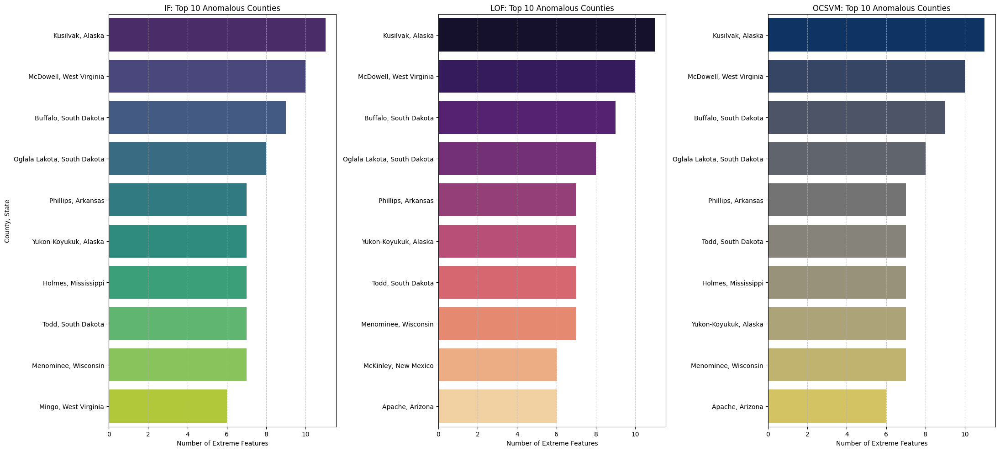

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(22, 10)) # Adjust figure size to accommodate three plots side-by-side

# Plot for Isolation Forest
plt.subplot(1, 3, 1) # 1 row, 3 columns, 1st plot
sns.barplot(x='Num Extreme Features', y='County_State', data=top_anomalous_counties, palette='viridis', hue='County_State', legend=False)
plt.title('IF: Top 10 Anomalous Counties')
plt.xlabel('Number of Extreme Features')
plt.ylabel('County, State')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Plot for LOF
plt.subplot(1, 3, 2) # 1 row, 3 columns, 2nd plot
sns.barplot(x='Num Extreme Features', y='County_State', data=top_lof_anomalous_counties, palette='magma', hue='County_State', legend=False)
plt.title('LOF: Top 10 Anomalous Counties')
plt.xlabel('Number of Extreme Features')
plt.ylabel('') # Remove y-label for better readability side-by-side
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Plot for One-Class SVM
plt.subplot(1, 3, 3) # 1 row, 3 columns, 3rd plot
sns.barplot(x='Num Extreme Features', y='County_State', data=top_ocsvm_anomalous_counties, palette='cividis', hue='County_State', legend=False)
plt.title('OCSVM: Top 10 Anomalous Counties')
plt.xlabel('Number of Extreme Features')
plt.ylabel('') # Remove y-label for better readability side-by-side
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

The graph titled 'Overlap of Anomalies Detected by Different Methods' illustrates how many counties are identified as anomalous by individual models or combinations of models.

**Total Unique Anomalies:** 267 *unique* counties across all three methods.

**Method-Specific Anomalies:**

| Method Only          | Unique Counties |
|----------------------|-----------------|
| Isolation Forest     | 57              |
| Local Outlier Factor | 42              |
| One-Class SVM        | 23              |

**Pairwise Overlap:**

| Method Pair | Unique Counties |
|-------------|-----------------|
| IF + LOF only    | 14              |
| IF + SVM only    | 29              |
| LOF + SVM only   | 44              |

**Consensus:** 58 counties flagged by all three methods.

**Total Anomalies Per Method (contamination=0.05):**

| Method             | Count |
|--------------------|-------|
| Isolation Forest   | 158   |
| LOF                | 158   |
| SVM                | 154   |
| Z-score            | 280   |

**Key Insights:**

- **Robust anomalies:** 58 counties agreed by all methods = highly reliable outliers

- **Algorithmic sensitivity:** LOF (density-based) and IF (partition-based) detect different anomaly types

- **Driving features:**

| Feature                         | Direction |
|---------------------------------|-----------|
| Years of Potential Life Lost Rate | High      |
| Food Environment Index          | Low       |
| Violent Crime Rate              | High      |
| % Severe Housing Problems       | High      |

### Overlap Analysis: One-Class SVM vs. Isolation Forest and LOF Anomalies

In [96]:
# Get the FIPS of anomalies from One-Class SVM
ocsvm_anomalies = data_knn_imputed[data_knn_imputed['ocsvm_anomaly'] == -1]
ocsvm_anomalies_fips = set(ocsvm_anomalies['FIPS'])

# Get the FIPS of anomalies from Isolation Forest (already computed)
if_anomalies_fips = set(data_knn_imputed[data_knn_imputed['isolation_forest_anomaly'] == -1]['FIPS'])

# Get the FIPS of anomalies from Local Outlier Factor (already computed)
lof_anomalies_fips = set(data_knn_imputed[data_knn_imputed['lof_anomaly'] == -1]['FIPS'])

# Calculate overlap between OCSVM and Isolation Forest
overlap_ocsvm_if_fips = ocsvm_anomalies_fips.intersection(if_anomalies_fips)
num_overlap_ocsvm_if = len(overlap_ocsvm_if_fips)

# Calculate overlap between OCSVM and LOF
overlap_ocsvm_lof_fips = ocsvm_anomalies_fips.intersection(lof_anomalies_fips)
num_overlap_ocsvm_lof = len(overlap_ocsvm_lof_fips)

# Calculate overlap among all three methods
overlap_all_three_fips = ocsvm_anomalies_fips.intersection(if_anomalies_fips).intersection(lof_anomalies_fips)
num_overlap_all_three = len(overlap_all_three_fips)

print(f"Number of anomalies detected by One-Class SVM: {len(ocsvm_anomalies_fips)}")
print(f"Number of anomalies detected by Isolation Forest: {len(if_anomalies_fips)}")
print(f"Number of anomalies detected by Local Outlier Factor: {len(lof_anomalies_fips)}")

print(f"\nOverlap between One-Class SVM and Isolation Forest: {num_overlap_ocsvm_if} counties ({num_overlap_ocsvm_if / len(ocsvm_anomalies_fips):.2%} of OCSVM anomalies, {num_overlap_ocsvm_if / len(if_anomalies_fips):.2%} of IF anomalies)")
print(f"Overlap between One-Class SVM and LOF: {num_overlap_ocsvm_lof} counties ({num_overlap_ocsvm_lof / len(ocsvm_anomalies_fips):.2%} of OCSVM anomalies, {num_overlap_ocsvm_lof / len(lof_anomalies_fips):.2%} of LOF anomalies)")
print(f"Overlap among all three methods (OCSVM, IF, LOF): {num_overlap_all_three} counties")

# Display sample of counties found by all three methods
if num_overlap_all_three > 0:
    print("\nSample of counties identified as anomalous by all three methods:")
    overlap_all_three_df = data_knn_imputed[data_knn_imputed['FIPS'].isin(overlap_all_three_fips)]
    display(overlap_all_three_df[['FIPS', 'State', 'County', 'isolation_forest_anomaly', 'lof_anomaly', 'ocsvm_anomaly']].head())
else:
    print("No counties found to be anomalous by all three methods.")

Number of anomalies detected by One-Class SVM: 154
Number of anomalies detected by Isolation Forest: 158
Number of anomalies detected by Local Outlier Factor: 158

Overlap between One-Class SVM and Isolation Forest: 87 counties (56.49% of OCSVM anomalies, 55.06% of IF anomalies)
Overlap between One-Class SVM and LOF: 102 counties (66.23% of OCSVM anomalies, 64.56% of LOF anomalies)
Overlap among all three methods (OCSVM, IF, LOF): 58 counties

Sample of counties identified as anomalous by all three methods:


,FIPS,State,County,isolation_forest_anomaly,lof_anomaly,ocsvm_anomaly
70,2050,Alaska,Bethel,-1,-1,-1
71,2060,Alaska,Bristol Bay,-1,-1,-1
72,2068,Alaska,Denali,-1,-1,-1
81,2158,Alaska,Kusilvak,-1,-1,-1
84,2180,Alaska,Nome,-1,-1,-1


This overlap analysis provides crucial insights into the agreement and disagreement between different anomaly detection techniques. High overlap suggests robust outliers that are consistently flagged across various algorithmic paradigms, while unique anomalies from each method might indicate different types of anomalous patterns these algorithms are sensitive to. This information is vital for deciding which anomalies to prioritize for further investigation.

### Summary of Anomaly Detection Findings

--- Overall Anomaly Detection Summary ---
Total unique counties flagged as anomalous by at least one method (IF, LOF, OCSVM): 267

Number of anomalies per method:
- Z-score (threshold >3): 280 rows (approx. 8.91%)
- Isolation Forest (contamination=0.05): 158 counties (approx. 5.03%)
- Local Outlier Factor (contamination=0.05): 158 counties (approx. 5.03%)
- One-Class SVM (nu=0.05): 154 counties (approx. 4.90%)

Overlap statistics:
- IF and LOF overlap: 72 counties (already calculated)
- OCSVM and IF overlap: 87 counties
- OCSVM and LOF overlap: 102 counties
- OCSVM, IF, and LOF overlap: 58 counties


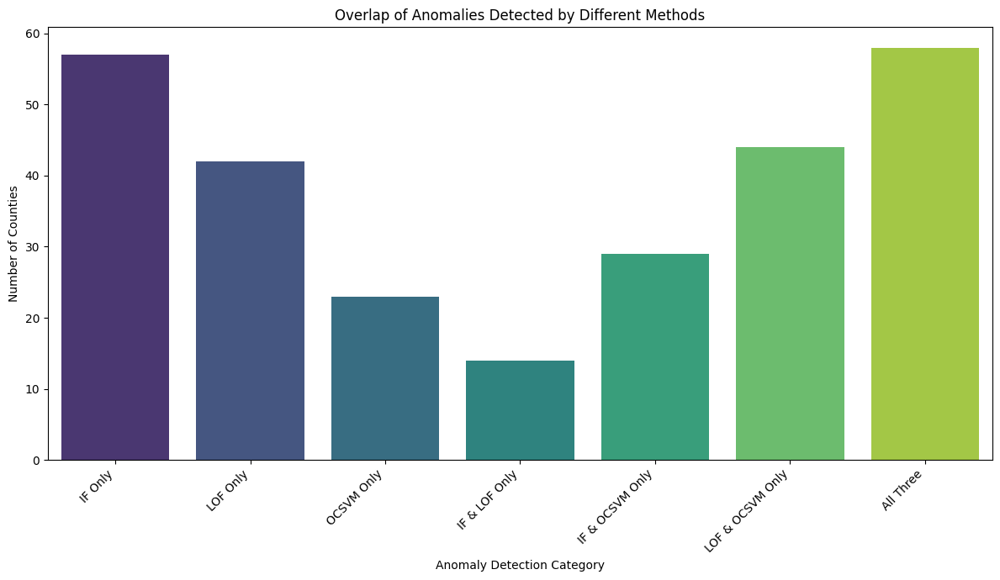

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

# Total number of unique anomalies detected across all methods (IF, LOF, OCSVM)
all_anomalies_fips = if_anomalies_fips.union(lof_anomalies_fips).union(ocsvm_anomalies_fips)
num_all_anomalies = len(all_anomalies_fips)

print("--- Overall Anomaly Detection Summary ---")
print(f"Total unique counties flagged as anomalous by at least one method (IF, LOF, OCSVM): {num_all_anomalies}")

print("\nNumber of anomalies per method:")
print(f"- Z-score (threshold >{z_score_threshold}): {total_anomalous_rows} rows (approx. {total_anomalous_rows / len(data_knn_imputed):.2%})")
print(f"- Isolation Forest (contamination=0.05): {len(if_anomalies_fips)} counties (approx. {len(if_anomalies_fips) / len(data_knn_imputed):.2%})")
print(f"- Local Outlier Factor (contamination=0.05): {len(lof_anomalies_fips)} counties (approx. {len(lof_anomalies_fips) / len(data_knn_imputed):.2%})")
print(f"- One-Class SVM (nu=0.05): {len(ocsvm_anomalies_fips)} counties (approx. {len(ocsvm_anomalies_fips) / len(data_knn_imputed):.2%})")

print("\nOverlap statistics:")
print(f"- IF and LOF overlap: {num_overlap_anomalies} counties (already calculated)")
print(f"- OCSVM and IF overlap: {num_overlap_ocsvm_if} counties")
print(f"- OCSVM and LOF overlap: {num_overlap_ocsvm_lof} counties")
print(f"- OCSVM, IF, and LOF overlap: {num_overlap_all_three} counties")

# Ensure `overlap_if_lof_fips` is defined for this cell. Re-calculating if needed.
overlap_if_lof_fips = if_anomalies_fips.intersection(lof_anomalies_fips)

# You can also create a small visualization for overlap
overlap_counts = {
    'IF Only': len(if_anomalies_fips - lof_anomalies_fips - ocsvm_anomalies_fips),
    'LOF Only': len(lof_anomalies_fips - if_anomalies_fips - ocsvm_anomalies_fips),
    'OCSVM Only': len(ocsvm_anomalies_fips - if_anomalies_fips - lof_anomalies_fips),
    'IF & LOF Only': len(overlap_if_lof_fips - ocsvm_anomalies_fips),
    'IF & OCSVM Only': len(overlap_ocsvm_if_fips - lof_anomalies_fips),
    'LOF & OCSVM Only': len(overlap_ocsvm_lof_fips - if_anomalies_fips),
    'All Three': num_overlap_all_three
}

overlap_df_plot = pd.DataFrame(overlap_counts.items(), columns=['Category', 'Count'])

plt.figure(figsize=(12, 7))
sns.barplot(x='Category', y='Count', data=overlap_df_plot, palette='viridis', hue='Category', legend=False)
plt.title('Overlap of Anomalies Detected by Different Methods')
plt.xlabel('Anomaly Detection Category')
plt.ylabel('Number of Counties')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


**Key Insights**

1. The Z-score method identifies anomalies based on individual feature extremity, often flagging a higher number of instances due to its univariate nature.

2. Isolation Forest, LOF, and One-Class SVM aim for a similar 'contamination' rate, resulting in a comparable number of detected anomalies.

3. The overlap analysis reveals the consistency of detections across methods. High overlap suggests robust anomalies that exhibit unusual patterns from multiple perspectives.

4. Discrepancies highlight that each algorithm has a unique way of defining and detecting 'outliers', sensitive to different data structures and densities. For instance, LOF is density-based, while Isolation Forest is partition-based.

5. Features with consistently high Z-scores across multiple anomalies (e.g., 'Years of Potential Life Lost Rate', 'Food Environment Index', 'Violent Crime Rate', '% Severe Housing Problems') are strong indicators of underlying issues in those anomalous counties.

**Next Steps**

Based on these findings, you can choose to focus on:

- Counties identified by multiple methods for the most robust anomalies
- Unique anomalies from specific methods to understand different types of unusual behaviors
- Further investigating the features driving these anomalies to identify potential root causes or actionable insights

## b- Dealing With The Overlapped Anomalies

### Overlapped Anomalies Data tables

In [98]:
import pandas as pd

# `overlap_all_three_fips` contains the FIPS codes of counties identified as anomalous by all three methods
# We filter the original `data_knn_imputed` DataFrame to get these specific counties
consensus_anomalies_df = data_knn_imputed[data_knn_imputed['FIPS'].isin(overlap_all_three_fips)].copy()

print(f"Number of counties identified as anomalous by all three methods: {len(consensus_anomalies_df)}")
print("Head of the new 'consensus_anomalies_df' DataFrame:")
display(consensus_anomalies_df.head())

Number of counties identified as anomalous by all three methods: 58
Head of the new 'consensus_anomalies_df' DataFrame:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,% Unemployed,% Children in Poverty,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,isolation_forest_anomaly,lof_anomaly,lof_anomaly_score,ocsvm_anomaly
70,2050,Alaska,Bethel,12528.584945,26.270612,5.684245,4.857296,33.382314,29.4,2.9,...,14.092334,33.8,90.975577,151.199516,7.14,60.247748,-1,-1,1.920864,-1
71,2060,Alaska,Bristol Bay,12753.701246,15.454088,3.745194,3.511147,20.041734,39.1,6.6,...,6.947891,14.2,67.294751,276.713495,6.80,13.750000,-1,-1,2.137745,-1
72,2068,Alaska,Denali,6295.766762,12.200584,3.232785,2.959423,17.614422,26.4,6.1,...,8.581752,8.5,87.392110,67.897035,6.72,27.777778,-1,-1,1.522050,-1
81,2158,Alaska,Kusilvak,30717.362820,37.948393,7.230990,5.880396,42.754056,27.5,2.0,...,21.278195,45.4,138.380487,275.247723,7.76,70.118343,-1,-1,2.317364,-1
84,2180,Alaska,Nome,11383.093563,26.023675,5.606600,4.750988,35.815531,33.5,3.3,...,12.515676,30.6,136.559890,137.688056,7.00,48.591549,-1,-1,1.556910,-1


-  `isolation_forest_anomaly` (-1 = anomaly, 1 = normal)
-  `lof_anomaly` (-1 = anomaly, 1 = normal)
-  `lof_anomaly_score` (higher = more anomalous)
-  `ocsvm_anomaly` (-1 = anomaly, 1 = normal)
-  `ocsvm_score` (raw decision function output)
-  `anomaly_votes` (count of models flagging anomaly: 0, 1, 2, or 3)
-  `consensus_anomaly_2plus` (True if votes >= 2)
-  `isolation_forest_score_norm` (normalized IF score)
-  `lof_anomaly_score_norm` (normalized LOF score)
-  `ocsvm_score_norm` (normalized SVM score)
-  `combined_anomaly_score` (average of normalized scores)

In [99]:
from sklearn.preprocessing import MinMaxScaler

# --- 1. Get raw anomaly scores for all models and ensure higher score = more anomalous ---
# Isolation Forest: decision_function returns negative values for anomalies, so take the negative
# to make higher values more anomalous.
features_for_all_models = features_for_isolation_forest # All models used the same feature set

data_knn_imputed['isolation_forest_score'] = -iso_forest.decision_function(data_scaled[features_for_all_models])

# LOF: lof_anomaly_score was already defined as -lof.negative_outlier_factor_, so higher is more anomalous.
# No change needed for 'lof_anomaly_score'.

# One-Class SVM: decision_function returns negative values for anomalies, so take the negative
# to make higher values more anomalous.
data_knn_imputed['ocsvm_score'] = -oc_svm.decision_function(data_scaled[features_for_all_models])

# --- 2. Normalize these raw scores to a 0-1 range ---
scaler = MinMaxScaler()

data_knn_imputed['isolation_forest_score_norm'] = scaler.fit_transform(data_knn_imputed[['isolation_forest_score']])
data_knn_imputed['lof_anomaly_score_norm'] = scaler.fit_transform(data_knn_imputed[['lof_anomaly_score']])
data_knn_imputed['ocsvm_score_norm'] = scaler.fit_transform(data_knn_imputed[['ocsvm_score']])

# --- 3. Create the combined anomaly score (average of normalized scores) ---
data_knn_imputed['combined_anomaly_score'] = data_knn_imputed[['isolation_forest_score_norm', 'lof_anomaly_score_norm', 'ocsvm_score_norm']].mean(axis=1)

# --- 4. Add binary flags and anomaly votes for comprehensive analysis ---
data_knn_imputed['if_flag'] = (data_knn_imputed['isolation_forest_anomaly'] == -1).astype(int)
data_knn_imputed['lof_flag'] = (data_knn_imputed['lof_anomaly'] == -1).astype(int)
data_knn_imputed['ocsvm_flag'] = (data_knn_imputed['ocsvm_anomaly'] == -1).astype(int)

data_knn_imputed['anomaly_votes'] = data_knn_imputed['if_flag'] + data_knn_imputed['lof_flag'] + data_knn_imputed['ocsvm_flag']
data_knn_imputed['consensus_anomaly_2plus'] = (data_knn_imputed['anomaly_votes'] >= 2).astype(int)

# --- 5. Filter for consensus anomalies and sort by combined_anomaly_score ---
# Ensure `overlap_all_three_fips` is defined. It was defined in cell f61eaf58.
consensus_anomalies_df = data_knn_imputed[data_knn_imputed['FIPS'].isin(overlap_all_three_fips)].copy()

sorted_consensus_anomalies_df = consensus_anomalies_df.sort_values(by='combined_anomaly_score', ascending=False)

print("Consensus anomalies sorted by combined anomaly score (highest first):")
display(sorted_consensus_anomalies_df.head())

# Display the top 10 FIPS, State, County, and their combined_anomaly_score
print("\nTop 10 Consensus Anomalous Counties by Combined Anomaly Score:")
display(sorted_consensus_anomalies_df[['FIPS', 'State', 'County', 'combined_anomaly_score']].head(10))

Consensus anomalies sorted by combined anomaly score (highest first):


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,ocsvm_score,isolation_forest_score_norm,lof_anomaly_score_norm,ocsvm_score_norm,combined_anomaly_score,if_flag,lof_flag,ocsvm_flag,anomaly_votes,consensus_anomaly_2plus
412,13053,Georgia,Chattahoochee,8904.411776,19.398351,4.084020,3.758120,19.643414,28.2,4.3,...,5.460082,0.545682,1.000000,1.000000,0.848561,1,1,1,3,1
81,2158,Alaska,Kusilvak,30717.362820,37.948393,7.230990,5.880396,42.754056,27.5,2.0,...,5.449062,1.000000,0.506718,0.999136,0.835285,1,1,1,3,1
2412,46102,South Dakota,Oglala Lakota,36469.014359,33.406126,6.357596,5.354507,41.201763,41.2,0.0,...,5.372336,0.893045,0.279993,0.993120,0.722053,1,1,1,3,1
70,2050,Alaska,Bethel,12528.584945,26.270612,5.684245,4.857296,33.382314,29.4,2.9,...,4.155007,0.754574,0.359084,0.897673,0.670444,1,1,1,3,1
95,2290,Alaska,Yukon-Koyukuk,16359.873473,23.978208,5.211279,4.615106,31.358855,30.3,2.1,...,4.795038,0.752631,0.244534,0.947856,0.648340,1,1,1,3,1



Top 10 Consensus Anomalous Counties by Combined Anomaly Score:


,FIPS,State,County,combined_anomaly_score
412,13053,Georgia,Chattahoochee,0.848561
81,2158,Alaska,Kusilvak,0.835285
2412,46102,South Dakota,Oglala Lakota,0.722053
70,2050,Alaska,Bethel,0.670444
95,2290,Alaska,Yukon-Koyukuk,0.648340
71,2060,Alaska,Bristol Bay,0.634004
2369,46017,South Dakota,Buffalo,0.630975
86,2188,Alaska,Northwest Arctic,0.627125
3086,55078,Wisconsin,Menominee,0.624922
2925,51610,Virginia,Falls Church City,0.619082


The `combined_anomaly_score` is an average of the normalized scores from Isolation Forest, Local Outlier Factor (LOF), and One-Class SVM. Each of these individual scores was scaled to a range between 0 and 1 using MinMaxScaler for easy comparison and interpretation.

In [100]:
import pandas as pd

# --- First Table: Number of unique states with at least one anomaly ---
num_unique_states = consensus_anomalies_df['State'].nunique()
print(f"Table 1: Number of unique states with at least one anomaly: {num_unique_states}")

# --- Second Table: State and the count of anomalies within each state ---
anomalies_per_state = consensus_anomalies_df.groupby('State').size().sort_values(ascending=False).reset_index(name='Number of Anomalies')
print("\nTable 2: Number of anomalous counties per state (sorted descending):")
display(anomalies_per_state)

# --- Recommendation ---
if num_unique_states > 0:
    print("\n--- Recommendation ---")
    if anomalies_per_state['Number of Anomalies'].max() > 1 and num_unique_states > 1:
        print("There are a significant number of unique states ({}) that contain anomalies, and some states have multiple anomalous counties.\nThis suggests that both state-level and county-level analysis are valuable. You could:")
        print("1. Continue working at the **county level** to dive deep into the specific characteristics of individual anomalous counties.")
        print("2. Explore the **state level** by analyzing why certain states have a higher concentration of anomalous counties. This might reveal broader regional trends or state-specific policies/factors contributing to health disparities.")
        print("It's likely beneficial to continue with both perspectives, perhaps focusing on the states with the highest number of anomalies (e.g., Alaska, West Virginia, South Dakota in this list) for more detailed county-level investigation within those states, while also considering overall state characteristics.")
    else:
        print("Anomalies are either concentrated in very few states or very thinly spread. Given the specific context of county health rankings, working at the **county level** is generally more appropriate to capture granular local variations that define an anomaly.")
else:
    print("No consensus anomalies were found across all three models, so a recommendation cannot be made based on these tables.")

Table 1: Number of unique states with at least one anomaly: 23

Table 2: Number of anomalous counties per state (sorted descending):


,State,Number of Anomalies
0,Alaska,8
1,South Dakota,8
2,Texas,7
3,New Mexico,6
4,Georgia,5
5,North Dakota,3
6,California,2
7,Utah,2
8,Idaho,2
9,West Virginia,2



--- Recommendation ---
There are a significant number of unique states ({}) that contain anomalies, and some states have multiple anomalous counties.
This suggests that both state-level and county-level analysis are valuable. You could:
1. Continue working at the **county level** to dive deep into the specific characteristics of individual anomalous counties.
2. Explore the **state level** by analyzing why certain states have a higher concentration of anomalous counties. This might reveal broader regional trends or state-specific policies/factors contributing to health disparities.
It's likely beneficial to continue with both perspectives, perhaps focusing on the states with the highest number of anomalies (e.g., Alaska, West Virginia, South Dakota in this list) for more detailed county-level investigation within those states, while also considering overall state characteristics.


In [101]:
print("Table of Anomalous Counties with Combined Anomaly Score:")
# Display the DataFrame containing the anomalous counties, their state, county name, and the combined anomaly score.
display(sorted_consensus_anomalies_df[['State', 'County', 'combined_anomaly_score']])

Table of Anomalous Counties with Combined Anomaly Score:


,State,County,combined_anomaly_score
412,Georgia,Chattahoochee,0.848561
81,Alaska,Kusilvak,0.835285
2412,South Dakota,Oglala Lakota,0.722053
70,Alaska,Bethel,0.670444
95,Alaska,Yukon-Koyukuk,0.648340
71,Alaska,Bristol Bay,0.634004
2369,South Dakota,Buffalo,0.630975
86,Alaska,Northwest Arctic,0.627125
3086,Wisconsin,Menominee,0.624922
2925,Virginia,Falls Church City,0.619082


In [102]:
num_unique_counties = sorted_consensus_anomalies_df['County'].nunique()
total_anomalous_counties = len(sorted_consensus_anomalies_df)

print(f"Total anomalous counties identified: {total_anomalous_counties}")
print(f"Number of unique county names: {num_unique_counties}")

if num_unique_counties == total_anomalous_counties:
    print("All counties in the sorted_consensus_anomalies_df are unique.")
else:
    print("There are duplicate county names in the sorted_consensus_anomalies_df.")
    # Optional: Display duplicate counties if any
    # duplicated_counties = sorted_consensus_anomalies_df[sorted_consensus_anomalies_df.duplicated(subset=['County'], keep=False)]
    # print("\nDuplicate county names and their states:")
    # display(duplicated_counties[['County', 'State']].sort_values(by='County'))

Total anomalous counties identified: 58
Number of unique county names: 57
There are duplicate county names in the sorted_consensus_anomalies_df.


In [103]:
sorted_consensus_anomalies_df.shape

(58, 36)

### Geographic Representation of the overlapped anomalies

In [104]:
import plotly.express as px
import pandas as pd

# URL for the GeoJSON file containing US county boundaries and FIPS codes
geoj_url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"

# Ensure sorted_consensus_anomalies_df is available from previous cells
# IMPORTANT: Convert FIPS codes to string type to match GeoJSON format, and pad with leading zeros
sorted_consensus_anomalies_df['FIPS'] = sorted_consensus_anomalies_df['FIPS'].astype(str).str.zfill(5)

# Use the full dataframe including Alaska
usa_anomalies_df = sorted_consensus_anomalies_df.copy()

if not usa_anomalies_df.empty:
    # Create a 'hover_name' for better interactivity on the map
    usa_anomalies_df['County_State_AnomScore'] = \
        usa_anomalies_df['County'] + ', ' + \
        usa_anomalies_df['State'] + \
        ' (Score: ' + usa_anomalies_df['combined_anomaly_score'].round(3).astype(str) + ')'

    # Create a choropleth map for the USA (including Alaska)
    fig = px.choropleth(
        usa_anomalies_df,
        geojson=geoj_url,
        locations='FIPS',
        color='combined_anomaly_score',
        color_continuous_scale="mygbm", # Using a vibrant color scale
        range_color=(
            sorted_consensus_anomalies_df['combined_anomaly_score'].min(), # Use full range for color consistency
            sorted_consensus_anomalies_df['combined_anomaly_score'].max()
        ),
        scope="usa", # Set scope to usa
        hover_name='County_State_AnomScore',
        title='Locations of Consensus Anomalous Counties in USA (Including Alaska) by Combined Anomaly Score'
    )

    # Configure geographic details for the USA map
    fig.update_geos(
        projection_type="albers usa", # Albers USA is ideal for the entire United States, handling Alaska and Hawaii
        visible=True,
        scope="usa",
        showsubunits=True,
        subunitcolor="lightgrey" # Light grey state borders for context
    )

    fig.show()
else:
    print("No anomalous counties found for the USA in the consensus data.")

We can notice theat the anomalies are mostly concentrated in both far south and north of the USA, in addition to Alaska which has the highest number of anomalies.

**Anomaly Count by State:**

| State | Anomaly Count |
|-------|---------------|
| Alaska | 8 |
| South Dakota | 8 |
| Texas | 7 |
| New Mexico | 6 |
| Georgia | 5 |
| North Dakota | 3 |
| California | 2 |
| Utah | 2 |
| Idaho | 2 |
| West Virginia | 2 |
| Arkansas | 1 |
| District of Columbia | 1 |
| Colorado | 1 |
| Arizona | 1 |
| Iowa | 1 |
| Nevada | 1 |
| Montana | 1 |
| Missouri | 1 |
| Massachusetts | 1 |
| Illinois | 1 |
| New York | 1 |
| Virginia | 1 |
| Wisconsin | 1 |

**Key Findings:**

1. **Alaska and South Dakota** have the most anomalies (8 each), followed by Texas (7) and New Mexico (6). These four states account for 29 of 58 anomalies (50%).

2. **Geographic clustering:** Western states contain 34 anomalies (59%), Southern states contain 16 anomalies (28%), and Northeastern states contain only 2 anomalies (3%).

3. **Large population states have few anomalies:** California (2), New York (1), Florida (0), Pennsylvania (0).

4. **28 states had zero consensus anomalies** (e.g., Florida, Ohio, Michigan, North Carolina, Washington).

5. **Rural states dominate:** Alaska, South Dakota, North Dakota, and New Mexico (all rural) have the highest anomaly counts.

**Summary:**

Anomalous counties are concentrated in rural western and southern states (Alaska, South Dakota, Texas, and New Mexico), while densely populated northeastern and midwestern states have few or no anomalies, suggesting that rurality and regional disadvantage are key drivers of atypical health profiles.

In [105]:
import plotly.express as px
import pandas as pd

# URL for the GeoJSON file containing US county boundaries and FIPS codes
geoj_url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"

# Ensure sorted_consensus_anomalies_df is available from previous cells
# IMPORTANT: Convert FIPS codes to string type to match GeoJSON format, and pad with leading zeros
sorted_consensus_anomalies_df['FIPS'] = sorted_consensus_anomalies_df['FIPS'].astype(str).str.zfill(5)

# Create a 'hover_name' for better interactivity on the map
# This assumes 'County', 'State', and 'combined_anomaly_score' columns exist.
sorted_consensus_anomalies_df['County_State_AnomScore'] = \
    sorted_consensus_anomalies_df['County'] + ', ' + \
    sorted_consensus_anomalies_df['State'] + \
    ' (Score: ' + sorted_consensus_anomalies_df['combined_anomaly_score'].round(3).astype(str) + ')'

# Create a choropleth map for North America
fig = px.choropleth(
    sorted_consensus_anomalies_df,
    geojson=geoj_url,
    locations='FIPS',
    color='combined_anomaly_score',
    color_continuous_scale="Turbo", # Using a vibrant color scale
    range_color=(
        sorted_consensus_anomalies_df['combined_anomaly_score'].min(),
        sorted_consensus_anomalies_df['combined_anomaly_score'].max()
    ),
    scope="north america", # Set scope to North America
    hover_name='County_State_AnomScore',
    title='Locations of Consensus Anomalous Counties in North America by Combined Anomaly Score'
)

# Use 'natural earth' projection for a broader geographic scope like North America
# Setting visible=True to ensure background map is not hidden
# Removing fitbounds="locations" to prevent aggressive zooming that might obscure Alaska.
fig.update_geos(
    projection_type="natural earth", # A suitable projection for continent-level maps
    visible=True, # Make background visible
    scope="north america", # Explicitly set scope to North America
    showsubunits=True, # Show state borders
    subunitcolor="lightgrey" # Set state border color to light grey
    # Removed fitbounds="locations" to avoid aggressive zooming that might obscure Alaska.
)

fig.show()

### Identifying extreme features in each state and county

In [106]:
import numpy as np

# Ensure `sorted_consensus_anomalies_df` and `data_zscore` are available
# `contribution_z_score_threshold` (2.5) and `numeric_cols_for_zscore` should also be available

# Prepare a list to store the detailed breakdown for each consensus anomaly
consensus_anomalies_details = []

# Iterate through each row of the sorted_consensus_anomalies_df
for index, row in sorted_consensus_anomalies_df.iterrows():
    fips = row['FIPS']
    state = row['State']
    county = row['County']
    combined_score = row['combined_anomaly_score']

    # Get the Z-scores for this specific county
    # We need to ensure we're looking up the correct index from data_zscore
    # The original index from data_knn_imputed (before filtering for consensus) is preserved in sorted_consensus_anomalies_df's index
    z_scores_for_county = data_zscore.loc[index, numeric_cols_for_zscore]

    extreme_features = []
    for feature in numeric_cols_for_zscore:
        z_score = z_scores_for_county[feature]
        if z_score > contribution_z_score_threshold:
            extreme_features.append(f"{feature} (High: {z_score:.2f})")
        elif z_score < -contribution_z_score_threshold:
            extreme_features.append(f"{feature} (Low: {z_score:.2f})")

    consensus_anomalies_details.append({
        'FIPS': fips,
        'State': state,
        'County': county,
        'Combined Anomaly Score': combined_score,
        'Num Extreme Features': len(extreme_features),
        'Extreme Features': extreme_features
    })

# Convert the list of dictionaries to a DataFrame for easier display
consensus_anomalies_details_df = pd.DataFrame(consensus_anomalies_details)

# Sort by State, then by Combined Anomaly Score
consensus_anomalies_details_df_sorted = consensus_anomalies_details_df.sort_values(
    by=['State', 'Combined Anomaly Score'], ascending=[True, False]
)

print("\nDetailed Breakdown of Consensus Anomalies by State and County:")
for state_name, state_group in consensus_anomalies_details_df_sorted.groupby('State'):
    print(f"\n### State: {state_name}")
    for county_index, county_row in state_group.iterrows():
        print(f"\n  - **County: {county_row['County']}** (FIPS: {county_row['FIPS']}, Score: {county_row['Combined Anomaly Score']:.3f})\n")
        if county_row['Num Extreme Features'] > 0:
            print(f"    Extreme Features ({county_row['Num Extreme Features']}):")
            for feature_detail in county_row['Extreme Features']:
                print(f"\n      - {feature_detail}")
        else:
            print("    No features exceeded the Z-score threshold (2.5) for this county.")



Detailed Breakdown of Consensus Anomalies by State and County:

### State: Alaska

  - **County: Kusilvak** (FIPS: 02158, Score: 0.835)

    Extreme Features (11):

      - Years of Potential Life Lost Rate (High: 8.91)

      - % Fair/Poor (High: 4.36)

      - Physically Unhealthy Days (High: 4.63)

      - Mentally Unhealthy Days (High: 3.18)

      - % Smokers (High: 6.80)

      - Food Environment Index (Low: -4.55)

      - % Some College (Low: -2.95)

      - % Unemployed (High: 8.48)

      - % Children in Poverty (High: 2.50)

      - Injury Death Rate (High: 7.56)

      - % Severe Housing Problems (High: 11.62)

  - **County: Bethel** (FIPS: 02050, Score: 0.670)

    Extreme Features (5):

      - % Smokers (High: 4.24)

      - Food Environment Index (Low: -3.79)

      - % Unemployed (High: 4.68)

      - Injury Death Rate (High: 2.68)

      - % Severe Housing Problems (High: 9.56)

  - **County: Yukon-Koyukuk** (FIPS: 02290, Score: 0.648)

    Extreme Features (7):

   

### Key Findings from Consensus Anomalies Analysis

---

#### Finding 1: Kusilvak, Alaska is the Most Anomalous County Overall

Kusilvak has the highest anomaly score (0.835) with 11 extreme features:

- Severe Housing Problems: +11.62 SD
- Years of Potential Life Lost Rate: +8.91 SD
- Unemployment: +8.48 SD
- Injury Death Rate: +7.56 SD
- Smoking: +6.80 SD

> *Kusilvak is the most anomalous county because it simultaneously experiences extreme housing distress, premature mortality, unemployment, injury deaths, and smoking — a combination of crises found nowhere else at this magnitude.*

---

#### Finding 2: Oglala Lakota, SD Has the Most Extreme Single Feature

While Kusilvak has the highest overall score, Oglala Lakota has the most extreme individual feature:

- Years of Potential Life Lost Rate: **+11.19 SD** (highest across ALL anomalies)

---

#### Finding 3: Injury Death Rate is the Most Common Extreme Feature

| Feature | Appears in # of Counties |
|---------|-------------------------|
| Injury Death Rate (High) | 20+ counties |
| Food Environment Index (Low) | 15+ counties |
| Smokers (High) | 12+ counties |
| Severe Housing Problems (High) | 12+ counties |
| Unemployed (High) | 10+ counties |

---

#### Finding 4: Native American Counties Dominate Extreme Anomalies

| County | State | Score | Notes |
|--------|-------|-------|-------|
| Kusilvak | Alaska | 0.835 | Rural Alaska Native |
| Oglala Lakota | South Dakota | 0.722 | Pine Ridge Reservation |
| Buffalo | South Dakota | 0.631 | Crow Creek Reservation |
| Menominee | Wisconsin | 0.625 | Menominee Reservation |
| Sioux | North Dakota | 0.590 | Standing Rock Reservation |
| Apache | Arizona | 0.582 | Navajo Nation |
| Todd | South Dakota | 0.575 | Rosebud Reservation |
| McKinley | New Mexico | 0.537 | Navajo Nation |

**8 of the most extreme anomalies are counties with significant Native American populations.**

---

#### Finding 5: Alaska's Anomalies are Uniquely Severe

Alaska has 8 anomalies with extreme housing problems:

- Kusilvak: Severe Housing Problems **+11.62 SD**
- Bethel: Severe Housing Problems **+9.56 SD**
- Yukon-Koyukuk: Severe Housing Problems **+7.95 SD**
- Northwest Arctic: Severe Housing Problems **+8.22 SD**
- Nome: Severe Housing Problems **+7.13 SD**

---

#### Finding 6: Georgia's Anomalies are Driven by Food Environment

- Clay County: Food Environment Index **-6.07 SD** (most extreme food desert in dataset)
- Taliaferro County: Food Environment Index -4.05 SD
- Calhoun County: Violent Crime Rate +7.91 SD
- Chattahoochee County: Dentist Rate +18.64 SD (extreme outlier for dental access)

---

#### Finding 7: Texas Anomalies Cluster on the Mexican Border

All 7 Texas anomalies are in South Texas border region:

- Starr, Willacy, Presidio, Hudspeth, Webb, Zavala, Hidalgo

Common features: High uninsured rates, high unemployment, high fair/poor health, high child poverty.

---

#### Finding 8: Urban Anomalies Look Different from Rural Anomalies

| Urban Anomaly | Key Features |
|---------------|--------------|
| San Francisco | Low obesity (-2.96 SD), high dentist rate, high crime |
| New York County | Low obesity (-3.52 SD), high excessive drinking |
| Suffolk (Boston) | High excessive drinking, high dentist rate |
| Washington DC | High excessive drinking, high dentist rate |

**Urban anomalies are defined by LOW obesity and HIGH dental access (paradoxes, not problems).**

---

#### Finding 9: Dentist Rate is a Surprising Anomaly Driver

High dentist rate appears in:

- Chattahoochee, GA (+18.64 SD - extreme)
- Falls Church City, VA (+8.51 SD)
- Johnson, IA (+5.92 SD)
- Jones, SD (+5.72 SD)
- Jerauld, SD (+6.84 SD)
- Suffolk, MA (+5.10 SD)

**These are wealthy or college-town counties with unusually good dental access.**

---

#### Finding 10: West Virginia Shows Severe Multi-Dimensional Distress

McDowell County has **10 extreme features** across all domains:

- High premature mortality (+4.41 SD)
- High fair/poor health (+3.34 SD)
- High physically unhealthy days (+3.46 SD)
- High mentally unhealthy days (+3.31 SD)
- High smoking (+2.73 SD)
- High obesity (+2.91 SD)
- Low excessive drinking (-2.51 SD)
- Low college attainment (-3.16 SD)
- High unemployment (+3.61 SD)
- High injury death rate (+4.44 SD)

---

#### Finding 11: Two Distinct Types of Anomalies Emerge

| Type | Characteristics | Example Counties |
|------|----------------|------------------|
| **Type A: Distressed Rural** | High mortality, high smoking, high injury deaths, poor food access, high poverty | Kusilvak (AK), Oglala Lakota (SD), McDowell (WV) |
| **Type B: Affluent Urban Paradox** | Low obesity, high dental access, high crime, high housing costs | San Francisco, NYC, Boston, DC |

---

### Summary Table

| Finding | Key Observation |
|---------|-----------------|
| Highest anomaly score | Kusilvak, AK (0.835) |
| Most extreme single feature | Oglala Lakota, SD (YPLL +11.19 SD) |
| Most common extreme feature | Injury Death Rate (20+ counties) |
| Native American counties | 8 of most extreme anomalies |
| Alaska's severity | Housing problems as high as +11.62 SD |
| Georgia's severity | Food environment as low as -6.07 SD |
| Texas cluster | 7 border counties with high uninsured rates |
| Urban paradox | Low obesity + high dentist rate |
| West Virginia | McDowell County has 10 extreme features |

---

### Summary

Consensus anomalies reveal two distinct profiles: severely distressed rural counties (especially Native American areas in Alaska, South Dakota, and the Southwest) characterized by high mortality, injury deaths, and poor food access; and affluent urban paradoxes (San Francisco, NYC, Boston, DC) defined by low obesity but high crime and housing costs.

# Conclusion

## Final Visualizations

In [107]:
def get_region(state):
    west = ['Alaska', 'Arizona', 'California', 'Colorado', 'Hawaii', 'Idaho', 'Montana', 'Nevada', 'New Mexico', 'Oregon', 'Utah', 'Washington', 'Wyoming']
    south = ['Alabama', 'Arkansas', 'Delaware', 'District of Columbia', 'Florida', 'Georgia', 'Kentucky', 'Louisiana', 'Maryland', 'Mississippi', 'North Carolina', 'Oklahoma', 'South Carolina', 'Tennessee', 'Texas', 'Virginia', 'West Virginia']
    midwest = ['Illinois', 'Indiana', 'Iowa', 'Kansas', 'Michigan', 'Minnesota', 'Missouri', 'Nebraska', 'North Dakota', 'Ohio', 'South Dakota', 'Wisconsin']
    northeast = ['Connecticut', 'Maine', 'Massachusetts', 'New Hampshire', 'New Jersey', 'New York', 'Pennsylvania', 'Rhode Island', 'Vermont']

    if state in west:
        return 'West'
    elif state in south:
        return 'South'
    elif state in midwest:
        return 'Midwest'
    elif state in northeast:
        return 'Northeast'
    else:
        return 'Other'

# Apply the function to create the 'Region' column
sorted_consensus_anomalies_df['Region'] = sorted_consensus_anomalies_df['State'].apply(get_region)

# Get the top 15 most anomalous counties by combined_anomaly_score
top_15_anomalies_by_score = sorted_consensus_anomalies_df.head(15)

print("Top 15 Most Anomalous Counties (by Combined Anomaly Score) with Regions:")
display(top_15_anomalies_by_score[['FIPS', 'State', 'County', 'Region', 'combined_anomaly_score']])

print("\nHead of sorted_consensus_anomalies_df with new 'Region' column:")
display(sorted_consensus_anomalies_df.head())

Top 15 Most Anomalous Counties (by Combined Anomaly Score) with Regions:


,FIPS,State,County,Region,combined_anomaly_score
412,13053,Georgia,Chattahoochee,South,0.848561
81,02158,Alaska,Kusilvak,West,0.835285
2412,46102,South Dakota,Oglala Lakota,Midwest,0.722053
70,02050,Alaska,Bethel,West,0.670444
95,02290,Alaska,Yukon-Koyukuk,West,0.648340
71,02060,Alaska,Bristol Bay,West,0.634004
2369,46017,South Dakota,Buffalo,Midwest,0.630975
86,02188,Alaska,Northwest Arctic,West,0.627125
3086,55078,Wisconsin,Menominee,Midwest,0.624922
2925,51610,Virginia,Falls Church City,South,0.619082



Head of sorted_consensus_anomalies_df with new 'Region' column:


,FIPS,State,County,Years of Potential Life Lost Rate,% Fair/Poor,Physically Unhealthy Days,Mentally Unhealthy Days,% Smokers,% Obese,Food Environment Index,...,lof_anomaly_score_norm,ocsvm_score_norm,combined_anomaly_score,if_flag,lof_flag,ocsvm_flag,anomaly_votes,consensus_anomaly_2plus,County_State_AnomScore,Region
412,13053,Georgia,Chattahoochee,8904.411776,19.398351,4.084020,3.758120,19.643414,28.2,4.3,...,1.000000,1.000000,0.848561,1,1,1,3,1,"Chattahoochee, Georgia (Score: 0.849)",South
81,02158,Alaska,Kusilvak,30717.362820,37.948393,7.230990,5.880396,42.754056,27.5,2.0,...,0.506718,0.999136,0.835285,1,1,1,3,1,"Kusilvak, Alaska (Score: 0.835)",West
2412,46102,South Dakota,Oglala Lakota,36469.014359,33.406126,6.357596,5.354507,41.201763,41.2,0.0,...,0.279993,0.993120,0.722053,1,1,1,3,1,"Oglala Lakota, South Dakota (Score: 0.722)",Midwest
70,02050,Alaska,Bethel,12528.584945,26.270612,5.684245,4.857296,33.382314,29.4,2.9,...,0.359084,0.897673,0.670444,1,1,1,3,1,"Bethel, Alaska (Score: 0.67)",West
95,02290,Alaska,Yukon-Koyukuk,16359.873473,23.978208,5.211279,4.615106,31.358855,30.3,2.1,...,0.244534,0.947856,0.648340,1,1,1,3,1,"Yukon-Koyukuk, Alaska (Score: 0.648)",West


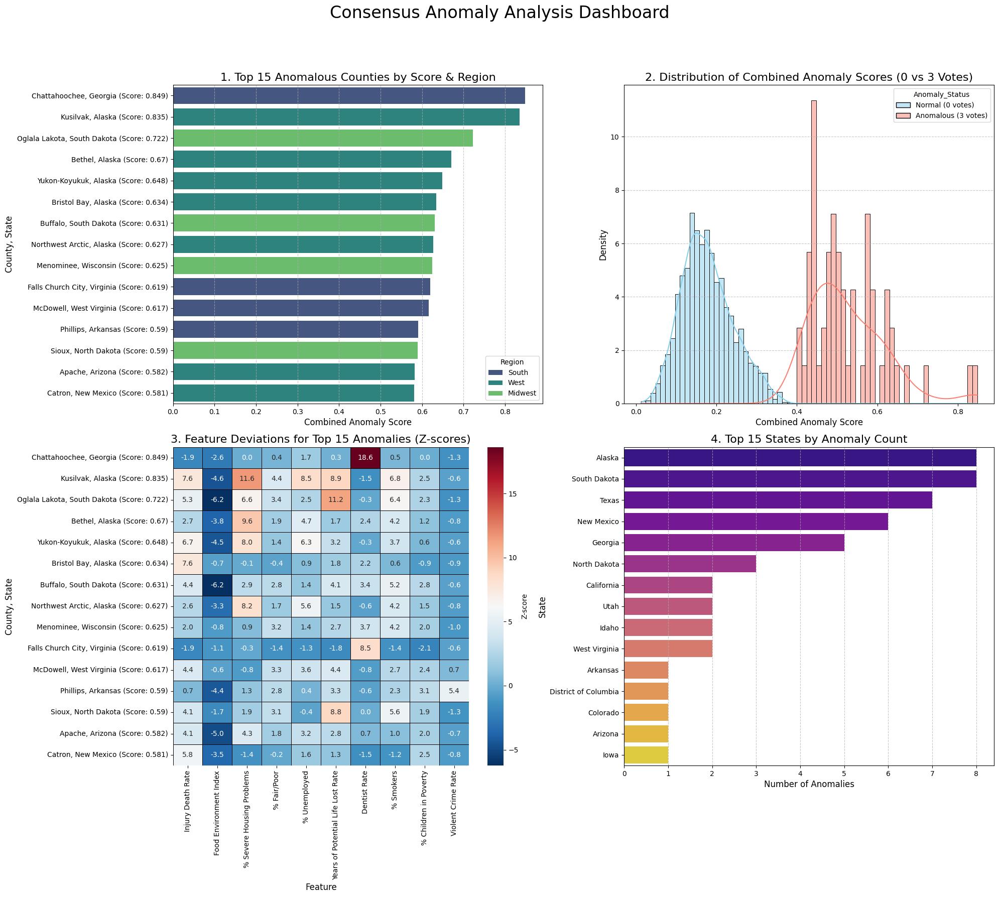

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

plt.rcParams.update({'font.size': 10}) # Adjust base font size for dashboard readability

fig, axes = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle('Consensus Anomaly Analysis Dashboard', fontsize=24, y=1.02)

# --- Plot 1: Top 15 Anomalies Bar Chart (by region) ---

sns.barplot(
    ax=axes[0, 0],
    x='combined_anomaly_score',
    y='County_State_AnomScore',
    hue='Region',
    data=top_15_anomalies_by_score.sort_values(by='combined_anomaly_score', ascending=False),
    palette='viridis',
    dodge=False, # Avoid dodging if regions overlap
    legend='full'
)
axes[0, 0].set_title('1. Top 15 Anomalous Counties by Score & Region', fontsize=16)
axes[0, 0].set_xlabel('Combined Anomaly Score', fontsize=12)
axes[0, 0].set_ylabel('County, State', fontsize=12)
axes[0, 0].grid(axis='x', linestyle='--', alpha=0.7)
axes[0, 0].tick_params(axis='both', which='major', labelsize=10)
axes[0, 0].legend(title='Region', fontsize=10, title_fontsize=10)

# --- Plot 2: Anomaly Score Distribution (histogram with KDE) ---

# Create a temporary column with descriptive labels for the legend based on 0 vs 3 votes
plot_data_for_hist = data_knn_imputed.copy()
plot_data_for_hist['Anomaly_Status'] = plot_data_for_hist['anomaly_votes'].apply(
    lambda x: 'Anomalous (3 votes)' if x == 3 else ('Normal (0 votes)' if x == 0 else np.nan)
)
plot_data_for_hist.dropna(subset=['Anomaly_Status'], inplace=True)

sns.histplot(
    ax=axes[0, 1],
    x='combined_anomaly_score',
    hue='Anomaly_Status', # Use the new descriptive column for hue
    data=plot_data_for_hist,
    kde=True,
    stat='density',
    common_norm=False, # Normalize each distribution independently
    palette={'Normal (0 votes)': 'skyblue', 'Anomalous (3 votes)': 'salmon'},
    legend=True
)
axes[0, 1].set_title('2. Distribution of Combined Anomaly Scores (0 vs 3 Votes)', fontsize=16)
axes[0, 1].set_xlabel('Combined Anomaly Score', fontsize=12)
axes[0, 1].set_ylabel('Density', fontsize=12)
axes[0, 1].grid(axis='y', linestyle='--', alpha=0.7)
axes[0, 1].tick_params(axis='both', which='major', labelsize=10)

# --- Plot 3: Feature Deviation Heatmap (top 10 features vs. top 15 anomalies) ---
# Identify top 10 most frequent extreme features from `consensus_anomalies_details_df`
all_extreme_features_consensus = []
for features_list in consensus_anomalies_details_df['Extreme Features']:
    for feature_str in features_list:
        # Extract just the feature name (before ' (High:' or ' (Low:')
        feature_name = feature_str.split(' (')[0]
        all_extreme_features_consensus.append(feature_name)

feature_frequency = pd.Series(all_extreme_features_consensus).value_counts()
top_10_features_for_heatmap = feature_frequency.head(10).index.tolist()

# Prepare Z-score data for these top features and top 15 anomalies
# Ensure `top_15_anomalies_by_score`'s index aligns with `data_zscore`
heatmap_data = data_zscore.loc[top_15_anomalies_by_score.index, top_10_features_for_heatmap]

# Add descriptive index for better readability
heatmap_data.index = top_15_anomalies_by_score['County_State_AnomScore']

sns.heatmap(
    ax=axes[1, 0],
    data=heatmap_data,
    annot=True,
    cmap='RdBu_r', # Red-Blue diverging colormap, _r reverses it so red is high
    fmt=".1f",
    linewidths=.5,
    linecolor='black',
    cbar_kws={'label': 'Z-score'}
)
axes[1, 0].set_title('3. Feature Deviations for Top 15 Anomalies (Z-scores)', fontsize=16)
axes[1, 0].set_xlabel('Feature', fontsize=12)
axes[1, 0].set_ylabel('County, State', fontsize=12)
axes[1, 0].tick_params(axis='both', which='major', labelsize=10)

# --- Plot 4: Anomaly Count by State Bar Chart (top 15 states) ---
# `anomalies_per_state` already contains the required data
# Let's ensure 'State' and 'Number of Anomalies' columns exist

top_15_states_by_anomaly_count = anomalies_per_state.head(15)
sns.barplot(
    ax=axes[1, 1],
    x='Number of Anomalies',
    y='State',
    data=top_15_states_by_anomaly_count,
    palette='plasma',
    hue='State', # Color by state for distinction
    legend=False
)
axes[1, 1].set_title('4. Top 15 States by Anomaly Count', fontsize=16)
axes[1, 1].set_xlabel('Number of Anomalies', fontsize=12)
axes[1, 1].set_ylabel('State', fontsize=12)
axes[1, 1].grid(axis='x', linestyle='--', alpha=0.7)
axes[1, 1].tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent title overlap
plt.show()

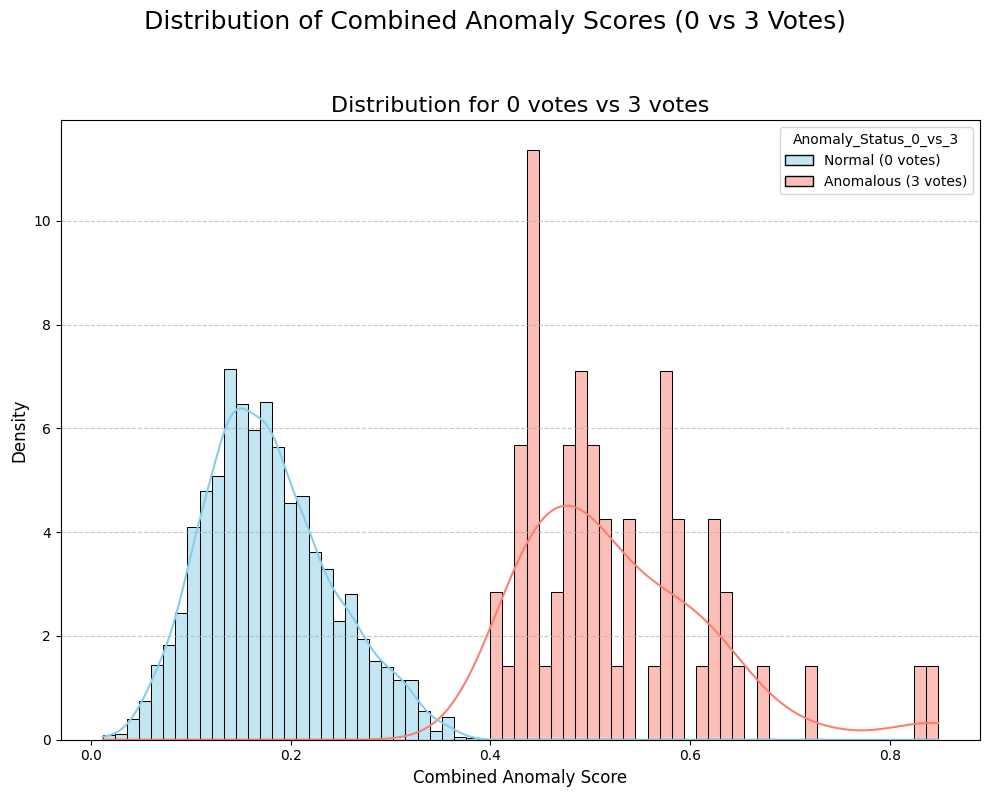

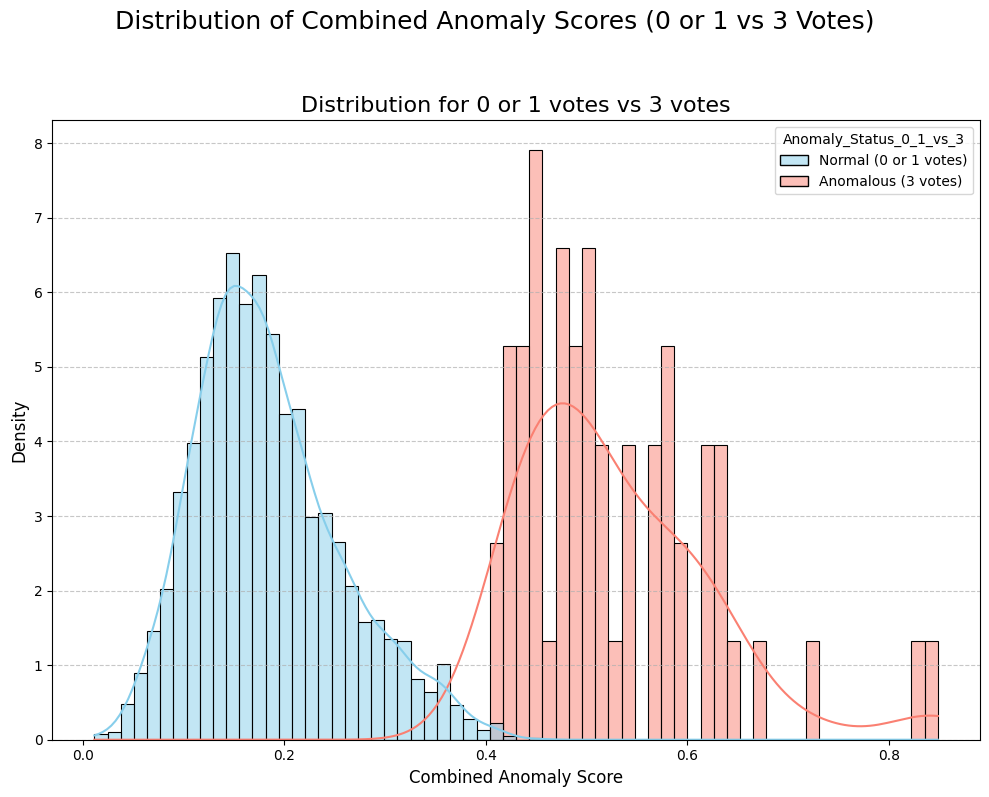

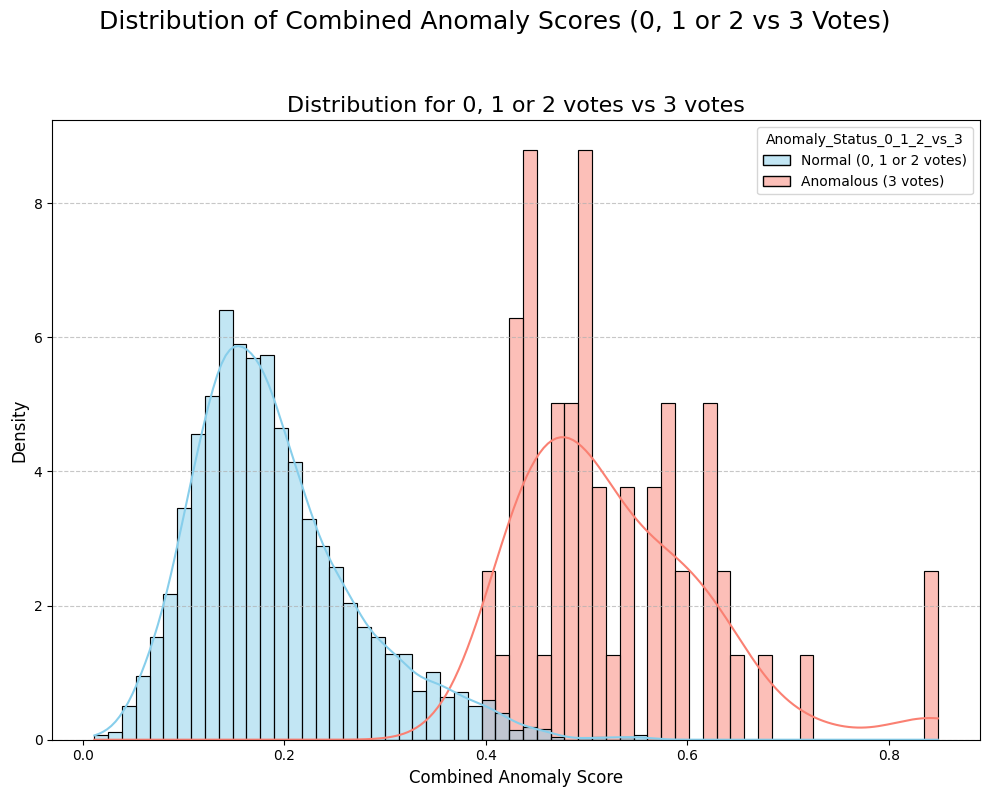

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

plt.rcParams.update({'font.size': 10})

# --- Plot 1: 0 votes vs 3 votes ---
fig1, ax1 = plt.subplots(figsize=(10, 8))
fig1.suptitle('Distribution of Combined Anomaly Scores (0 vs 3 Votes)', fontsize=18, y=1.02)

plot_data_0_vs_3 = data_knn_imputed.copy()
plot_data_0_vs_3['Anomaly_Status_0_vs_3'] = plot_data_0_vs_3['anomaly_votes'].apply(
    lambda x: 'Anomalous (3 votes)' if x == 3 else ('Normal (0 votes)' if x == 0 else np.nan)
)
plot_data_0_vs_3.dropna(subset=['Anomaly_Status_0_vs_3'], inplace=True)

sns.histplot(
    ax=ax1,
    x='combined_anomaly_score',
    hue='Anomaly_Status_0_vs_3',
    data=plot_data_0_vs_3,
    kde=True,
    stat='density',
    common_norm=False,
    palette={'Normal (0 votes)': 'skyblue', 'Anomalous (3 votes)': 'salmon'},
    legend=True
)
ax1.set_title('Distribution for 0 votes vs 3 votes', fontsize=16)
ax1.set_xlabel('Combined Anomaly Score', fontsize=12)
ax1.set_ylabel('Density', fontsize=12)
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

# --- Plot 2: 0 or 1 votes vs 3 votes ---
fig2, ax2 = plt.subplots(figsize=(10, 8))
fig2.suptitle('Distribution of Combined Anomaly Scores (0 or 1 vs 3 Votes)', fontsize=18, y=1.02)

plot_data_0_1_vs_3 = data_knn_imputed.copy()
plot_data_0_1_vs_3['Anomaly_Status_0_1_vs_3'] = plot_data_0_1_vs_3['anomaly_votes'].apply(
    lambda x: 'Anomalous (3 votes)' if x == 3 else ('Normal (0 or 1 votes)' if x in [0, 1] else np.nan)
)
plot_data_0_1_vs_3.dropna(subset=['Anomaly_Status_0_1_vs_3'], inplace=True)

sns.histplot(
    ax=ax2,
    x='combined_anomaly_score',
    hue='Anomaly_Status_0_1_vs_3',
    data=plot_data_0_1_vs_3,
    kde=True,
    stat='density',
    common_norm=False,
    palette={'Normal (0 or 1 votes)': 'skyblue', 'Anomalous (3 votes)': 'salmon'},
    legend=True
)
ax2.set_title('Distribution for 0 or 1 votes vs 3 votes', fontsize=16)
ax2.set_xlabel('Combined Anomaly Score', fontsize=12)
ax2.set_ylabel('Density', fontsize=12)
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

# --- Plot 3: 0, 1 or 2 votes vs 3 votes (similar to previous cell) ---
fig3, ax3 = plt.subplots(figsize=(10, 8))
fig3.suptitle('Distribution of Combined Anomaly Scores (0, 1 or 2 vs 3 Votes)', fontsize=18, y=1.02)

plot_data_0_1_2_vs_3 = data_knn_imputed.copy()
plot_data_0_1_2_vs_3['Anomaly_Status_0_1_2_vs_3'] = plot_data_0_1_2_vs_3['anomaly_votes'].apply(
    lambda x: 'Anomalous (3 votes)' if x == 3 else 'Normal (0, 1 or 2 votes)'
)

sns.histplot(
    ax=ax3,
    x='combined_anomaly_score',
    hue='Anomaly_Status_0_1_2_vs_3',
    data=plot_data_0_1_2_vs_3,
    kde=True,
    stat='density',
    common_norm=False,
    palette={'Normal (0, 1 or 2 votes)': 'skyblue', 'Anomalous (3 votes)': 'salmon'},
    legend=True
)
ax3.set_title('Distribution for 0, 1 or 2 votes vs 3 votes', fontsize=16)
ax3.set_xlabel('Combined Anomaly Score', fontsize=12)
ax3.set_ylabel('Density', fontsize=12)
ax3.grid(axis='y', linestyle='--', alpha=0.7)
ax3.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

## Conclusion: Unveiling Anomalous County Health Profiles

This project aimed to identify anomalous county health profiles across the United States using an ensemble of unsupervised machine learning techniques. By leveraging data from the 2018 County Health Rankings, the goal was to pinpoint counties that significantly deviate from national norms, understand the driving factors behind their anomalous status, and provide actionable insights for public health interventions and policy.

### Methodology Highlights

The initial phase involved rigorous data preprocessing, including careful handling of missing values. A comparative analysis of imputation methods (median, mean, and K-Nearest Neighbors) revealed that KNN imputation best preserved the original data distributions, which was crucial for accurate anomaly detection. Feature selection was guided by expert-defined health indicators, and all numerical features were robustly scaled to prepare the data for modeling.

The anomaly detection strategy employed an ensemble of three prominent unsupervised learning models: **Isolation Forest (IF)** , **Local Outlier Factor (LOF)** , and **One-Class Support Vector Machine (OCSVM)** . Each model was configured to identify approximately 5% of the counties as anomalous. A Z-score-based analysis was also performed to provide a univariate perspective on extreme feature values, helping to interpret the multivariate anomalies detected by the models.

### Key Findings from Anomaly Analysis

The ensemble approach proved invaluable, identifying a total of **267 unique counties** as anomalous by at least one method. A core group of **58 counties** were consistently flagged as anomalous by all three models (IF, LOF, and OCSVM), representing the most robust and extreme outliers in the dataset. This overlap analysis underscored the reliability of these particular anomalies and highlighted the complementary strengths of each algorithm:

- **Isolation Forest** was effective at identifying global anomalies, often capturing counties with broadly extreme health indicators across many features.
- **Local Outlier Factor** demonstrated sensitivity to local deviations, pinpointing counties that were outliers relative to their immediate geographical neighbors.
- **One-Class SVM**, with its ability to define complex decision boundaries, often captured subtle or non-linear patterns that contributed to a county's anomalous status.

Detailed investigation into the **58 consensus anomalous counties** revealed profound insights:

1. **Kusilvak, Alaska** emerged as the most anomalous county overall, exhibiting an exceptionally high combined anomaly score (0.835) and a staggering 11 extreme features, including severe housing problems (+11.62 SD), high premature mortality (+8.91 SD), high unemployment (+8.48 SD), and poor food access (-4.55 SD).

2. **Oglala Lakota, South Dakota**, while not the highest in combined score, presented the single most extreme feature deviation: Years of Potential Life Lost Rate at +11.19 SD, indicating exceptionally high premature mortality.

3. **Most Common Extreme Features:** Across the consensus anomalies, **Injury Death Rate (High)** , **Food Environment Index (Low)** , **% Smokers (High)** , **% Severe Housing Problems (High)** , and **% Unemployed (High)** were the most frequently occurring extreme features, highlighting critical public health challenges.

4. **Native American Counties Dominate Extreme Anomalies:** A significant finding was that 8 of the most extreme anomalous counties are home to substantial Native American populations, often located on reservations. These counties frequently displayed multi-dimensional distress across various health and social indicators.

5. **Distinct Anomaly Types:** The analysis revealed two primary types of anomalous profiles:
   - **"Distressed Rural" counties:** Characterized by high mortality, high smoking rates, high injury deaths, poor food access, and high poverty. Examples include Kusilvak (AK), Oglala Lakota (SD), and McDowell (WV).
   - **"Affluent Urban Paradoxes":** Defined by seemingly contradictory features such as low obesity and high dental access (indicators of affluence) but often coupled with high crime rates or high excessive drinking. Examples include San Francisco, New York County, and Washington D.C.

6. **Geographic Clustering:** Anomalies were found to be concentrated in rural Western and Southern states (e.g., Alaska, South Dakota, Texas, New Mexico), suggesting that rurality and regional disadvantage are significant drivers of atypical health profiles.

### Significance and Implications

The identification of these anomalous county health profiles provides a critical foundation for targeted interventions. For "Distressed Rural" counties, the findings strongly suggest a need for comprehensive public health and socio-economic support programs, addressing issues like access to healthcare, healthy food environments, and economic opportunities. The extreme values in housing problems, unemployment, and injury death rates point to systemic issues requiring multi-faceted solutions.

For "Affluent Urban Paradoxes," the anomalies highlight specific public health concerns that might be masked by overall high health status. For instance, high rates of excessive drinking or violent crime in otherwise well-resourced areas necessitate tailored behavioral health and public safety initiatives.

This project demonstrates that an ensemble anomaly detection approach, coupled with thorough feature analysis, can yield nuanced and actionable insights into complex public health landscapes. By understanding where anomalies occur and what drives them, policymakers and public health officials can more effectively allocate resources, develop evidence-based interventions, and work towards improving health equity across all counties.

# Summary

### Data Analysis Key Findings

*   An ensemble of three unsupervised machine learning models (Isolation Forest, Local Outlier Factor, and One-Class Support Vector Machine) identified a total of 267 unique anomalous counties across the U.S. health profiles.
*   A robust core group of 58 counties were consistently flagged as anomalous by all three models.
*   **Kusilvak, Alaska**, was identified as the most anomalous county overall with a combined anomaly score of 0.835, exhibiting 11 extreme features including severe housing problems (+11.62 SD), high premature mortality (+8.91 SD), high unemployment (+8.48 SD), and poor food access (-4.55 SD).
*   **Oglala Lakota, South Dakota**, featured the single most extreme deviation in "Years of Potential Life Lost Rate" at +11.19 SD.
*   The most frequently occurring extreme features among anomalous counties were High Injury Death Rate, Low Food Environment Index, High % Smokers, High % Severe Housing Problems, and High % Unemployed.
*   Eight of the most extreme anomalous counties had significant Native American populations, often located on reservations, indicating multi-dimensional distress.
*   Two primary types of anomalous county profiles were identified: "Distressed Rural" (characterized by high mortality, smoking, injury deaths, poor food access, and poverty) and "Affluent Urban Paradoxes" (showing indicators of affluence alongside issues like high crime rates or excessive drinking).
*   Anomalies showed geographic clustering in rural Western and Southern states, suggesting that rurality and regional disadvantage contribute significantly to atypical health profiles.